In [2]:
import tensorflow as tf
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import geopandas as gpd
import rasterio

from sklearn.metrics import r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
import os, h5py, numpy


pd.set_option('display.float_format', lambda x: '%.2f' % x)

In [3]:
from platform import python_version

print("python",python_version())
print("pandas",pd.__version__)
print("numpy",np.__version__)
print("geopandas",gpd.__version__)
print("rasterio",rasterio.__version__)
print("tensorflow",tf.__version__)
print("h5py",h5py.__version__)

python 3.9.12
pandas 1.5.3
numpy 1.26.4
geopandas 1.0.1
rasterio 1.4.3
tensorflow 2.11.0
h5py 3.10.0


In [4]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
tf.config.list_physical_devices()

Num GPUs Available:  0


[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]

In [6]:
# Extract values from any cell
def get_cell(cell_coor, cell_no, timestep, cell_WS, cell_manning):
    x = []
    y = []
    WSL = []
    n = []
    timestep = timestep
    
    for cell_no in range(len(cell_coor)):
        xi, yi, WSLi, mi = cell_coor[cell_no][0],cell_coor[cell_no][1],cell_WS[timestep][cell_no], cell_manning[cell_no]
        x.append(xi)
        y.append(yi)
        WSL.append(WSLi)
        n.append(mi)
    df_raw = pd.DataFrame({'X': x, 'Y': y, 'WSL': WSL})
    return(df_raw)


# Extract values from any cell
def get_coordinate(cell_coor,cell_no=0):
    x = []
    y = []
    for cell_no in range(len(cell_coor)):
        xi, yi = cell_coor[cell_no][0],cell_coor[cell_no][1]
        x.append(xi)
        y.append(yi)

    df_coordinate = pd.DataFrame({'X': x, 'Y': y})
    return(df_coordinate)

def get_pixel_value(raster_file, latitude, longitude):
    # Open the raster file
    with rasterio.open(raster_file) as src:
        # Get the row and column indices corresponding to the lat/lon coordinates
        row, col = src.index(longitude, latitude)

        # Check if the indices are within the valid range
        if 0 <= row < src.height and 0 <= col < src.width:
            # Read the pixel value at the specified row and column
            pixel_value = src.read(1, window=((row, row+1), (col, col+1)))
            return pixel_value[0]
        else:
            print("Coordinates are out of bounds for the raster dataset.")
            return None

def neg_to_zero(arr):
    # Replace negative values with zero
    arr[arr < 0] = 0
    return arr

In [7]:
# Example usage:
raster_file_path = "Terrain.Pattani_dn.Pattani_dn.tif"
latitude = 755575.043  # Example latitude 1071864.26	1729225.91
longitude = 748800.209  # Example longitude

value = get_pixel_value(raster_file_path, latitude, longitude)
print(f"Pixel value at ({latitude}, {longitude}): {value}")

Pixel value at (755575.043, 748800.209): [1.7109375]


### Read HEC-RAS Results data

In [8]:
# loading River Stations from geometry
hdfname = os.path.join(os.getcwd(),r'HEC-pattani.p40.hdf')
Plan_file = h5py.File(hdfname,'r')                   # opening of HDF file
# อ่านพิกัดของแต่ละ cell 
River_XS = list(Plan_file.get('Geometry').get('Cross Sections').get('Attributes'))

In [9]:
River_XS[0][4]

b'TOPO2022  49476.000'

In [10]:
# Flatten the tuples
flat_data = [item.decode('utf-8') if isinstance(item, bytes) else item for sublist in River_XS for item in sublist]

# Reshape the flattened data into a DataFrame
df = pd.DataFrame(np.array(flat_data).reshape(len(River_XS), -1), columns=[
    'River', 'Reach', 'RS', 'Name', 'Description', 'Len Left', 'Len Channel', 'Len Right', 'Left Bank', 'Right Bank',
    'Friction Mode', 'Contr', 'Expan', 'Contr (USF)', 'Expan (USF)', 'HP Count', 'HP Start Elev', 'HP Vert Incr', 'HP LOB Slices',
    'HP Chan Slices', 'HP ROB Slices', 'Default Centerline'
])

# Convert 'Len Left' column to numeric
df['Len Left'] = pd.to_numeric(df['Len Left'], errors='coerce')
df['HP Start Elev'] = pd.to_numeric(df['HP Start Elev'], errors='coerce')

# Display the DataFrame
df

,River,Reach,RS,Name,Description,Len Left,Len Channel,Len Right,Left Bank,Right Bank,...,Expan,Contr (USF),Expan (USF),HP Count,HP Start Elev,HP Vert Incr,HP LOB Slices,HP Chan Slices,HP ROB Slices,Default Centerline
0,PATTANI_RIVER,Reach 5,49645.77,,TOPO2022 49476.000,83.60,83.6,83.6,0.0,84.8,...,0.3,nan,nan,200,-1.87,0.1,5,5,5,0
1,PATTANI_RIVER,Reach 5,49562,,,83.90,83.9,83.9,0.471,83.932,...,0.3,nan,nan,200,-1.84,0.1,5,5,5,0
2,PATTANI_RIVER,Reach 5,49478,,,83.80,83.8,83.8,0.9420002,83.063,...,0.3,nan,nan,200,-1.87,0.1,5,5,5,0
3,PATTANI_RIVER,Reach 5,49394,,,83.80,83.8,83.8,1.413,82.195,...,0.3,nan,nan,200,-2.01,0.1,5,5,5,0
4,PATTANI_RIVER,Reach 5,49311,,,83.70,83.7,83.7,1.884,81.326,...,0.3,nan,nan,200,-2.18,0.1,5,5,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
710,PATTANI_RIVER,Reach 3,397,,TOPO2022 365.000,91.20,91.2,91.2,19.2,518.0,...,0.3,nan,nan,200,-3.15,0.1,5,5,5,0
711,PATTANI_RIVER,Reach 3,306,,,91.20,91.2,91.2,18.7,343.1,...,0.3,nan,nan,200,-2.56,0.1,5,5,5,0
712,PATTANI_RIVER,Reach 3,215,,,91.20,91.2,91.2,19.5,394.5,...,0.3,nan,nan,200,-2.02,0.1,5,5,5,0
713,PATTANI_RIVER,Reach 3,124,,,91.20,91.2,91.2,18.5,345.7,...,0.3,nan,nan,200,-2.43,0.1,5,5,5,0


In [11]:
# Assuming df is your DataFrame
# Filter based on 'River' and 'Reach' columns
filtered_df = df.loc[(df['River'] == 'PATTANI_RIVER') & (df['Reach'] == 'Reach 3')]

# Get start and end indices
start_index = filtered_df.index[0]
end_index = filtered_df.index[-1]

print("Start Index:", start_index)
print("End Index:", end_index)

Start Index: 476
End Index: 714


### [Feature] Boundary condition

#### PT sea level

,PT_m
Date,
2011-01-01 00:00:00,0.29
2011-01-01 01:00:00,0.27
2011-01-01 02:00:00,0.30
2011-01-01 03:00:00,0.33
2011-01-01 04:00:00,0.41
...,...
2021-12-31 19:00:00,0.95
2021-12-31 20:00:00,0.97
2021-12-31 21:00:00,0.91


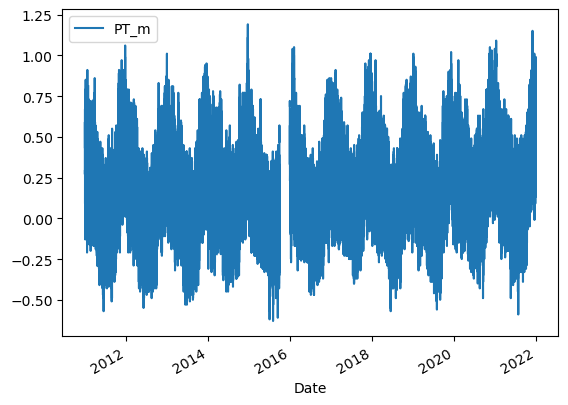

In [12]:
Boundary1 = pd.read_csv('WL_PT_station2011-2021.csv')
Boundary1['Date'] = pd.to_datetime(Boundary1['Date'])
Boundary1 = Boundary1.set_index('Date')
Boundary1.plot()
display(Boundary1)

,Pattani_dam
Date,
2011-01-01 01:00:00,441.60
2011-01-01 02:00:00,441.60
2011-01-01 03:00:00,441.60
2011-01-01 04:00:00,441.60
2011-01-01 05:00:00,441.60
...,...
2021-12-30 21:00:00,64.78
2021-12-30 22:00:00,64.78
2021-12-30 23:00:00,64.78


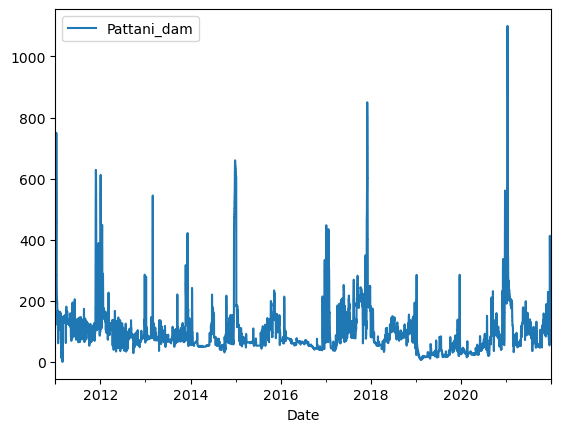

In [13]:
Boundary2 = pd.read_csv('DIS_PT_dam_2011-2021.csv')
Boundary2
# Convert 'Date' column to datetime
Boundary2['Date'] = pd.to_datetime(Boundary2['Date'])
# Set 'Date' column as the index
Boundary2.set_index('Date', inplace=True)
# Resample the DataFrame to fill missing hours
Boundary2 = Boundary2.resample('H').ffill()
Boundary2.plot()
display(Boundary2)

In [14]:
# Define multiple date ranges
date_ranges = [
    ('2020-11-01 01:00', '2021-01-10 09:00'),  # 01 NOV 2020 – 22 JAN 2021
    ('2017-11-01 01:00', '2017-12-14 01:00'),  # 01 NOV 2017 – 14 DEC 2017
    ('2014-11-01 01:00', '2015-01-10 01:00')   # 01 NOV 2014 – 10 JAN 2015
]

# Select data within the specified date ranges
Boundary1_selected = pd.concat([Boundary1[start:end] for start, end in date_ranges])
Boundary2_selected = pd.concat([Boundary2[start:end] for start, end in date_ranges])

# Display selected data
display(Boundary1_selected)
display(Boundary2_selected)


,PT_m
Date,
2020-11-01 01:00:00,0.38
2020-11-01 02:00:00,0.25
2020-11-01 03:00:00,0.21
2020-11-01 04:00:00,0.12
2020-11-01 05:00:00,0.15
...,...
2015-01-09 21:00:00,0.46
2015-01-09 22:00:00,0.55
2015-01-09 23:00:00,0.63


,Pattani_dam
Date,
2020-11-01 01:00:00,87.56
2020-11-01 02:00:00,87.56
2020-11-01 03:00:00,87.56
2020-11-01 04:00:00,87.56
2020-11-01 05:00:00,87.56
...,...
2015-01-09 21:00:00,187.00
2015-01-09 22:00:00,187.00
2015-01-09 23:00:00,187.00


In [15]:
# Change index with prefix 'ts_' and incremental numbers
Boundary1_selected.index = ['ts_{}'.format(i) for i in range(1, len(Boundary1_selected) + 1)]
display(Boundary1_selected)

# Change index with prefix 'ts_' and incremental numbers
Boundary2_selected.index = ['ts_{}'.format(i) for i in range(1, len(Boundary2_selected) + 1)]
display(Boundary2_selected)

Feature_df = pd.concat([Boundary1_selected,Boundary2_selected],axis=1)
Feature_df

,PT_m
ts_1,0.38
ts_2,0.25
ts_3,0.21
ts_4,0.12
ts_5,0.15
...,...
ts_4399,0.46
ts_4400,0.55
ts_4401,0.63
ts_4402,0.62


,Pattani_dam
ts_1,87.56
ts_2,87.56
ts_3,87.56
ts_4,87.56
ts_5,87.56
...,...
ts_4399,187.00
ts_4400,187.00
ts_4401,187.00
ts_4402,187.00


,PT_m,Pattani_dam
ts_1,0.38,87.56
ts_2,0.25,87.56
ts_3,0.21,87.56
ts_4,0.12,87.56
ts_5,0.15,87.56
...,...,...
ts_4399,0.46,187.00
ts_4400,0.55,187.00
ts_4401,0.63,187.00
ts_4402,0.62,187.00


In [16]:
# data Scaling
min_dict = dict()
max_dict = dict()
std_dict = dict()
mean_dict = dict()

for col in Feature_df.columns:
    min_dict[col] = Feature_df[col].min()
    max_dict[col] = Feature_df[col].max()
    std_dict[col] = Feature_df[col].std()
    mean_dict[col] = Feature_df[col].mean()
    
    Feature_df[col] = (Feature_df[col] - Feature_df[col].mean())/Feature_df[col].std()
    #df[col] = (df[col] - df[col].min())/(df[col].max()-df[col].min())



,PT_m,Pattani_dam
ts_1,-0.38,-0.68
ts_2,-0.99,-0.68
ts_3,-1.17,-0.68
ts_4,-1.59,-0.68
ts_5,-1.45,-0.68
...,...,...
ts_4399,-0.01,-0.18
ts_4400,0.41,-0.18
ts_4401,0.78,-0.18
ts_4402,0.74,-0.18


<Axes: >

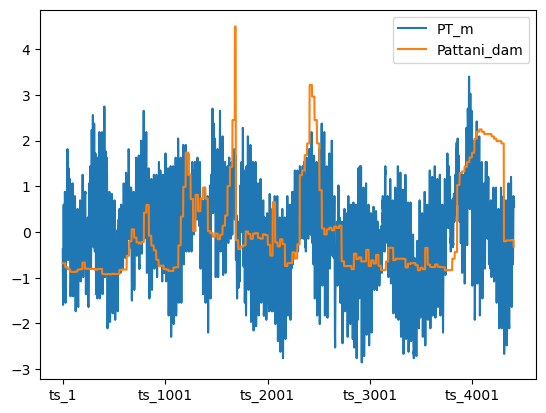

In [17]:
display(Feature_df)
Feature_df.plot()

In [18]:
STA_WS_transposed = pd.read_csv("Feature_event1-3.csv",index_col=0)
STA_WS_transposed

,STA_0,STA_1,STA_2,STA_3,STA_4,STA_5,STA_6,STA_7,STA_8,STA_9,...,STA_705,STA_706,STA_707,STA_708,STA_709,STA_710,STA_711,STA_712,STA_713,STA_714
ts_1,4.48,4.48,4.48,4.48,4.48,4.48,4.48,4.48,4.47,4.47,...,0.38,0.38,0.38,0.38,0.38,0.38,0.38,0.38,0.38,0.38
ts_2,4.68,4.67,4.67,4.67,4.67,4.67,4.67,4.67,4.67,4.67,...,0.26,0.26,0.26,0.26,0.26,0.26,0.25,0.25,0.25,0.25
ts_3,4.65,4.65,4.65,4.65,4.65,4.64,4.64,4.64,4.64,4.64,...,0.21,0.21,0.21,0.21,0.21,0.21,0.21,0.21,0.21,0.21
ts_4,4.67,4.67,4.67,4.67,4.67,4.67,4.67,4.67,4.66,4.67,...,0.13,0.13,0.13,0.13,0.13,0.12,0.12,0.12,0.12,0.12
ts_5,4.70,4.70,4.70,4.70,4.70,4.70,4.70,4.70,4.69,4.70,...,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ts_4399,5.66,5.66,5.66,5.66,5.66,5.65,5.65,5.65,5.65,5.65,...,0.46,0.46,0.46,0.46,0.46,0.46,0.46,0.46,0.46,0.46
ts_4400,5.65,5.65,5.65,5.65,5.65,5.65,5.64,5.64,5.64,5.64,...,0.55,0.55,0.55,0.55,0.55,0.55,0.55,0.55,0.55,0.55
ts_4401,5.64,5.64,5.64,5.64,5.64,5.64,5.64,5.63,5.63,5.63,...,0.63,0.63,0.63,0.63,0.63,0.63,0.63,0.63,0.63,0.63
ts_4402,5.63,5.63,5.63,5.63,5.63,5.63,5.62,5.62,5.62,5.62,...,0.62,0.62,0.62,0.62,0.62,0.62,0.62,0.62,0.62,0.62


### CNN model

### Feature preparation

In [19]:
df_feature = Feature_df
df_feature

,PT_m,Pattani_dam
ts_1,-0.38,-0.68
ts_2,-0.99,-0.68
ts_3,-1.17,-0.68
ts_4,-1.59,-0.68
ts_5,-1.45,-0.68
...,...,...
ts_4399,-0.01,-0.18
ts_4400,0.41,-0.18
ts_4401,0.78,-0.18
ts_4402,0.74,-0.18


In [20]:
lag = 12

def reframeX(df, window_size=lag):
    df_as_np = df.to_numpy()
    X = []
    for i in range(len(df_as_np)-window_size):
        row = [r for r in df_as_np[i:i+window_size]]
        X.append(row)
    return np.array(X)
X1 = reframeX(df_feature) 
X1[0]

array([[-0.38146515, -0.68497935],
       [-0.98800099, -0.68497935],
       [-1.17462741, -0.68497935],
       [-1.59453684, -0.68497935],
       [-1.45456703, -0.68497935],
       [-1.0813142 , -0.68497935],
       [-0.47477836, -0.68497935],
       [ 0.13175748, -0.68497935],
       [ 0.4116971 , -0.68497935],
       [ 0.59832352, -0.68497935],
       [ 0.17841409, -0.68497935],
       [-0.24149534, -0.68497935]])

In [21]:
X1.shape

(4391, 12, 2)

### Target Preparation

In [22]:
# df_target = pd.read_csv('df_target.csv',index_col = 0)  
# df_target = pd.read_csv('Target.csv',index_col = 0)  
df_target = STA_WS_transposed
df_target

,STA_0,STA_1,STA_2,STA_3,STA_4,STA_5,STA_6,STA_7,STA_8,STA_9,...,STA_705,STA_706,STA_707,STA_708,STA_709,STA_710,STA_711,STA_712,STA_713,STA_714
ts_1,4.48,4.48,4.48,4.48,4.48,4.48,4.48,4.48,4.47,4.47,...,0.38,0.38,0.38,0.38,0.38,0.38,0.38,0.38,0.38,0.38
ts_2,4.68,4.67,4.67,4.67,4.67,4.67,4.67,4.67,4.67,4.67,...,0.26,0.26,0.26,0.26,0.26,0.26,0.25,0.25,0.25,0.25
ts_3,4.65,4.65,4.65,4.65,4.65,4.64,4.64,4.64,4.64,4.64,...,0.21,0.21,0.21,0.21,0.21,0.21,0.21,0.21,0.21,0.21
ts_4,4.67,4.67,4.67,4.67,4.67,4.67,4.67,4.67,4.66,4.67,...,0.13,0.13,0.13,0.13,0.13,0.12,0.12,0.12,0.12,0.12
ts_5,4.70,4.70,4.70,4.70,4.70,4.70,4.70,4.70,4.69,4.70,...,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ts_4399,5.66,5.66,5.66,5.66,5.66,5.65,5.65,5.65,5.65,5.65,...,0.46,0.46,0.46,0.46,0.46,0.46,0.46,0.46,0.46,0.46
ts_4400,5.65,5.65,5.65,5.65,5.65,5.65,5.64,5.64,5.64,5.64,...,0.55,0.55,0.55,0.55,0.55,0.55,0.55,0.55,0.55,0.55
ts_4401,5.64,5.64,5.64,5.64,5.64,5.64,5.64,5.63,5.63,5.63,...,0.63,0.63,0.63,0.63,0.63,0.63,0.63,0.63,0.63,0.63
ts_4402,5.63,5.63,5.63,5.63,5.63,5.63,5.62,5.62,5.62,5.62,...,0.62,0.62,0.62,0.62,0.62,0.62,0.62,0.62,0.62,0.62


In [23]:
def reframeY(df, window_size=lag):
    df_as_np = df.to_numpy()
    df_as_np = df_as_np[window_size:]
        
    return df_as_np
#, np.array(y)
Y1 = reframeY(df_target) 


In [24]:
Y1[0]

array([4.792307  , 4.7914195 , 4.7905145 , 4.789785  , 4.7893076 ,
       4.7889433 , 4.7885942 , 4.788388  , 4.7872577 , 4.787987  ,
       4.7878237 , 4.7877836 , 4.787718  , 4.787629  , 4.7875366 ,
       4.787478  , 4.787573  , 4.787652  , 4.7875485 , 4.787405  ,
       4.787305  , 4.7871814 , 4.7870584 , 4.786931  , 4.786796  ,
       4.7867208 , 4.78666   , 4.7864714 , 4.7863116 , 4.786214  ,
       4.7864614 , 4.7864017 , 4.7862916 , 4.786293  , 4.7863026 ,
       4.786304  , 4.786302  , 4.7863    , 4.786288  , 4.7862554 ,
       4.7862186 , 4.786169  , 4.786107  , 4.786042  , 4.7857804 ,
       4.785636  , 4.7856407 , 4.785614  , 4.7854943 , 4.7850165 ,
       4.782873  , 4.7802744 , 4.7772746 , 4.76977   , 4.75765   ,
       4.7576504 , 4.7579975 , 4.7581353 , 4.7581973 , 4.758252  ,
       4.757934  , 4.7575326 , 4.75703   , 4.7564077 , 4.7556515 ,
       4.754752  , 4.753713  , 4.752571  , 4.751425  , 4.7503114 ,
       4.7495337 , 4.7488427 , 4.748234  , 4.7477098 , 4.74725

In [25]:
Y1.shape

(4391, 715)

In [26]:
len(X1)

4391

### Split train and test

In [27]:
Num_dataset = len(X1)
# Num_dataset = 840
p_train = int(0.7 * Num_dataset)
p_val = int(0.2 * Num_dataset)
p_test = Num_dataset - p_train - p_val

print(p_train+p_val+p_test)

# X1_train, Y1_train = X1[:150], Y1[:150]
# X1_val, Y1_val = X1[150:220], Y1[150:220]
# X1_test, Y1_test = X1[220:], Y1[220:]

X1_train, Y1_train = X1[:p_train], Y1[:p_train]
X1_val, Y1_val = X1[p_train:p_train+p_val], Y1[p_train:p_train+p_val]
X1_test, Y1_test = X1[p_train+p_val:], Y1[p_train+p_val:]

X1_train.shape, Y1_train.shape, X1_val.shape, Y1_val.shape, X1_test.shape, Y1_test.shape

4391


((3073, 12, 2),
 (3073, 715),
 (878, 12, 2),
 (878, 715),
 (440, 12, 2),
 (440, 715))

### Data Preprocessing (Standardizing and Normalizing data)

In [28]:
Y_training_mean = np.mean(Y1_train[:,:])
print('mean =', Y_training_mean)
Y_training_std = np.std(Y1_train[:,:])
print('std = ', Y_training_std)

mean = 2.9654678479124406
std =  2.3542131226514385


In [29]:
# def preprocess(X):
#     X[:,:] = ( X[:,:] - temp_training_mean ) / temp_training_std
#     return X

def preprocess_output(Y):
    Y[:,:] = ( Y[:,:] - Y_training_mean ) / Y_training_std
    return Y

def postprocess_output(arr):
    arr = (arr*Y_training_std) + Y_training_mean
    return arr

In [30]:
# preprocess(X1_train)
# preprocess(X1_val)
# preprocess(X1_test)

In [31]:
preprocess_output(Y1_train)
preprocess_output(Y1_val)
preprocess_output(Y1_test)


array([[ 2.12397489,  2.12067723,  2.11741032, ..., -0.89379123,
        -0.89587514, -0.89434042],
       [ 2.12617736,  2.12287524,  2.11960493, ..., -0.84315601,
        -0.84444642, -0.84336793],
       [ 2.12824621,  2.12493895,  2.12166482, ..., -0.78811074,
        -0.7888385 , -0.78814782],
       ...,
       [ 1.13814069,  1.13717833,  1.13618182, ..., -0.99199972,
        -0.99212868, -0.99203756],
       [ 1.13358584,  1.13263159,  1.13164345, ..., -0.99608755,
        -0.99649558, -0.99628522],
       [ 1.12859797,  1.12765103,  1.12667053, ..., -1.01297396,
        -1.01356582, -1.01327608]])

# Plot results

In [300]:
import matplotlib
def plot_res(Actual, Predict):
    # Create scatter plot with actual and predicted values
    fig, ax = plt.subplots(1, 1)
    plt.plot(Actual, color ='orange', label="Actual")
    plt.plot(Predict, color ='blue', label="Predict")
    plt.xlabel('Cell no.')
    plt.ylabel('WSL(m)')
    plt.title('Actual vs Predicted Values')
    plt.legend()
    plt.show()



def plotgeo_predict(df,attri,vmin=0.01,vmax=4,llabel='Water Surface Level'):
    
    lat,long = transformer.transform(df["X"], df["Y"])
    lat_df = pd.DataFrame(lat,columns=['lat'])
    long_df = pd.DataFrame(long,columns=['long'])
    latlong_df = pd.concat([lat_df, long_df], axis=1)
    new_df = pd.concat([latlong_df, df], axis=1)
    new_df


    gdf = gpd.GeoDataFrame(new_df, geometry=gpd.points_from_xy(new_df.long, new_df.lat), crs="EPSG:4326")
    #display(gdf.head(5))
    
    fig, ax = plt.subplots(1, 1)
    plt.title(f'{attri}')
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="5%", pad=0.4)
    
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.3f'))
    

    ax.set_xlim(101.22, 101.37)
    ax.set_ylim(6.70, 6.92)
    
    
    River_model = gpd.read_file(r'E:\My Thesis\QGIS\shapefile\River_latlong.shp')
    River_model.plot(ax =ax, facecolor = 'None', edgecolor = 'Blue')   

    # Create a custom colormap based on 'turbo' colormap
    cmap = matplotlib.colormaps["jet"]
    cmap.set_under('white',alpha=0)
    
    ax_gdf = gdf.plot(column=f'{attri}', cmap=cmap,
                      ax = ax,
                      cax = cax,
                      legend=True,markersize=0.5,vmin=vmin,vmax=vmax,
                      legend_kwds={"label": f'{llabel}', "orientation": "horizontal"})

    cx.add_basemap(ax_gdf, crs=gdf.crs , source=cx.providers.OpenStreetMap.Mapnik)

    
def plot_45deg(Actual,Predict):
    # Create scatter plot with actual and predicted values
    fig, ax = plt.subplots(1, 1)
    plt.scatter(Actual, Predict,s=1)
    plt.plot([0, 10], [0, 10], color = 'r', linewidth = 1)
    plt.xlim(0,10)
    plt.ylim(0,10)
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title('Actual vs Predicted Values')
    plt.show()



### Plot Train predictions

In [301]:
modelGRU = load_model("models/modelXS-GRU_06FEB.h5")
modelLSTM = load_model("models/modelXS-LSTM_06FEB.h5")

In [302]:
%%time
train_predictions_GRU = modelGRU.predict(X1_train).flatten()
train_predictions_LSTM = modelLSTM.predict(X1_train).flatten()

97/97 [==============================] - 1s 3ms/step
CPU times: total: 2.91 s
Wall time: 1.43 s


c:\Users\Weeraphat\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


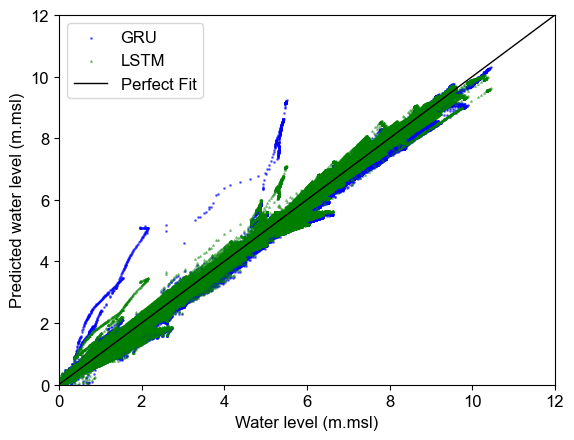

In [37]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 12

fig, ax = plt.subplots(1, 1)
plt.scatter(postprocess_output(Y1_train), postprocess_output(train_predictions_GRU), s=1, color='blue', label='GRU',alpha=0.5, marker='o')
plt.scatter(postprocess_output(Y1_train), postprocess_output(train_predictions_LSTM), s=1, color='green', label='LSTM',alpha=0.5, marker='^')
plt.plot([0, 12], [0, 12], color='k', linewidth=1, label='Perfect Fit')
plt.xlim(0,12)
plt.ylim(0,12)
plt.xlabel('Water level (m.msl)')
plt.ylabel('Predicted water level (m.msl)')
# plt.title('Actual vs Predicted Values')
plt.legend()
plt.show()

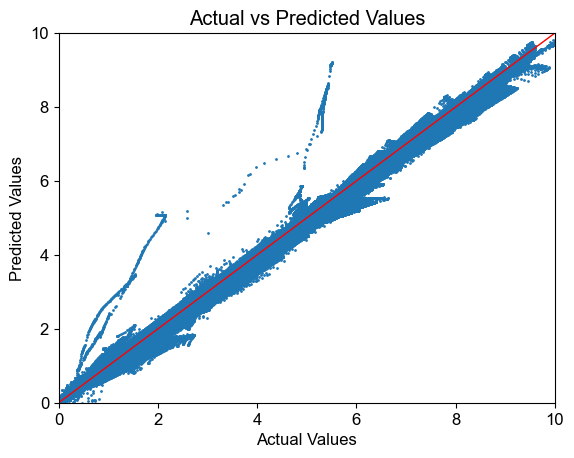

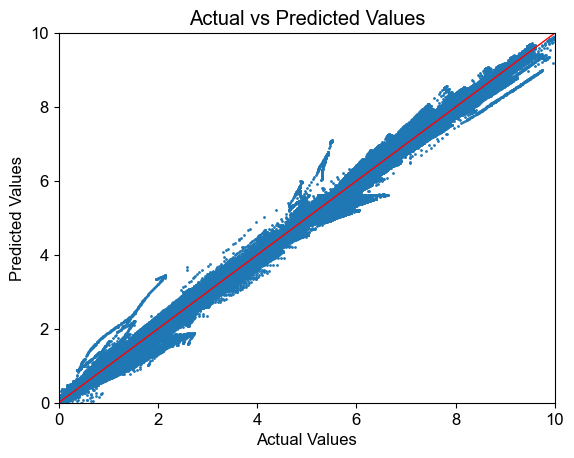

RMSE : 0.09833241312439707
R2 : 0.9982553760030505


In [303]:
# Add y to list of actual and predict

# model 1
y_actual = []
y_predict_GRU = []
y_predict_LSTM = []

no_mset1 = Y1_train.shape[1]

Y1p_train = postprocess_output(Y1_train)
Y1p_predict_GRU = postprocess_output(train_predictions_GRU)
Y1p_predict_LSTM = postprocess_output(train_predictions_LSTM)

for i in range(len(Y1p_train)):
    for j in range(len(Y1p_train[i])):
        y_actual.append(Y1p_train[i][j])
        y_predict_GRU.append(Y1p_predict_GRU[0+no_mset1*i:no_mset1+no_mset1*i][j])
        y_predict_LSTM.append(Y1p_predict_LSTM[0+no_mset1*i:no_mset1+no_mset1*i][j])
        
plot_45deg(y_actual,y_predict_GRU)
plot_45deg(y_actual,y_predict_LSTM)

MSE = np.square(np.subtract(y_actual,y_predict_GRU)).mean() 
RMSE = math.sqrt(MSE)
R2 = r2_score(y_actual, y_predict_GRU)

print("RMSE :",RMSE)
print("R2 :",R2)

### Val prediction

28/28 [==============================] - 0s 3ms/step


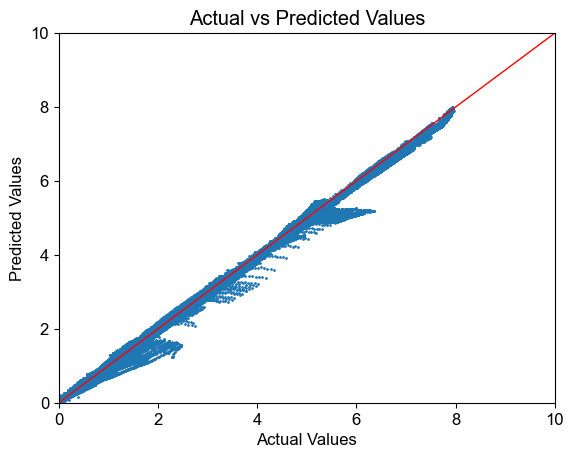

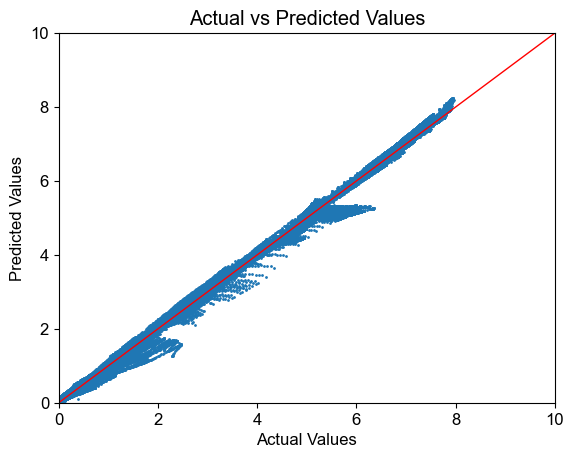

RMSE : 0.07897060516858316
R2 : 0.998730027933026


In [589]:
# Add y to list of actual and predict

# model 1
y_actual = []
y_predict_GRU = []
y_predict_LSTM = []

no_mset1 = Y1_val.shape[1]

val_predictions_GRU = modelGRU.predict(X1_val).flatten()
val_predictions_LSTM = modelLSTM.predict(X1_val).flatten()

Y1p_val = postprocess_output(Y1_val)
Y1p_predict_GRU = postprocess_output(val_predictions_GRU)
Y1p_predict_LSTM = postprocess_output(val_predictions_LSTM)


for i in range(len(Y1p_val)):
    for j in range(len(Y1p_val[i])):
        y_actual.append(Y1p_val[i][j])
        y_predict_GRU.append(Y1p_predict_GRU[0+no_mset1*i:no_mset1+no_mset1*i][j])
        y_predict_LSTM.append(Y1p_predict_LSTM[0+no_mset1*i:no_mset1+no_mset1*i][j])
        
plot_45deg(y_actual,y_predict_GRU)
plot_45deg(y_actual,y_predict_LSTM)

MSE = np.square(np.subtract(y_actual,y_predict_GRU)).mean() 
RMSE = math.sqrt(MSE)
R2 = r2_score(y_actual, y_predict_GRU)

print("RMSE :",RMSE)
print("R2 :",R2)

### Test prediction

In [36]:
%%time

test_predictions1 = modelXS1.predict(X1_test).flatten()

Y1p_test = postprocess_output(Y1_test)
Y1p_predict = postprocess_output(test_predictions1)

y_actual = []
y_predict = []
no_mset1 = Y1_test.shape[1]
for i in range(len(Y1_test)):
    for j in range(len(Y1p_test[i])):
        y_actual.append(Y1p_test[i][j])
        y_predict.append(Y1p_predict[0+no_mset1*i:no_mset1+no_mset1*i][j])
        
plot_45deg(y_actual,y_predict)

MSE = np.square(np.subtract(y_actual,y_predict)).mean() 
RMSE = math.sqrt(MSE)
R2 = r2_score(y_actual, y_predict)

print("RMSE :",RMSE)
print("R2 :",R2)


NameError: name 'modelXS1' is not defined

## Train+Test+Val

138/138 [==============================] - 0s 3ms/step


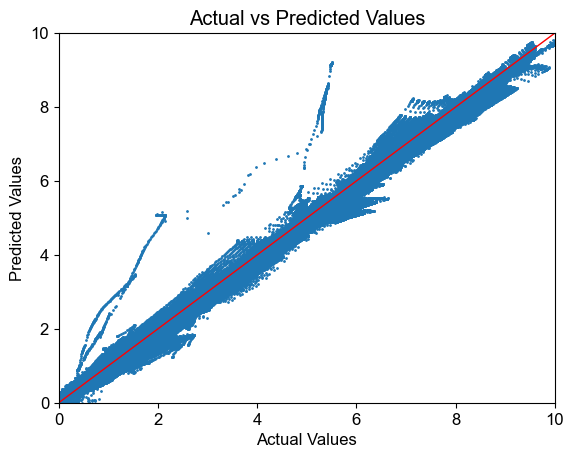

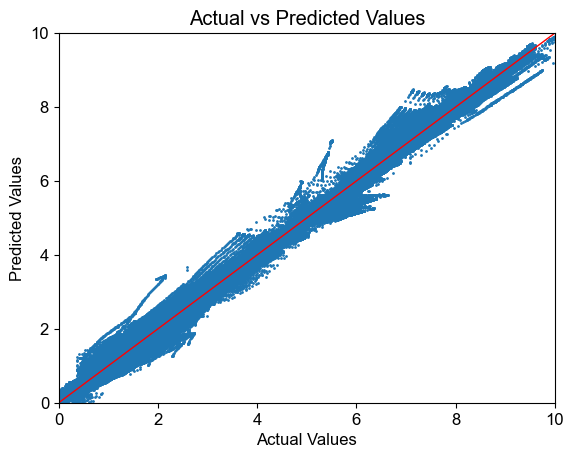

RMSE : 0.09783076730634233
R2 : 0.9983598302165609


In [272]:
# Add y to list of actual and predict

# model 1
y_actual = []
y_predict_GRU = []
y_predict_LSTM = []

no_mset1 = Y1_val.shape[1]

val_predictions_GRU = modelGRU.predict(X1).flatten()
val_predictions_LSTM = modelLSTM.predict(X1).flatten()

Y1p_val = postprocess_output(Y1)
Y1p_predict_GRU = postprocess_output(val_predictions_GRU)
Y1p_predict_LSTM = postprocess_output(val_predictions_LSTM)


for i in range(len(Y1p_val)):
    for j in range(len(Y1p_val[i])):
        y_actual.append(Y1p_val[i][j])
        y_predict_GRU.append(Y1p_predict_GRU[0+no_mset1*i:no_mset1+no_mset1*i][j])
        y_predict_LSTM.append(Y1p_predict_LSTM[0+no_mset1*i:no_mset1+no_mset1*i][j])
        
plot_45deg(y_actual,y_predict_GRU)
plot_45deg(y_actual,y_predict_LSTM)

MSE = np.square(np.subtract(y_actual,y_predict_GRU)).mean() 
RMSE = math.sqrt(MSE)
R2 = r2_score(y_actual, y_predict_GRU)

print("RMSE :",RMSE)
print("R2 :",R2)

# Plot analysis

In [304]:
# Flatten the tuples
flat_data = [item.decode('utf-8') if isinstance(item, bytes) else item for sublist in River_XS for item in sublist]

# Reshape the flattened data into a DataFrame
df = pd.DataFrame(np.array(flat_data).reshape(len(River_XS), -1), columns=[
    'River', 'Reach', 'RS', 'Name', 'Description', 'Len Left', 'Len Channel', 'Len Right', 'Left Bank', 'Right Bank',
    'Friction Mode', 'Contr', 'Expan', 'Contr (USF)', 'Expan (USF)', 'HP Count', 'HP Start Elev', 'HP Vert Incr', 'HP LOB Slices',
    'HP Chan Slices', 'HP ROB Slices', 'Default Centerline'
])

# Convert 'Len Left' column to numeric
df['Len Left'] = pd.to_numeric(df['Len Left'], errors='coerce')
df['HP Start Elev'] = pd.to_numeric(df['HP Start Elev'], errors='coerce')

# Display the DataFrame
df

,River,Reach,RS,Name,Description,Len Left,Len Channel,Len Right,Left Bank,Right Bank,...,Expan,Contr (USF),Expan (USF),HP Count,HP Start Elev,HP Vert Incr,HP LOB Slices,HP Chan Slices,HP ROB Slices,Default Centerline
0,PATTANI_RIVER,Reach 5,49645.77,,TOPO2022 49476.000,83.60,83.6,83.6,0.0,84.8,...,0.3,nan,nan,200,-1.87,0.1,5,5,5,0
1,PATTANI_RIVER,Reach 5,49562,,,83.90,83.9,83.9,0.471,83.932,...,0.3,nan,nan,200,-1.84,0.1,5,5,5,0
2,PATTANI_RIVER,Reach 5,49478,,,83.80,83.8,83.8,0.9420002,83.063,...,0.3,nan,nan,200,-1.87,0.1,5,5,5,0
3,PATTANI_RIVER,Reach 5,49394,,,83.80,83.8,83.8,1.413,82.195,...,0.3,nan,nan,200,-2.01,0.1,5,5,5,0
4,PATTANI_RIVER,Reach 5,49311,,,83.70,83.7,83.7,1.884,81.326,...,0.3,nan,nan,200,-2.18,0.1,5,5,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
710,PATTANI_RIVER,Reach 3,397,,TOPO2022 365.000,91.20,91.2,91.2,19.2,518.0,...,0.3,nan,nan,200,-3.15,0.1,5,5,5,0
711,PATTANI_RIVER,Reach 3,306,,,91.20,91.2,91.2,18.7,343.1,...,0.3,nan,nan,200,-2.56,0.1,5,5,5,0
712,PATTANI_RIVER,Reach 3,215,,,91.20,91.2,91.2,19.5,394.5,...,0.3,nan,nan,200,-2.02,0.1,5,5,5,0
713,PATTANI_RIVER,Reach 3,124,,,91.20,91.2,91.2,18.5,345.7,...,0.3,nan,nan,200,-2.43,0.1,5,5,5,0


In [305]:
results_df_GRU = pd.DataFrame({'y_actual': y_actual, 'y_predict': y_predict_GRU})
results_df_LSTM = pd.DataFrame({'y_actual': y_actual, 'y_predict': y_predict_LSTM})

In [306]:
filtered_df = df.loc[(df['River'] == 'PATTANI_RIVER') & 
                      (df['Reach'] == 'Reach 3') & 
                      (df['RS'] == '4623')]

filtered_df.index

Int64Index([663], dtype='int64')

#### Pattani River

In [47]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from math import sqrt

# Determine number of timesteps and cross-sections per timestep
num_timesteps = len(results_df_GRU) // 715  # Assuming 715 rows per timestep

# Initialize empty lists to store data
all_actual = []
all_predict_GRU = []
all_predict_LSTM = []

# Loop through each timestep and collect data
for i in range(num_timesteps):
    subset_df_GRU = results_df_GRU[0 + 715 * i: 715 + 715 * i].reset_index(drop=True)
    all_actual.append(subset_df_GRU['y_actual'].values)
    all_predict_GRU.append(subset_df_GRU['y_predict'].values)

    subset_df_LSTM = results_df_LSTM[0 + 715 * i: 715 + 715 * i].reset_index(drop=True)
    all_predict_LSTM.append(subset_df_LSTM['y_predict'].values)

# Convert lists to arrays for easier calculation

all_actual = np.array(all_actual) # Shape: (num_timesteps, 715)
all_predict_GRU = np.array(all_predict_GRU)
all_predict_LSTM = np.array(all_predict_LSTM)

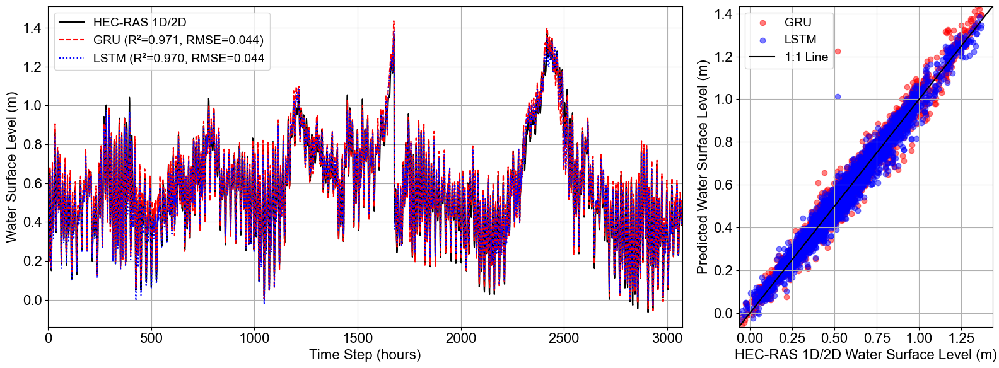

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error

# Select the time series data for station 663
station_index = 663  # Assuming 0-based index
y_actual = all_actual[:, station_index]
y_pred_gru = all_predict_GRU[:, station_index]
y_pred_lstm = all_predict_LSTM[:, station_index]

# Calculate R² and RMSE
r2_gru = r2_score(y_actual, y_pred_gru)
r2_lstm = r2_score(y_actual, y_pred_lstm)
rmse_gru = np.sqrt(mean_squared_error(y_actual, y_pred_gru))
rmse_lstm = np.sqrt(mean_squared_error(y_actual, y_pred_lstm))

# Set font sizes
title_fontsize = 14
label_fontsize = 16
tick_fontsize = 16
legend_fontsize = 14

# Set up figure with two subplots: Time Series (larger) and 1:1 Plot (smaller)
fig = plt.figure(figsize=(16, 6))

# Create grid spec for resizing subplot areas
gs = fig.add_gridspec(1, 2, width_ratios=[2.5, 1])  # Give more space to time series

# Time Series Plot (Left)
ax1 = fig.add_subplot(gs[0])
ax1.plot(y_actual, label='HEC-RAS 1D/2D', color='k', linestyle='-')
ax1.plot(y_pred_gru, label=f'GRU (R²={r2_gru:.3f}, RMSE={rmse_gru:.3f})', color='r', linestyle='--')
ax1.plot(y_pred_lstm, label=f'LSTM (R²={r2_lstm:.3f}, RMSE={rmse_lstm:.3f}', color='b', linestyle=':')

# Formatting time series plot
ax1.set_xlabel('Time Step (hours)', fontsize=label_fontsize)
ax1.set_ylabel('Water Surface Level (m)', fontsize=label_fontsize)
ax1.legend(fontsize=legend_fontsize)
ax1.tick_params(axis='both', labelsize=tick_fontsize)
ax1.set_xlim(0, len(y_actual))
ax1.grid()

# 1:1 Scatter Plot (Right)
ax2 = fig.add_subplot(gs[1])
ax2.scatter(y_actual, y_pred_gru, color='r', alpha=0.5, label=f'GRU')
ax2.scatter(y_actual, y_pred_lstm, color='b', alpha=0.5, label=f'LSTM')

# 1:1 reference line
min_val = min(y_actual.min(), y_pred_gru.min(), y_pred_lstm.min())
max_val = max(y_actual.max(), y_pred_gru.max(), y_pred_lstm.max())
ax2.plot([min_val-1, max_val+1], [min_val-1, max_val+1], color='black', linestyle='-', label="1:1 Line")

# Formatting 1:1 plot
ax2.set_xlabel("HEC-RAS 1D/2D Water Surface Level (m)", fontsize=label_fontsize)
ax2.set_ylabel("Predicted Water Surface Level (m)", fontsize=label_fontsize)
ax2.set_ylim(min_val, max_val)
ax2.set_xlim(min_val, max_val)
ax2.legend(fontsize=legend_fontsize)
ax2.tick_params(axis='both', labelsize=tick_fontsize)
ax2.grid()

# Adjust layout and show plot
plt.tight_layout()
plt.show()


In [51]:
geom_df = df[start_index:end_index]

geom_df = pd.concat([df[0:54], df[135:345], df[476:714]], axis=0)
geom_df['STA'] = geom_df['Len Left'].cumsum()
geom_df = geom_df.reset_index(drop=True)

# Save data
min_el_dict = dict()
max_el_dict = dict()

for col in geom_df.columns:
    min_el_dict[col] = geom_df[col].min()
    max_el_dict[col] = geom_df[col].max()

geom_df

,River,Reach,RS,Name,Description,Len Left,Len Channel,Len Right,Left Bank,Right Bank,...,Contr (USF),Expan (USF),HP Count,HP Start Elev,HP Vert Incr,HP LOB Slices,HP Chan Slices,HP ROB Slices,Default Centerline,STA
0,PATTANI_RIVER,Reach 5,49645.77,,TOPO2022 49476.000,83.60,83.6,83.6,0.0,84.8,...,nan,nan,200,-1.87,0.1,5,5,5,0,83.60
1,PATTANI_RIVER,Reach 5,49562,,,83.90,83.9,83.9,0.471,83.932,...,nan,nan,200,-1.84,0.1,5,5,5,0,167.50
2,PATTANI_RIVER,Reach 5,49478,,,83.80,83.8,83.8,0.9420002,83.063,...,nan,nan,200,-1.87,0.1,5,5,5,0,251.30
3,PATTANI_RIVER,Reach 5,49394,,,83.80,83.8,83.8,1.413,82.195,...,nan,nan,200,-2.01,0.1,5,5,5,0,335.10
4,PATTANI_RIVER,Reach 5,49311,,,83.70,83.7,83.7,1.884,81.326,...,nan,nan,200,-2.18,0.1,5,5,5,0,418.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497,PATTANI_RIVER,Reach 3,477,,,79.90,79.9,79.9,28.5,382.4,...,nan,nan,200,-2.91,0.1,5,5,5,0,49266.80
498,PATTANI_RIVER,Reach 3,397,,TOPO2022 365.000,91.20,91.2,91.2,19.2,518.0,...,nan,nan,200,-3.15,0.1,5,5,5,0,49358.00
499,PATTANI_RIVER,Reach 3,306,,,91.20,91.2,91.2,18.7,343.1,...,nan,nan,200,-2.56,0.1,5,5,5,0,49449.20
500,PATTANI_RIVER,Reach 3,215,,,91.20,91.2,91.2,19.5,394.5,...,nan,nan,200,-2.02,0.1,5,5,5,0,49540.40


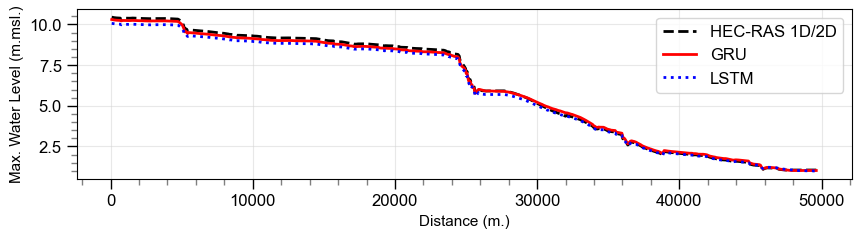

In [52]:
import numpy as np
import matplotlib.pyplot as plt

# Select the specified indices
selected_indices = np.concatenate([np.arange(0, 54), np.arange(135, 345), np.arange(476, 714)])

# Extract the mean, max, min, and standard deviation values across all timesteps for each cross-section
max_actual = all_actual[:, selected_indices].max(axis=0)
max_predict_GRU = all_predict_GRU[:, selected_indices].max(axis=0)
max_predict_LSTM = all_predict_LSTM[:, selected_indices].max(axis=0)

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 2.2))

# Plot max values
plt.plot(distances, max_actual, label='HEC-RAS 1D/2D', linestyle='--', color='black',lw=2, alpha=1)
plt.plot(distances, max_predict_GRU, label='GRU', linestyle='-', color='red',lw=2, alpha=1)
plt.plot(distances, max_predict_LSTM, label='LSTM', linestyle=':', color='blue',lw=2, alpha=1)

plt.xlabel('Distance (m.)', fontsize=11)
plt.ylabel('Max. Water Level (m.msl.)', fontsize=11)
# plt.title('Observed vs Predicted Water Levels by Distance')

plt.grid(True, color='lightgray',alpha=0.5) 
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()

plt.show()

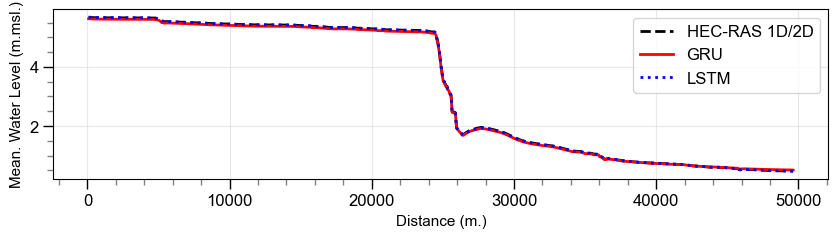

In [664]:
import numpy as np
import matplotlib.pyplot as plt

# Select the specified indices
selected_indices = np.concatenate([np.arange(0, 54), np.arange(135, 345), np.arange(476, 714)])

# Extract the mean, max, min, and standard deviation values across all timesteps for each cross-section
mean_actual = all_actual[:, selected_indices].mean(axis=0)
mean_predict_GRU = all_predict_GRU[:, selected_indices].mean(axis=0)
mean_predict_LSTM = all_predict_LSTM[:, selected_indices].mean(axis=0)

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 2.2))

# Plot max values
plt.plot(distances, mean_actual, label='HEC-RAS 1D/2D', linestyle='--', color='black',lw=2, alpha=1)
plt.plot(distances, mean_predict_GRU, label='GRU', linestyle='-', color='red',lw=2, alpha=1)
plt.plot(distances, mean_predict_LSTM, label='LSTM', linestyle=':', color='blue',lw=2, alpha=1)
plt.xlabel('Distance (m.)', fontsize=11)
plt.ylabel('Mean. Water Level (m.msl.)', fontsize=11)
# plt.title('Observed vs Predicted Water Levels by Distance')
# Add minor ticks
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()
plt.grid(True, color='lightgray',alpha=0.5) 
plt.show()

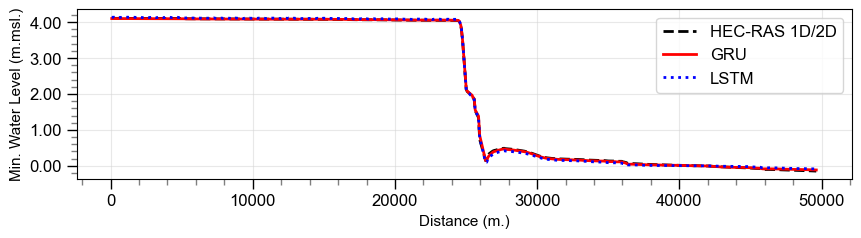

In [665]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter


# Function to format y-axis tick labels to 2 decimal places
def format_func(value, tick_number):
    return f'{value:.2f}'

# Select the specified indices
selected_indices = np.concatenate([np.arange(0, 54), np.arange(135, 345), np.arange(476, 714)])

# Extract the mean, max, min, and standard deviation values across all timesteps for each cross-section
min_actual = all_actual[:, selected_indices].min(axis=0)
min_predict_GRU = all_predict_GRU[:, selected_indices].min(axis=0)
min_predict_LSTM = all_predict_LSTM[:, selected_indices].min(axis=0)

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 2.2))

# Plot max values
plt.plot(distances, min_actual, label='HEC-RAS 1D/2D', linestyle='--', color='black',lw=2, alpha=1)
plt.plot(distances, min_predict_GRU, label='GRU', linestyle='-', color='red',lw=2, alpha=1)
plt.plot(distances, min_predict_LSTM, label='LSTM', linestyle=':', color='blue',lw=2, alpha=1)

plt.xlabel('Distance (m.)', fontsize=11)
plt.ylabel('Min. Water Level (m.msl.)', fontsize=11)
# plt.title('Observed vs Predicted Water Levels by Distance')
# Format y-axis tick labels to 2 decimal places
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_func))

# Add minor ticks
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')
# plt.ylim(0,4)
plt.legend()
plt.grid(True, color='lightgray',alpha=0.5) 
plt.show()

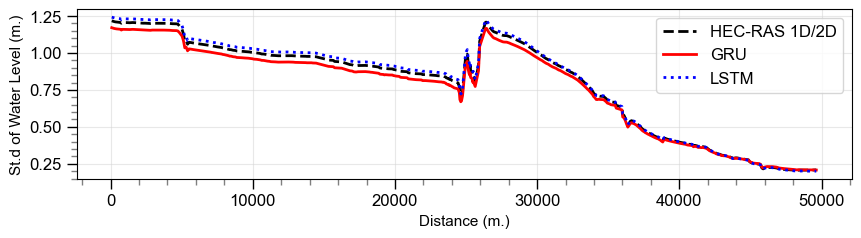

In [666]:
import numpy as np
import matplotlib.pyplot as plt

# Select the specified indices
selected_indices = np.concatenate([np.arange(0, 54), np.arange(135, 345), np.arange(476, 714)])

# Extract the standard deviation values across all timesteps for each cross-section
std_actual = all_actual[:, selected_indices].std(axis=0)
std_predict_GRU = all_predict_GRU[:, selected_indices].std(axis=0)
std_predict_LSTM = all_predict_LSTM[:, selected_indices].std(axis=0)

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 2.2))

# Plot standard deviation values
plt.plot(distances, std_actual, label='HEC-RAS 1D/2D', linestyle='--', color='black',lw=2, alpha=1)
plt.plot(distances, std_predict_GRU, label='GRU', linestyle='-', color='red',lw=2, alpha=1)
plt.plot(distances, std_predict_LSTM, label='LSTM', linestyle=':', color='blue',lw=2, alpha=1)

plt.xlabel('Distance (m.)', fontsize=11)
plt.ylabel('St.d of Water Level (m.)', fontsize=11)
# plt.title('Observed vs Predicted Water Levels by Distance')

# Add minor ticks
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()
plt.grid(True, color='lightgray', alpha=0.5)
plt.show()

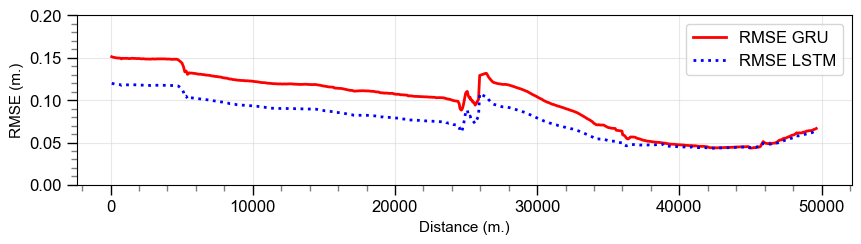

In [667]:
plt.rcParams['font.family'] = 'Arial'
# Select the specified indices
selected_indices = np.concatenate([np.arange(0, 54), np.arange(135, 345), np.arange(476, 714)])

# Extract the actual and predicted values for the selected indices
actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 2.2))

# Plot RMSE values
plt.plot(distances, rmse_GRU, label='RMSE GRU', linestyle='-', color='red', lw=2, alpha=1)
plt.plot(distances, rmse_LSTM, label='RMSE LSTM', linestyle=':', color='blue', lw=2, alpha=1)

plt.xlabel('Distance (m.)', fontsize=11)
plt.ylabel('RMSE (m.)', fontsize=11)
# plt.title('RMSE of Predicted Water Levels by Distance')
plt.ylim(0, 0.2)
# Add minor ticks
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()
plt.grid(True, color='lightgray', alpha=0.5)
plt.show()

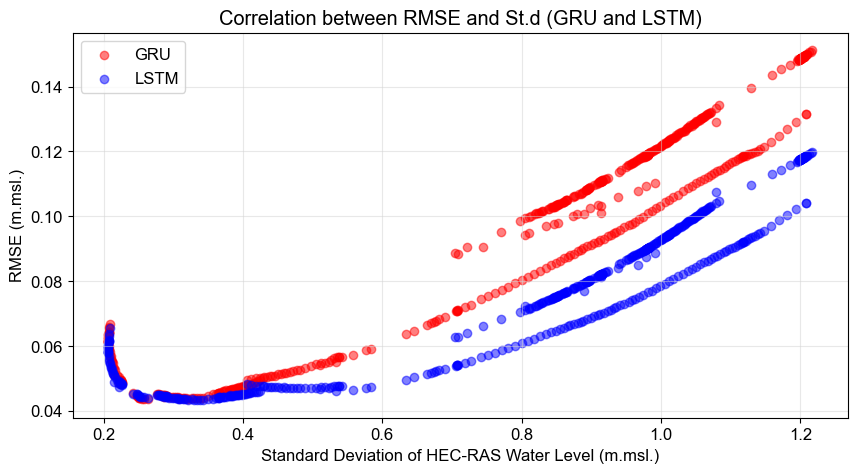

In [668]:
import numpy as np
import matplotlib.pyplot as plt

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'

# Select the specified indices
selected_indices = np.concatenate([np.arange(0, 54), np.arange(135, 345), np.arange(476, 714)])

# Extract the actual and predicted values for the selected indices
actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Calculate standard deviation for the actual values (HEC-RAS)
std_actual = actual_values.std(axis=0)

# Plot the correlation between RMSE and standard deviation of HEC-RAS
plt.figure(figsize=(10, 5))

# Scatter plot for GRU and LSTM in one graph
plt.scatter(std_actual, rmse_GRU, color='red', alpha=0.5, label='GRU')
plt.scatter(std_actual, rmse_LSTM, color='blue', alpha=0.5, label='LSTM')

plt.xlabel('Standard Deviation of HEC-RAS Water Level (m.msl.)')
plt.ylabel('RMSE (m.msl.)')
plt.title('Correlation between RMSE and St.d (GRU and LSTM)')
plt.grid(True, color='lightgray', alpha=0.5)
plt.legend()

plt.show()

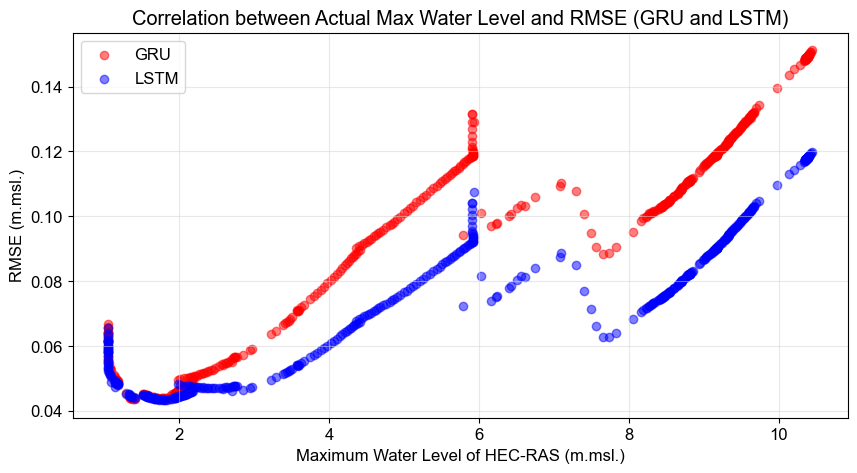

In [669]:
import numpy as np
import matplotlib.pyplot as plt

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'

# Select the specified indices
selected_indices = np.concatenate([np.arange(0, 54), np.arange(135, 345), np.arange(476, 714)])

# Extract the actual and predicted values for the selected indices
actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Extract the maximum water levels for the actual values
max_actual = actual_values.max(axis=0)

# Plot the correlation between actual max water levels and RMSE
plt.figure(figsize=(10, 5))

# Scatter plot for GRU and LSTM in one graph
plt.scatter(max_actual, rmse_GRU, color='red', alpha=0.5, label='GRU')
plt.scatter(max_actual, rmse_LSTM, color='blue', alpha=0.5, label='LSTM')

plt.xlabel('Maximum Water Level of HEC-RAS (m.msl.)')
plt.ylabel('RMSE (m.msl.)')
plt.title('Correlation between Actual Max Water Level and RMSE (GRU and LSTM)')
plt.grid(True, color='lightgray', alpha=0.5)
plt.legend()

plt.show()

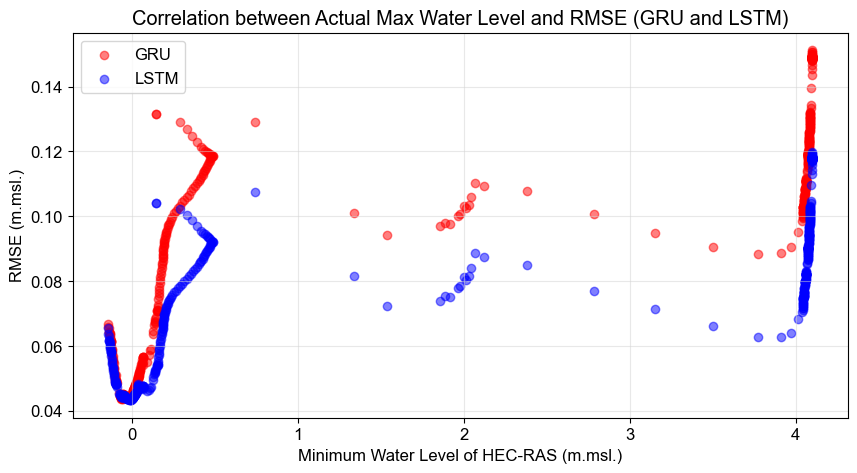

In [670]:
import numpy as np
import matplotlib.pyplot as plt

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'

# Select the specified indices
selected_indices = np.concatenate([np.arange(0, 54), np.arange(135, 345), np.arange(476, 714)])

# Extract the actual and predicted values for the selected indices
actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Extract the maximum water levels for the actual values
min_actual = actual_values.min(axis=0)

# Plot the correlation between actual max water levels and RMSE
plt.figure(figsize=(10, 5))

# Scatter plot for GRU and LSTM in one graph
plt.scatter(min_actual, rmse_GRU, color='red', alpha=0.5, label='GRU')
plt.scatter(min_actual, rmse_LSTM, color='blue', alpha=0.5, label='LSTM')

plt.xlabel('Minimum Water Level of HEC-RAS (m.msl.)')
plt.ylabel('RMSE (m.msl.)')
plt.title('Correlation between Actual Max Water Level and RMSE (GRU and LSTM)')
plt.grid(True, color='lightgray', alpha=0.5)
plt.legend()

plt.show()

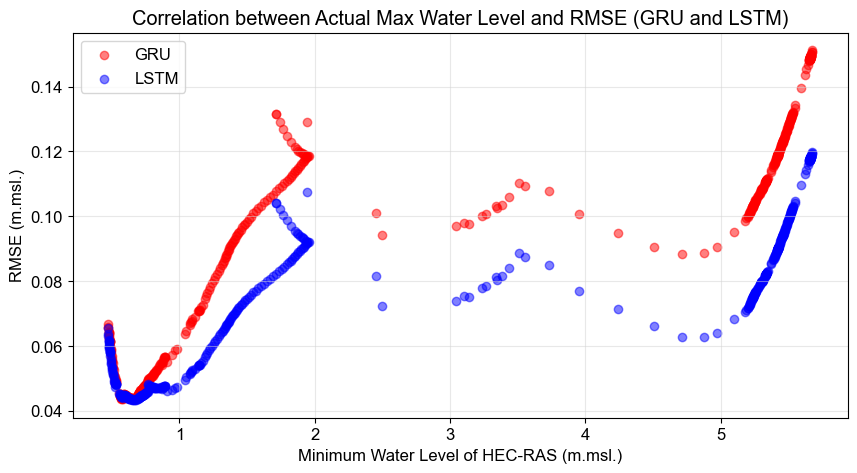

In [671]:
import numpy as np
import matplotlib.pyplot as plt

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'

# Select the specified indices
selected_indices = np.concatenate([np.arange(0, 54), np.arange(135, 345), np.arange(476, 714)])

# Extract the actual and predicted values for the selected indices
actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Extract the maximum water levels for the actual values
mean_actual = actual_values.mean(axis=0)

# Plot the correlation between actual max water levels and RMSE
plt.figure(figsize=(10, 5))

# Scatter plot for GRU and LSTM in one graph
plt.scatter(mean_actual, rmse_GRU, color='red', alpha=0.5, label='GRU')
plt.scatter(mean_actual, rmse_LSTM, color='blue', alpha=0.5, label='LSTM')

plt.xlabel('Minimum Water Level of HEC-RAS (m.msl.)')
plt.ylabel('RMSE (m.msl.)')
plt.title('Correlation between Actual Max Water Level and RMSE (GRU and LSTM)')
plt.grid(True, color='lightgray', alpha=0.5)
plt.legend()

plt.show()

In [672]:
all_actual.shape

(3073, 715)

In [673]:
import numpy as np

# Select the specified indices
selected_indices = np.concatenate([np.arange(0, 54), np.arange(135, 345), np.arange(476, 714)])

# Extract statistics across all timesteps for each cross-section
max_actual = all_actual[:, selected_indices].max(axis=0)
max_predict_GRU = all_predict_GRU[:, selected_indices].max(axis=0)
max_predict_LSTM = all_predict_LSTM[:, selected_indices].max(axis=0)

min_actual = all_actual[:, selected_indices].min(axis=0)
min_predict_GRU = all_predict_GRU[:, selected_indices].min(axis=0)
min_predict_LSTM = all_predict_LSTM[:, selected_indices].min(axis=0)

mean_actual = all_actual[:, selected_indices].mean(axis=0)
mean_predict_GRU = all_predict_GRU[:, selected_indices].mean(axis=0)
mean_predict_LSTM = all_predict_LSTM[:, selected_indices].mean(axis=0)

std_actual = all_actual[:, selected_indices].std(axis=0)
std_predict_GRU = all_predict_GRU[:, selected_indices].std(axis=0)
std_predict_LSTM = all_predict_LSTM[:, selected_indices].std(axis=0)

# Function to compute RMSE
def compute_rmse(actual, predicted):
    return np.sqrt(np.mean((actual - predicted) ** 2))

# Compute RMSE for each statistic
rmse_min_GRU = compute_rmse(min_actual, min_predict_GRU)
rmse_min_LSTM = compute_rmse(min_actual, min_predict_LSTM)

rmse_max_GRU = compute_rmse(max_actual, max_predict_GRU)
rmse_max_LSTM = compute_rmse(max_actual, max_predict_LSTM)

rmse_mean_GRU = compute_rmse(mean_actual, mean_predict_GRU)
rmse_mean_LSTM = compute_rmse(mean_actual, mean_predict_LSTM)

rmse_std_GRU = compute_rmse(std_actual, std_predict_GRU)
rmse_std_LSTM = compute_rmse(std_actual, std_predict_LSTM)

rmse_GRU = compute_rmse(all_actual[:, selected_indices], all_predict_GRU[:, selected_indices])
rmse_LSTM = compute_rmse(all_actual[:, selected_indices], all_predict_LSTM[:, selected_indices])

# Print RMSE values
print(f"RMSE for Max - GRU: {rmse_max_GRU:.4f}")
print(f"RMSE for Max - LSTM: {rmse_max_LSTM:.4f}")

print(f"RMSE for Min - GRU: {rmse_min_GRU:.4f}")
print(f"RMSE for Min - LSTM: {rmse_min_LSTM:.4f}")

print(f"RMSE for Mean - GRU: {rmse_mean_GRU:.4f}")
print(f"RMSE for Mean - LSTM: {rmse_mean_LSTM:.4f}")

print(f"RMSE for Std - GRU: {rmse_std_GRU:.4f}")
print(f"RMSE for Std - LSTM: {rmse_std_LSTM:.4f}")

print(f"RMSE for - GRU: {rmse_GRU:.4f}")
print(f"RMSE for - LSTM: {rmse_LSTM:.4f}")


RMSE for Max - GRU: 0.1228
RMSE for Max - LSTM: 0.2423
RMSE for Min - GRU: 0.0133
RMSE for Min - LSTM: 0.0362
RMSE for Mean - GRU: 0.0353
RMSE for Mean - LSTM: 0.0039
RMSE for Std - GRU: 0.0341
RMSE for Std - LSTM: 0.0179
RMSE for - GRU: 0.1011
RMSE for - LSTM: 0.0792


In [674]:
all_predict_GRU.shape

(3073, 715)

C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\1865569045.py:11: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  tr = PolarAxes.PolarTransform()
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\1865569045.py:123: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  plt.clabel(dia_GRU.add_contours(colors='red'), inline=0, fontsize=0)
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\1865569045.py:91: MatplotlibDeprecationWarning: The get_cmap function was de

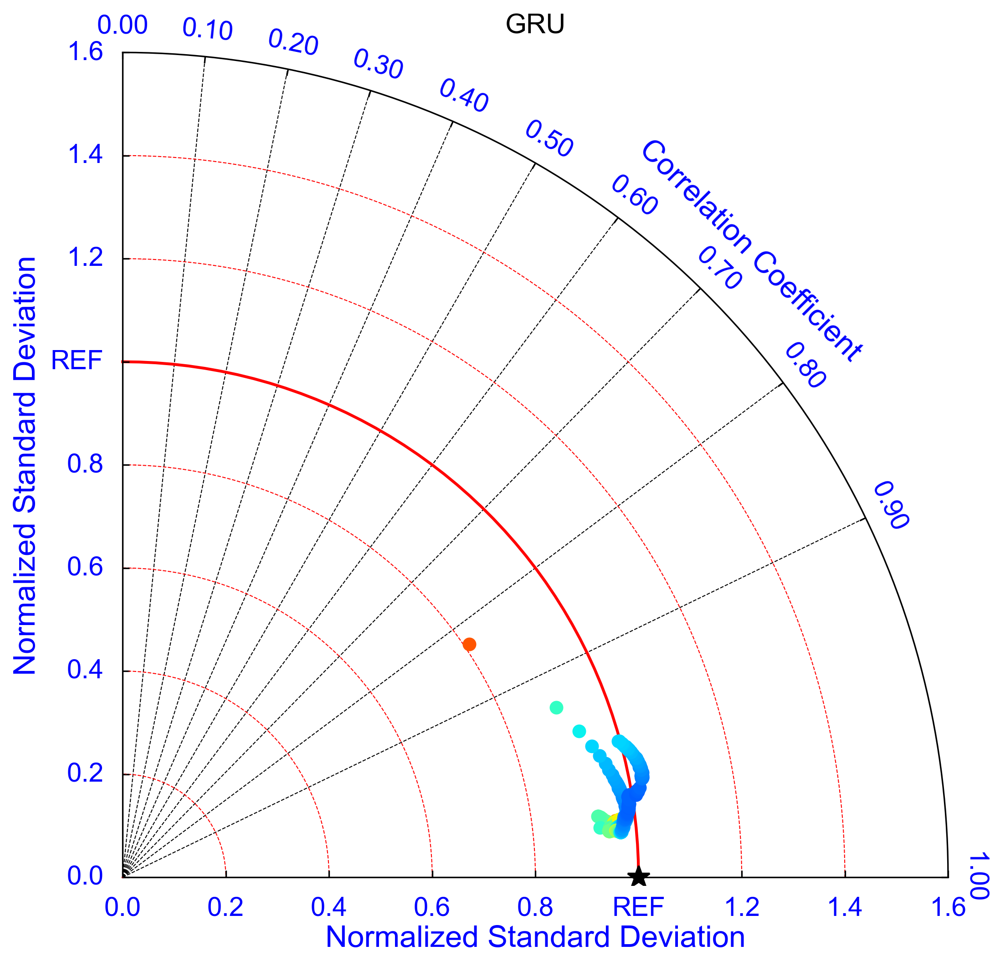

C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\1865569045.py:139: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  plt.clabel(dia_LSTM.add_contours(colors='red'), inline=0, fontsize=0)


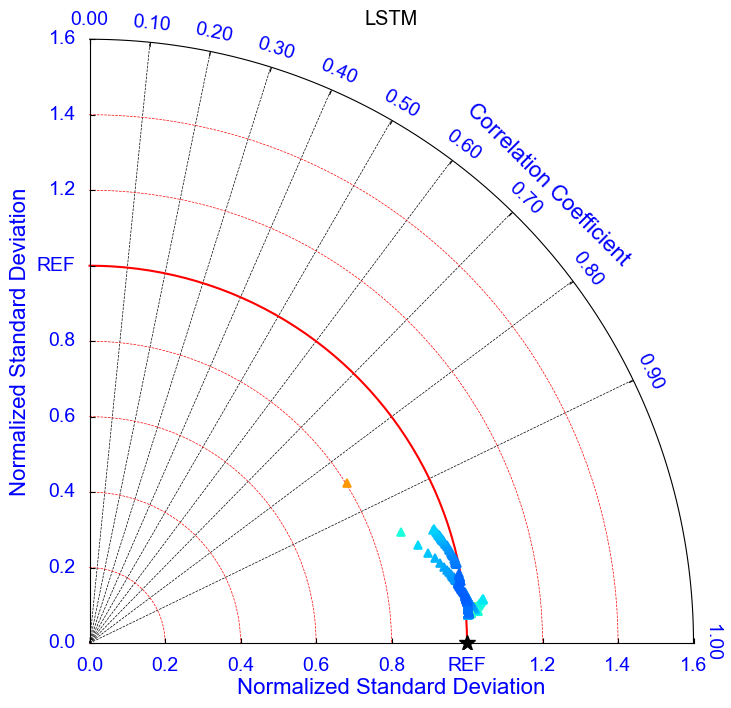

In [675]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.projections import PolarAxes
import mpl_toolkits.axisartist.grid_finder as gf
import mpl_toolkits.axisartist.floating_axes as fa
import matplotlib.cm as cm

class TaylorDiagram(object):
    def __init__(self, fig=None, rect=111, label='_'):
        self.ref_std = 1  # Reference value (Normalized Standard Deviation)
        tr = PolarAxes.PolarTransform()
        
        # Define correlation labels
        rlocs = np.linspace(0, 1, num=11)  # Define correlation levels
        tlocs = np.arccos(rlocs)  # Convert correlation to angle
        gl1 = gf.FixedLocator(tlocs)  
        tf1 = gf.DictFormatter(dict(zip(tlocs, map(lambda x: f"{x:.2f}", rlocs))))

        self.smin = 0
        self.smax = 1.6 * self.ref_std
        gh = fa.GridHelperCurveLinear(tr, extremes=(0, (np.pi/2), self.smin, self.smax), 
                                      grid_locator1=gl1, tick_formatter1=tf1)
        
        if fig is None:
            fig = plt.figure()
        ax = fa.FloatingSubplot(fig, rect, grid_helper=gh)
        fig.add_subplot(ax)
        
        ax.axis['top'].set_axis_direction('bottom')
        ax.axis['top'].label.set_text("Correlation Coefficient")
        ax.axis['top'].toggle(ticklabels=True, label=True)
        ax.axis['top'].major_ticklabels.set_axis_direction('top')
        ax.axis['top'].label.set_axis_direction('top')
        ax.axis['top'].label.set_color('blue')
        ax.axis['top'].label.set_fontsize(16)
        # ax.axis['top'].label.set_pad(20)

        ax.axis['left'].set_axis_direction('bottom')
        ax.axis['left'].label.set_text("Normalized Standard Deviation")
        ax.axis['left'].toggle(ticklabels=True, label=True)
        ax.axis['left'].major_ticklabels.set_axis_direction('bottom')
        ax.axis['left'].label.set_axis_direction('bottom')
        ax.axis['left'].label.set_color('blue')
        ax.axis['left'].label.set_fontsize(16)


        ax.axis['right'].set_axis_direction('top')
        ax.axis['right'].label.set_text("Normalized Standard Deviation")
        ax.axis['right'].toggle(ticklabels=True, label=True)
        ax.axis['right'].major_ticklabels.set_axis_direction('left')
        ax.axis['right'].label.set_axis_direction('top')
        ax.axis['right'].label.set_color('blue')
        ax.axis['right'].label.set_fontsize(16)
        for axis in ['top', 'left', 'right', 'bottom']:
            ax.axis[axis].major_ticklabels.set_color('blue')
            ax.axis[axis].major_ticklabels.set_fontsize(14)
            ax.axis[axis].major_ticklabels.set_pad(10)

        # Ensure the bottom axis is visible
        # ax.axis['bottom'].set_visible(True)

        # Define tick locations
        tick_values = np.linspace(self.smin, self.smax, num=9)  # Generate tick values

        # Create a dictionary to replace 1.0 with "REF"
        tick_labels_dict = {t: ("REF" if np.isclose(t, 1.0) else f"{t:.1f}") for t in tick_values}

        # Apply the custom tick formatter using DictFormatter
        gh.grid_finder.tick_formatter2 = gf.DictFormatter(tick_labels_dict)




        ax.axis['bottom'].set_visible(False)
        ax.grid(color='grey')  # Changed grid color to red
        ax.grid(axis='x', which='minor', color='black', linestyle='--', linewidth=0.5)  # Changed major grid color to black
        # ax.grid(axis='y', which='minor', color='green', linestyle='--', linewidth=0.5)  # Changed minor grid color to black
        
        self._ax = ax
        self.ax = ax.get_aux_axes(tr)

        l, = self.ax.plot([0], self.ref_std, 'k*', ls='', ms=12, label=label, zorder=10)
        t = np.linspace(0, (np.pi / 2.0))
        r = np.zeros_like(t) + self.ref_std
        self.ax.plot(t, r, 'r-', label='_')

        self.samplePoints = [l]

    def add_sample(self, norm_std, correlation, rmse, *args, **kwargs):
        theta = np.arccos(correlation)
        cmap = cm.get_cmap('jet')  # Colormap for RMSE
        color = cmap(rmse / 0.2)  # Normalize RMSE for color mapping, assuming max RMSE is 0.2
        l, = self.ax.plot(theta, norm_std, *args, markerfacecolor=color, markeredgecolor=color, **kwargs)
        self.samplePoints.append(l)
        return l

    def add_contours(self, levels=8, linestyle='dashed', linewidth=0.5, **kwargs):
        rs, ts = np.meshgrid(np.linspace(self.smin, self.smax, 100), np.linspace(0, (np.pi / 2.0), 100))
        contours = self.ax.contour(ts, rs, rs, levels, linestyles=linestyle, linewidths=linewidth, **kwargs)
        return contours

# Function to plot separate Taylor Diagrams for GRU and LSTM
def plot_taylor_diagram_separate(actual, predicted_GRU, predicted_LSTM):
    num_sections = actual.shape[1]

    std_actual = np.std(actual, axis=0)
    std_GRU = np.std(predicted_GRU, axis=0)
    std_LSTM = np.std(predicted_LSTM, axis=0)

    norm_std_GRU = std_GRU / std_actual
    norm_std_LSTM = std_LSTM / std_actual

    correlation_GRU = np.array([np.corrcoef(actual[:, i], predicted_GRU[:, i])[0, 1] for i in range(num_sections)])
    correlation_LSTM = np.array([np.corrcoef(actual[:, i], predicted_LSTM[:, i])[0, 1] for i in range(num_sections)])

    rmse_GRU = np.sqrt(np.mean((actual - predicted_GRU) ** 2, axis=0))
    rmse_LSTM = np.sqrt(np.mean((actual - predicted_LSTM) ** 2, axis=0))

    # Plot for GRU
    fig_GRU = plt.figure(figsize=(8, 8),dpi=300)
    dia_GRU = TaylorDiagram(fig=fig_GRU, rect=111, label='HEC-RAS')

    plt.clabel(dia_GRU.add_contours(colors='red'), inline=0, fontsize=0)
    

    for i in range(num_sections):
        dia_GRU.add_sample(norm_std_GRU[i], correlation_GRU[i], rmse_GRU[i], marker='o', mew=1.2)

    spl_GRU = [p.get_label() for p in dia_GRU.samplePoints]
    # fig_GRU.legend(dia_GRU.samplePoints, spl_GRU, numpoints=1, prop=dict(size='small'), loc=[0.7, 0.3])

    plt.title("GRU")
    plt.show()

    # Plot for LSTM
    fig_LSTM = plt.figure(figsize=(8, 8))
    dia_LSTM = TaylorDiagram(fig=fig_LSTM, rect=111, label='HEC-RAS')

    plt.clabel(dia_LSTM.add_contours(colors='red'), inline=0, fontsize=0)

    for i in range(num_sections):
        dia_LSTM.add_sample(norm_std_LSTM[i], correlation_LSTM[i], rmse_LSTM[i], marker='^', mew=1.2)

    spl_LSTM = [p.get_label() for p in dia_LSTM.samplePoints]
    # fig_LSTM.legend(dia_LSTM.samplePoints, spl_LSTM, numpoints=1, prop=dict(size='small'), loc=[0.7, 0.3])

    plt.title("LSTM")
    plt.show()



# Call the function with actual and predicted data
plot_taylor_diagram_separate(all_actual, all_predict_GRU, all_predict_LSTM)


C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\3301878244.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('jet')
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\1865569045.py:11: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  tr = PolarAxes.PolarTransform()
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\3301878244.py:37: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this 

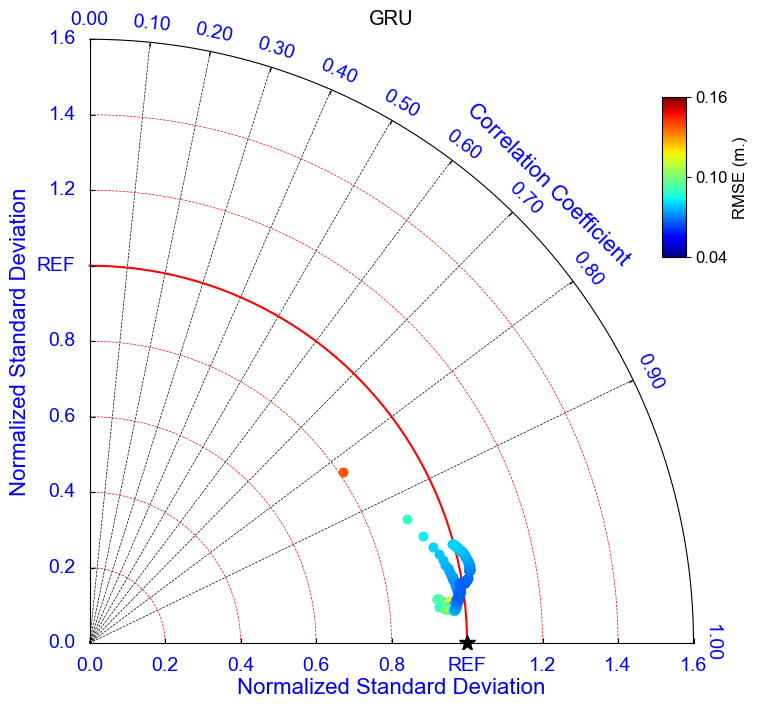

C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\1865569045.py:11: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  tr = PolarAxes.PolarTransform()
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\3301878244.py:61: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  plt.clabel(dia_LSTM.add_contours(colors='red'), inline=0, fontsize=0)
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\1865569045.py:91: MatplotlibDeprecationWarning: The get_cmap function was de

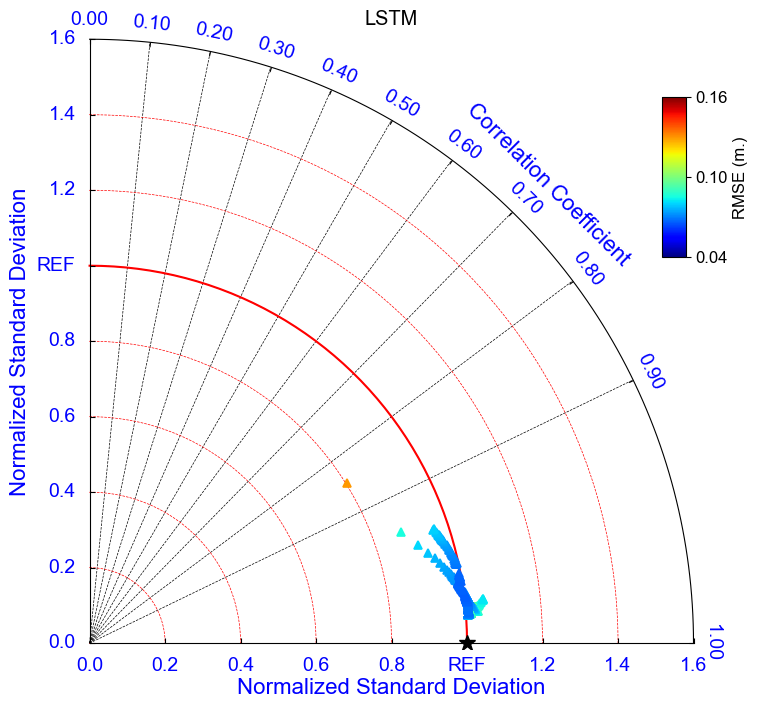

In [676]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.projections import PolarAxes
import mpl_toolkits.axisartist.grid_finder as gf
import mpl_toolkits.axisartist.floating_axes as fa
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Function to plot separate Taylor Diagrams for GRU and LSTM with RMSE color bar
def plot_taylor_diagram_separate(actual, predicted_GRU, predicted_LSTM):
    num_sections = actual.shape[1]

    std_actual = np.std(actual, axis=0)
    std_GRU = np.std(predicted_GRU, axis=0)
    std_LSTM = np.std(predicted_LSTM, axis=0)

    norm_std_GRU = std_GRU / std_actual
    norm_std_LSTM = std_LSTM / std_actual

    correlation_GRU = np.array([np.corrcoef(actual[:, i], predicted_GRU[:, i])[0, 1] for i in range(num_sections)])
    correlation_LSTM = np.array([np.corrcoef(actual[:, i], predicted_LSTM[:, i])[0, 1] for i in range(num_sections)])

    rmse_GRU = np.sqrt(np.mean((actual - predicted_GRU) ** 2, axis=0))
    rmse_LSTM = np.sqrt(np.mean((actual - predicted_LSTM) ** 2, axis=0))

    # Define colormap for RMSE
    cmap = cm.get_cmap('jet')
    vmin = min(rmse_GRU.min(), rmse_LSTM.min())
    vmax = max(rmse_GRU.max(), rmse_LSTM.max())
    vmid = (vmin + vmax) / 2
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

    # --- Plot for GRU ---
    fig_GRU = plt.figure(figsize=(8, 8))
    dia_GRU = TaylorDiagram(fig=fig_GRU, rect=111, label='HEC-RAS')

    plt.clabel(dia_GRU.add_contours(colors='red'), inline=0, fontsize=0)

    for i in range(num_sections):
        color = cmap(norm(rmse_GRU[i]))  # Map RMSE to color
        dia_GRU.add_sample(norm_std_GRU[i], correlation_GRU[i], rmse_GRU[i], marker='o', mew=1.2, color=color)

    plt.title("GRU")

    # Create a ScalarMappable for the colorbar
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])

    # Create a new axis for colorbar
    cax_GRU = fig_GRU.add_axes([0.85, 0.6, 0.03, 0.2])  # [left, bottom, width, height]
    cbar = fig_GRU.colorbar(sm, cax=cax_GRU, orientation='vertical', label='RMSE (m.)')
    cbar.set_ticks([vmin, vmid, vmax])
    cbar.set_ticklabels([f"{vmin:.2f}", f"{vmid:.2f}", f"{vmax:.2f}"])  # Format labels to 2 decimal places

    plt.show()

    # --- Plot for LSTM ---
    fig_LSTM = plt.figure(figsize=(8, 8))
    dia_LSTM = TaylorDiagram(fig=fig_LSTM, rect=111, label='HEC-RAS')

    plt.clabel(dia_LSTM.add_contours(colors='red'), inline=0, fontsize=0)

    for i in range(num_sections):
        color = cmap(norm(rmse_LSTM[i]))  # Map RMSE to color
        dia_LSTM.add_sample(norm_std_LSTM[i], correlation_LSTM[i], rmse_LSTM[i], marker='^', mew=1.2, color=color)

    plt.title("LSTM")

    # Create a ScalarMappable for the colorbar
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])

    # Create a new axis for colorbar
    cax_LSTM = fig_LSTM.add_axes([0.85, 0.6, 0.03, 0.2])  # [left, bottom, width, height]
    cbar = fig_LSTM.colorbar(sm, cax=cax_LSTM, orientation='vertical', label='RMSE (m.)')
    cbar.set_ticks([vmin, vmid, vmax])
    cbar.set_ticklabels([f"{vmin:.2f}", f"{vmid:.2f}", f"{vmax:.2f}"])  # Format labels to 2 decimal places

    plt.show()

# Call the function with actual and predicted data
plot_taylor_diagram_separate(all_actual, all_predict_GRU, all_predict_LSTM)


#### D8

In [677]:

filtered_df = df.loc[(df['River'] == 'D8') & (df['Reach'] == 'Reach 1')]

# Get start and end indices
start_index = filtered_df.index[0]
end_index = filtered_df.index[-2]

print("Start Index:", start_index)
print("End Index:", end_index)

geom_df = df[start_index:end_index]
geom_df['STA'] = geom_df['Len Left'].cumsum()
geom_df = geom_df.reset_index(drop=True)

# Save data
min_el_dict = dict()
max_el_dict = dict()

for col in geom_df.columns:
    min_el_dict[col] = geom_df[col].min()
    max_el_dict[col] = geom_df[col].max()

geom_df

Start Index: 346
End Index: 474


C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\316643836.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geom_df['STA'] = geom_df['Len Left'].cumsum()


,River,Reach,RS,Name,Description,Len Left,Len Channel,Len Right,Left Bank,Right Bank,...,Contr (USF),Expan (USF),HP Count,HP Start Elev,HP Vert Incr,HP LOB Slices,HP Chan Slices,HP ROB Slices,Default Centerline,STA
0,D8,Reach 1,12456,,,142.50,142.5,142.5,0.0,54.99752,...,0.0,0.0,200,-0.87,0.1,5,5,5,0,142.50
1,D8,Reach 1,12313,,,91.40,91.4,91.4,0.0,59.80252,...,0.0,0.0,200,-1.21,0.1,5,5,5,0,233.90
2,D8,Reach 1,12222,,,132.00,132.0,132.0,0.0,63.70337,...,0.0,0.0,200,-1.45,0.1,5,5,5,0,365.90
3,D8,Reach 1,12089.39,,,93.20,93.2,93.2,0.0,68.6,...,nan,nan,200,-1.76,0.1,5,5,5,0,459.10
4,D8,Reach 1,11996,,,96.20,96.2,96.2,0.0,68.0,...,nan,nan,200,-1.74,0.1,5,5,5,0,555.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,D8,Reach 1,504,,,82.30,82.3,82.3,4.3,65.6,...,nan,nan,200,-2.89,0.1,5,5,5,0,12034.40
124,D8,Reach 1,422,,,82.50,82.5,82.5,0.9,66.4,...,nan,nan,200,-2.91,0.1,5,5,5,0,12116.90
125,D8,Reach 1,339,,,83.90,83.9,83.9,1.3,57.8,...,nan,nan,200,-2.80,0.1,5,5,5,0,12200.80
126,D8,Reach 1,255,,,88.10,88.1,88.1,7.1,68.0,...,nan,nan,200,-2.75,0.1,5,5,5,0,12288.90


In [678]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from math import sqrt

# Determine number of timesteps and cross-sections per timestep
num_timesteps = len(results_df_GRU) // 715  # Assuming 715 rows per timestep

# Initialize empty lists to store data
all_actual = []
all_predict_GRU = []
all_predict_LSTM = []

# Loop through each timestep and collect data
for i in range(num_timesteps):
    subset_df_GRU = results_df_GRU[0 + 715 * i: 715 + 715 * i].reset_index(drop=True)
    all_actual.append(subset_df_GRU['y_actual'].values)
    all_predict_GRU.append(subset_df_GRU['y_predict'].values)

    subset_df_LSTM = results_df_LSTM[0 + 715 * i: 715 + 715 * i].reset_index(drop=True)
    all_predict_LSTM.append(subset_df_LSTM['y_predict'].values)

# Convert lists to arrays for easier calculation

all_actual = np.array(all_actual) # Shape: (num_timesteps, 715)
all_predict_GRU = np.array(all_predict_GRU)
all_predict_LSTM = np.array(all_predict_LSTM)

In [679]:
# Select the specified indices
selected_indices = np.concatenate([np.arange(start_index, end_index)])
sel_actual = all_actual[:, selected_indices]
sel_predict_GRU = all_predict_GRU[:, selected_indices]
sel_predict_LSTM = all_predict_LSTM[:, selected_indices]

In [680]:
import numpy as np

# Extract statistics across all timesteps for each cross-section
max_actual = all_actual[:, selected_indices].max(axis=0)
max_predict_GRU = all_predict_GRU[:, selected_indices].max(axis=0)
max_predict_LSTM = all_predict_LSTM[:, selected_indices].max(axis=0)

min_actual = all_actual[:, selected_indices].min(axis=0)
min_predict_GRU = all_predict_GRU[:, selected_indices].min(axis=0)
min_predict_LSTM = all_predict_LSTM[:, selected_indices].min(axis=0)

mean_actual = all_actual[:, selected_indices].mean(axis=0)
mean_predict_GRU = all_predict_GRU[:, selected_indices].mean(axis=0)
mean_predict_LSTM = all_predict_LSTM[:, selected_indices].mean(axis=0)

std_actual = all_actual[:, selected_indices].std(axis=0)
std_predict_GRU = all_predict_GRU[:, selected_indices].std(axis=0)
std_predict_LSTM = all_predict_LSTM[:, selected_indices].std(axis=0)

# Function to compute RMSE
def compute_rmse(actual, predicted):
    return np.sqrt(np.mean((actual - predicted) ** 2))

# Compute RMSE for each statistic
rmse_min_GRU = compute_rmse(min_actual, min_predict_GRU)
rmse_min_LSTM = compute_rmse(min_actual, min_predict_LSTM)

rmse_max_GRU = compute_rmse(max_actual, max_predict_GRU)
rmse_max_LSTM = compute_rmse(max_actual, max_predict_LSTM)

rmse_mean_GRU = compute_rmse(mean_actual, mean_predict_GRU)
rmse_mean_LSTM = compute_rmse(mean_actual, mean_predict_LSTM)

rmse_std_GRU = compute_rmse(std_actual, std_predict_GRU)
rmse_std_LSTM = compute_rmse(std_actual, std_predict_LSTM)

rmse_GRU = compute_rmse(all_actual[:, selected_indices], all_predict_GRU[:, selected_indices])
rmse_LSTM = compute_rmse(all_actual[:, selected_indices], all_predict_LSTM[:, selected_indices])

# Print RMSE values
print(f"RMSE for Max - GRU: {rmse_max_GRU:.4f}")
print(f"RMSE for Max - LSTM: {rmse_max_LSTM:.4f}")

print(f"RMSE for Min - GRU: {rmse_min_GRU:.4f}")
print(f"RMSE for Min - LSTM: {rmse_min_LSTM:.4f}")

print(f"RMSE for Mean - GRU: {rmse_mean_GRU:.4f}")
print(f"RMSE for Mean - LSTM: {rmse_mean_LSTM:.4f}")

print(f"RMSE for Std - GRU: {rmse_std_GRU:.4f}")
print(f"RMSE for Std - LSTM: {rmse_std_LSTM:.4f}")

print(f"RMSE for - GRU: {rmse_GRU:.4f}")
print(f"RMSE for - LSTM: {rmse_LSTM:.4f}")


RMSE for Max - GRU: 0.1156
RMSE for Max - LSTM: 0.2159
RMSE for Min - GRU: 0.0317
RMSE for Min - LSTM: 0.0274
RMSE for Mean - GRU: 0.0179
RMSE for Mean - LSTM: 0.0052
RMSE for Std - GRU: 0.0175
RMSE for Std - LSTM: 0.0118
RMSE for - GRU: 0.0674
RMSE for - LSTM: 0.0597


C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\3301878244.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('jet')
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\1865569045.py:11: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  tr = PolarAxes.PolarTransform()
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\3301878244.py:37: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this 

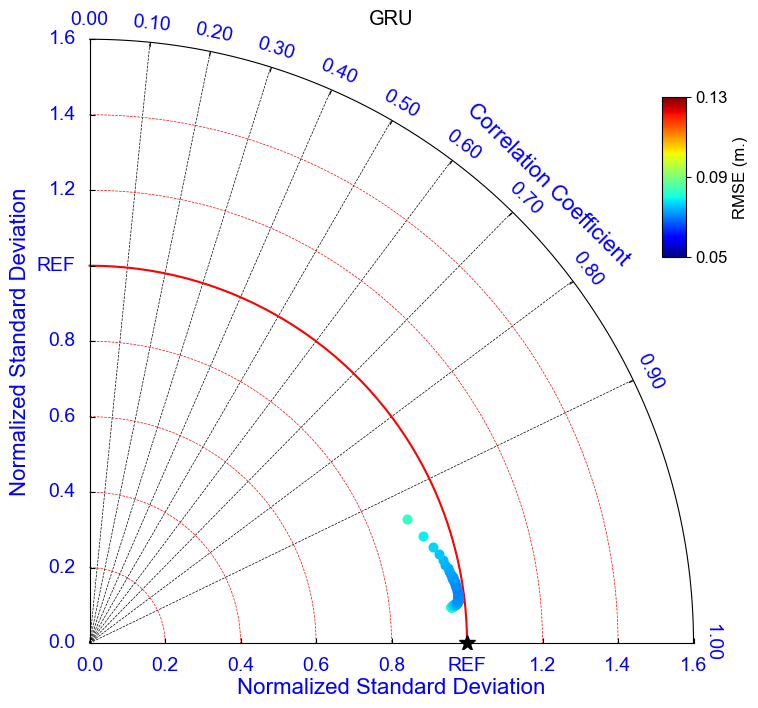

C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\1865569045.py:11: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  tr = PolarAxes.PolarTransform()
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\3301878244.py:61: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  plt.clabel(dia_LSTM.add_contours(colors='red'), inline=0, fontsize=0)
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\1865569045.py:91: MatplotlibDeprecationWarning: The get_cmap function was de

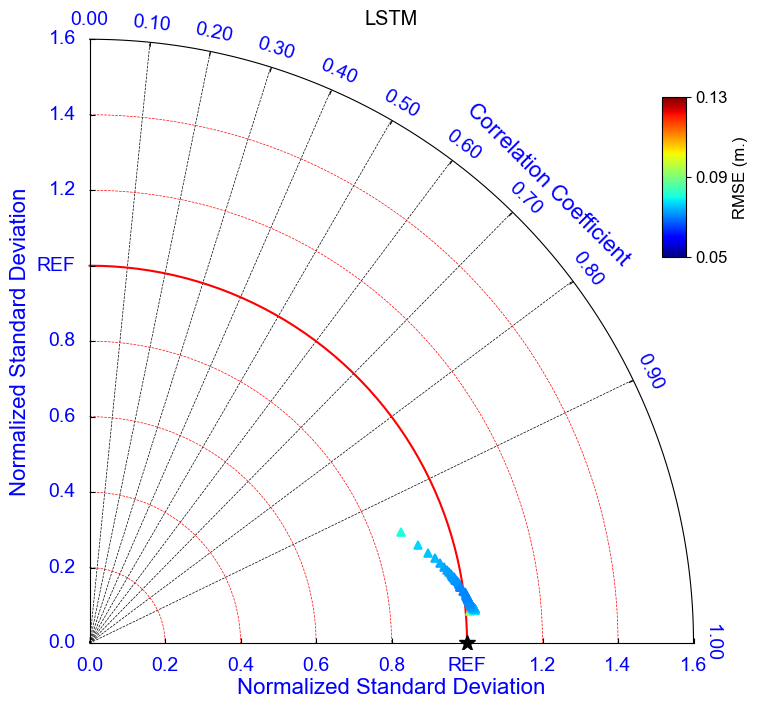

In [681]:
# Call the function with actual and predicted data
plot_taylor_diagram_separate(sel_actual, sel_predict_GRU, sel_predict_LSTM)

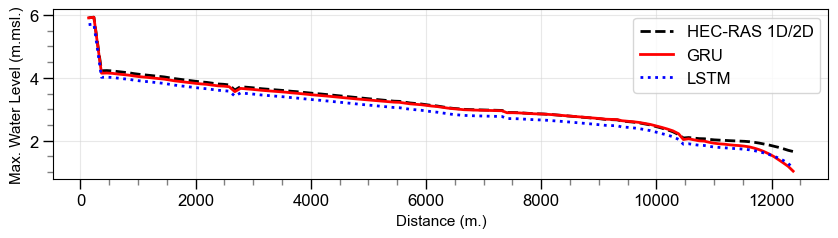

In [682]:
import numpy as np
import matplotlib.pyplot as plt

# Select the specified indices
selected_indices = np.concatenate([np.arange(start_index, end_index)])

# Extract the mean, max, min, and standard deviation values across all timesteps for each cross-section
max_actual = all_actual[:, selected_indices].max(axis=0)
max_predict_GRU = all_predict_GRU[:, selected_indices].max(axis=0)
max_predict_LSTM = all_predict_LSTM[:, selected_indices].max(axis=0)

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 2.2))

# Plot max values
plt.plot(distances, max_actual, label='HEC-RAS 1D/2D', linestyle='--', color='black',lw=2, alpha=1)
plt.plot(distances, max_predict_GRU, label='GRU', linestyle='-', color='red',lw=2, alpha=1)
plt.plot(distances, max_predict_LSTM, label='LSTM', linestyle=':', color='blue',lw=2, alpha=1)

plt.xlabel('Distance (m.)',fontsize=11)
plt.ylabel('Max. Water Level (m.msl.)',fontsize=11)
# plt.title('Observed vs Predicted Water Levels by Distance')

plt.grid(True, color='lightgray',alpha=0.5) 
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()

plt.show()

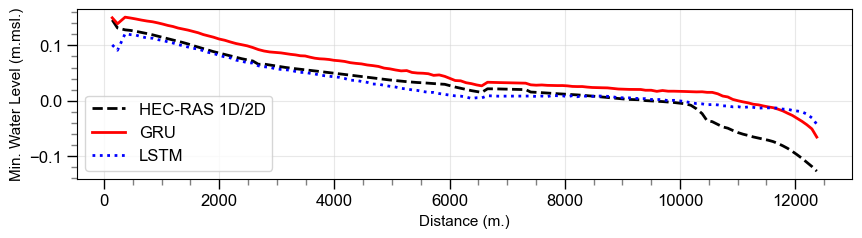

In [683]:
import numpy as np
import matplotlib.pyplot as plt

# Select the specified indices
selected_indices = np.concatenate([np.arange(start_index, end_index)])

# Extract the mean, max, min, and standard deviation values across all timesteps for each cross-section
min_actual = all_actual[:, selected_indices].min(axis=0)
min_predict_GRU = all_predict_GRU[:, selected_indices].min(axis=0)
min_predict_LSTM = all_predict_LSTM[:, selected_indices].min(axis=0)

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 2.2))

# Plot max values
plt.plot(distances, min_actual, label='HEC-RAS 1D/2D', linestyle='--', color='black',lw=2, alpha=1)
plt.plot(distances, min_predict_GRU, label='GRU', linestyle='-', color='red',lw=2, alpha=1)
plt.plot(distances, min_predict_LSTM, label='LSTM', linestyle=':', color='blue',lw=2, alpha=1)

plt.xlabel('Distance (m.)',fontsize=11)
plt.ylabel('Min. Water Level (m.msl.)',fontsize=11)
# plt.title('Observed vs Predicted Water Levels by Distance')

plt.grid(True, color='lightgray',alpha=0.5) 
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()

plt.show()

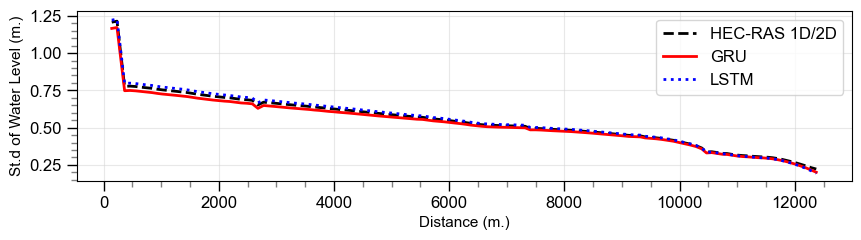

In [684]:
# Extract the standard deviation values across all timesteps for each cross-section
std_actual = all_actual[:, selected_indices].std(axis=0)
std_predict_GRU = all_predict_GRU[:, selected_indices].std(axis=0)
std_predict_LSTM = all_predict_LSTM[:, selected_indices].std(axis=0)

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 2.2))

# Plot standard deviation values
plt.plot(distances, std_actual, label='HEC-RAS 1D/2D', linestyle='--', color='black',lw=2, alpha=1)
plt.plot(distances, std_predict_GRU, label='GRU', linestyle='-', color='red',lw=2, alpha=1)
plt.plot(distances, std_predict_LSTM, label='LSTM', linestyle=':', color='blue',lw=2, alpha=1)

plt.xlabel('Distance (m.)',fontsize=11)
plt.ylabel('St.d of Water Level (m.)',fontsize=11)
# plt.title('Observed vs Predicted Water Levels by Distance')

# Add minor ticks
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()
plt.grid(True, color='lightgray', alpha=0.5)
plt.show()

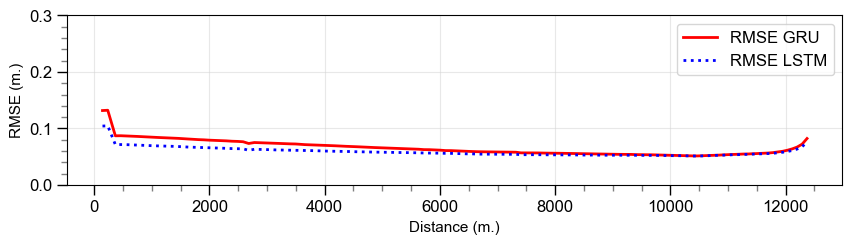

In [685]:
plt.rcParams['font.family'] = 'Arial'
# Select the specified indices

# Extract the actual and predicted values for the selected indices
actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 2.2))

# Plot RMSE values
plt.plot(distances, rmse_GRU, label='RMSE GRU', linestyle='-', color='red', lw=2, alpha=1)
plt.plot(distances, rmse_LSTM, label='RMSE LSTM', linestyle=':', color='blue', lw=2, alpha=1)

plt.xlabel('Distance (m.)',fontsize=11)
plt.ylabel('RMSE (m.)',fontsize=11)
# plt.title('RMSE of Predicted Water Levels by Distance')
plt.ylim(0, 0.3)
# Add minor ticks
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()
plt.grid(True, color='lightgray', alpha=0.5)
plt.show()

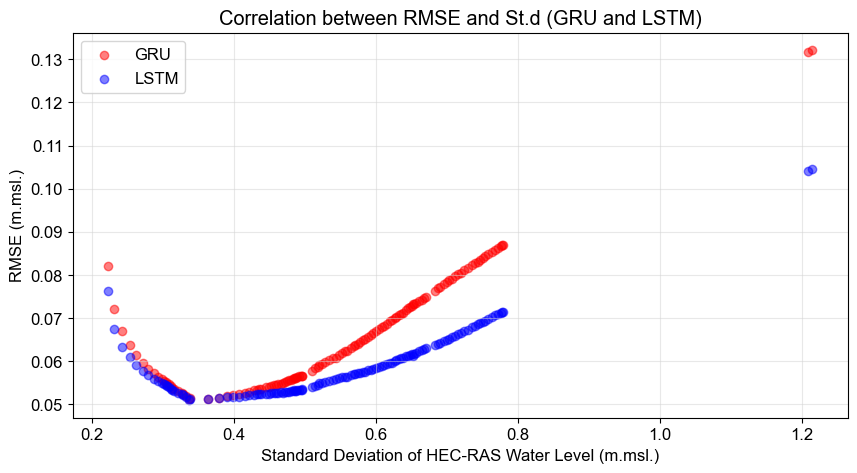

In [686]:
import numpy as np
import matplotlib.pyplot as plt

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'


# Extract the actual and predicted values for the selected indices
actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Calculate standard deviation for the actual values (HEC-RAS)
std_actual = actual_values.std(axis=0)

# Plot the correlation between RMSE and standard deviation of HEC-RAS
plt.figure(figsize=(10, 5))

# Scatter plot for GRU and LSTM in one graph
plt.scatter(std_actual, rmse_GRU, color='red', alpha=0.5, label='GRU')
plt.scatter(std_actual, rmse_LSTM, color='blue', alpha=0.5, label='LSTM')

plt.xlabel('Standard Deviation of HEC-RAS Water Level (m.msl.)')
plt.ylabel('RMSE (m.msl.)')
plt.title('Correlation between RMSE and St.d (GRU and LSTM)')
plt.grid(True, color='lightgray', alpha=0.5)
plt.legend()

plt.show()

####  Canal1 Reach2

In [687]:

filtered_df = df.loc[(df['River'] == 'canal1') & (df['Reach'] == 'Reach 2')]
# Get start and end indices
start_index = filtered_df.index[0]
end_index = filtered_df.index[-1]

print("Start Index:", start_index)
print("End Index:", end_index)

geom_df = df[start_index:end_index]
geom_df['STA'] = geom_df['Len Left'].cumsum()
geom_df = geom_df.reset_index(drop=True)

# Save data
min_el_dict = dict()
max_el_dict = dict()

for col in geom_df.columns:
    min_el_dict[col] = geom_df[col].min()
    max_el_dict[col] = geom_df[col].max()

geom_df


Start Index: 55
End Index: 134


C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_23868\679611143.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geom_df['STA'] = geom_df['Len Left'].cumsum()


,River,Reach,RS,Name,Description,Len Left,Len Channel,Len Right,Left Bank,Right Bank,...,Contr (USF),Expan (USF),HP Count,HP Start Elev,HP Vert Incr,HP LOB Slices,HP Chan Slices,HP ROB Slices,Default Centerline,STA
0,canal1,Reach 2,6500,,,81.00,81.0,81.0,3.72,45.0,...,nan,nan,200,-3.02,0.1,5,5,5,0,81.00
1,canal1,Reach 2,6433.75*,,,81.00,81.0,81.0,5.04,62.475,...,nan,nan,200,-3.24,0.1,5,5,5,0,162.00
2,canal1,Reach 2,6367.50*,,,81.00,81.0,81.0,6.36,79.95,...,nan,nan,200,-3.47,0.1,5,5,5,0,243.00
3,canal1,Reach 2,6301.25*,,,81.00,81.0,81.0,7.68,97.425,...,nan,nan,200,-3.69,0.1,5,5,5,0,324.00
4,canal1,Reach 2,6235,,,92.62,92.62,92.62,9.0,114.9,...,0.0,0.0,200,-3.92,0.1,5,5,5,0,416.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74,canal1,Reach 2,883.67*,,,93.39,93.393,93.393,1.067,12.32,...,nan,nan,200,3.92,0.1,5,5,5,0,6960.20
75,canal1,Reach 2,807.33*,,,93.39,93.394,93.394,0.533,8.653,...,nan,nan,200,4.43,0.1,5,5,5,0,7053.60
76,canal1,Reach 2,731,,,93.97,93.967,93.967,0.0,4.984841,...,0.0,0.0,200,4.94,0.1,5,5,5,0,7147.56
77,canal1,Reach 2,654.00*,,,93.97,93.967,93.967,2.291,41.623,...,nan,nan,200,1.99,0.1,5,5,5,0,7241.53


In [688]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from math import sqrt

# Determine number of timesteps and cross-sections per timestep
num_timesteps = len(results_df_GRU) // 715  # Assuming 715 rows per timestep

# Initialize empty lists to store data
all_actual = []
all_predict_GRU = []
all_predict_LSTM = []

# Loop through each timestep and collect data
for i in range(num_timesteps):
    subset_df_GRU = results_df_GRU[0 + 715 * i: 715 + 715 * i].reset_index(drop=True)
    all_actual.append(subset_df_GRU['y_actual'].values)
    all_predict_GRU.append(subset_df_GRU['y_predict'].values)

    subset_df_LSTM = results_df_LSTM[0 + 715 * i: 715 + 715 * i].reset_index(drop=True)
    all_predict_LSTM.append(subset_df_LSTM['y_predict'].values)

# Convert lists to arrays for easier calculation

all_actual = np.array(all_actual) # Shape: (num_timesteps, 715)
all_predict_GRU = np.array(all_predict_GRU)
all_predict_LSTM = np.array(all_predict_LSTM)


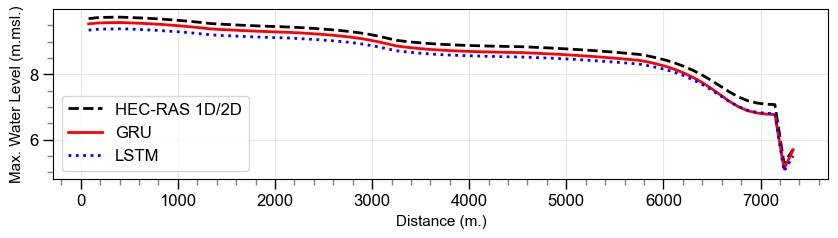

In [689]:
import numpy as np
import matplotlib.pyplot as plt

# Select the specified indices
selected_indices = np.concatenate([np.arange(start_index, end_index)])

# Extract the mean, max, min, and standard deviation values across all timesteps for each cross-section
max_actual = all_actual[:, selected_indices].max(axis=0)
max_predict_GRU = all_predict_GRU[:, selected_indices].max(axis=0)
max_predict_LSTM = all_predict_LSTM[:, selected_indices].max(axis=0)

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 2.2))

# Plot max values
plt.plot(distances, max_actual, label='HEC-RAS 1D/2D', linestyle='--', color='black',lw=2, alpha=1)
plt.plot(distances, max_predict_GRU, label='GRU', linestyle='-', color='red',lw=2, alpha=1)
plt.plot(distances, max_predict_LSTM, label='LSTM', linestyle=':', color='blue',lw=2, alpha=1)

plt.xlabel('Distance (m.)',fontsize=11)
plt.ylabel('Max. Water Level (m.msl.)',fontsize=11)
# plt.title('Observed vs Predicted Water Levels by Distance')

plt.grid(True, color='lightgray',alpha=0.5) 
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()

plt.show()

In [690]:
import numpy as np

# Extract statistics across all timesteps for each cross-section
max_actual = all_actual[:, selected_indices].max(axis=0)
max_predict_GRU = all_predict_GRU[:, selected_indices].max(axis=0)
max_predict_LSTM = all_predict_LSTM[:, selected_indices].max(axis=0)

min_actual = all_actual[:, selected_indices].min(axis=0)
min_predict_GRU = all_predict_GRU[:, selected_indices].min(axis=0)
min_predict_LSTM = all_predict_LSTM[:, selected_indices].min(axis=0)

mean_actual = all_actual[:, selected_indices].mean(axis=0)
mean_predict_GRU = all_predict_GRU[:, selected_indices].mean(axis=0)
mean_predict_LSTM = all_predict_LSTM[:, selected_indices].mean(axis=0)

std_actual = all_actual[:, selected_indices].std(axis=0)
std_predict_GRU = all_predict_GRU[:, selected_indices].std(axis=0)
std_predict_LSTM = all_predict_LSTM[:, selected_indices].std(axis=0)

# Function to compute RMSE
def compute_rmse(actual, predicted):
    return np.sqrt(np.mean((actual - predicted) ** 2))

# Compute RMSE for each statistic
rmse_min_GRU = compute_rmse(min_actual, min_predict_GRU)
rmse_min_LSTM = compute_rmse(min_actual, min_predict_LSTM)

rmse_max_GRU = compute_rmse(max_actual, max_predict_GRU)
rmse_max_LSTM = compute_rmse(max_actual, max_predict_LSTM)

rmse_mean_GRU = compute_rmse(mean_actual, mean_predict_GRU)
rmse_mean_LSTM = compute_rmse(mean_actual, mean_predict_LSTM)

rmse_std_GRU = compute_rmse(std_actual, std_predict_GRU)
rmse_std_LSTM = compute_rmse(std_actual, std_predict_LSTM)

rmse_GRU = compute_rmse(all_actual[:, selected_indices], all_predict_GRU[:, selected_indices])
rmse_LSTM = compute_rmse(all_actual[:, selected_indices], all_predict_LSTM[:, selected_indices])

# Print RMSE values
print(f"RMSE for Max - GRU: {rmse_max_GRU:.4f}")
print(f"RMSE for Max - LSTM: {rmse_max_LSTM:.4f}")

print(f"RMSE for Min - GRU: {rmse_min_GRU:.4f}")
print(f"RMSE for Min - LSTM: {rmse_min_LSTM:.4f}")

print(f"RMSE for Mean - GRU: {rmse_mean_GRU:.4f}")
print(f"RMSE for Mean - LSTM: {rmse_mean_LSTM:.4f}")

print(f"RMSE for Std - GRU: {rmse_std_GRU:.4f}")
print(f"RMSE for Std - LSTM: {rmse_std_LSTM:.4f}")

print(f"RMSE for - GRU: {rmse_GRU:.4f}")
print(f"RMSE for - LSTM: {rmse_LSTM:.4f}")


RMSE for Max - GRU: 0.1888
RMSE for Max - LSTM: 0.3203
RMSE for Min - GRU: 0.0072
RMSE for Min - LSTM: 0.0223
RMSE for Mean - GRU: 0.0429
RMSE for Mean - LSTM: 0.0038
RMSE for Std - GRU: 0.0433
RMSE for Std - LSTM: 0.0256
RMSE for - GRU: 0.1191
RMSE for - LSTM: 0.0925


In [691]:
import numpy as np

# Extract statistics across all timesteps for each cross-section
max_actual = all_actual[:, selected_indices].max(axis=0)
max_predict_GRU = all_predict_GRU[:, selected_indices].max(axis=0)
max_predict_LSTM = all_predict_LSTM[:, selected_indices].max(axis=0)

min_actual = all_actual[:, selected_indices].min(axis=0)
min_predict_GRU = all_predict_GRU[:, selected_indices].min(axis=0)
min_predict_LSTM = all_predict_LSTM[:, selected_indices].min(axis=0)

mean_actual = all_actual[:, selected_indices].mean(axis=0)
mean_predict_GRU = all_predict_GRU[:, selected_indices].mean(axis=0)
mean_predict_LSTM = all_predict_LSTM[:, selected_indices].mean(axis=0)

std_actual = all_actual[:, selected_indices].std(axis=0)
std_predict_GRU = all_predict_GRU[:, selected_indices].std(axis=0)
std_predict_LSTM = all_predict_LSTM[:, selected_indices].std(axis=0)

# Function to compute RMSE
def compute_rmse(actual, predicted):
    return np.sqrt(np.mean((actual - predicted) ** 2))

# Compute RMSE for each statistic
rmse_min_GRU = compute_rmse(min_actual, min_predict_GRU)
rmse_min_LSTM = compute_rmse(min_actual, min_predict_LSTM)

rmse_max_GRU = compute_rmse(max_actual, max_predict_GRU)
rmse_max_LSTM = compute_rmse(max_actual, max_predict_LSTM)

rmse_mean_GRU = compute_rmse(mean_actual, mean_predict_GRU)
rmse_mean_LSTM = compute_rmse(mean_actual, mean_predict_LSTM)

rmse_std_GRU = compute_rmse(std_actual, std_predict_GRU)
rmse_std_LSTM = compute_rmse(std_actual, std_predict_LSTM)

rmse_GRU = compute_rmse(all_actual, all_predict_GRU)
rmse_LSTM = compute_rmse(all_actual, all_predict_LSTM)

# Print RMSE values
print(f"RMSE for Max - GRU: {rmse_max_GRU:.4f}")
print(f"RMSE for Max - LSTM: {rmse_max_LSTM:.4f}")

print(f"RMSE for Min - GRU: {rmse_min_GRU:.4f}")
print(f"RMSE for Min - LSTM: {rmse_min_LSTM:.4f}")

print(f"RMSE for Mean - GRU: {rmse_mean_GRU:.4f}")
print(f"RMSE for Mean - LSTM: {rmse_mean_LSTM:.4f}")

print(f"RMSE for Std - GRU: {rmse_std_GRU:.4f}")
print(f"RMSE for Std - LSTM: {rmse_std_LSTM:.4f}")

print(f"RMSE for - GRU: {rmse_GRU:.4f}")
print(f"RMSE for - LSTM: {rmse_LSTM:.4f}")


RMSE for Max - GRU: 0.1888
RMSE for Max - LSTM: 0.3203
RMSE for Min - GRU: 0.0072
RMSE for Min - LSTM: 0.0223
RMSE for Mean - GRU: 0.0429
RMSE for Mean - LSTM: 0.0038
RMSE for Std - GRU: 0.0433
RMSE for Std - LSTM: 0.0256
RMSE for - GRU: 0.0983
RMSE for - LSTM: 0.0779


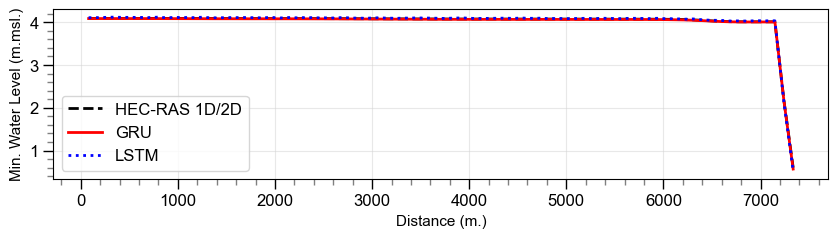

In [692]:
import numpy as np
import matplotlib.pyplot as plt

# Select the specified indices
selected_indices = np.concatenate([np.arange(start_index, end_index)])

# Extract the mean, max, min, and standard deviation values across all timesteps for each cross-section
min_actual = all_actual[:, selected_indices].min(axis=0)
min_predict_GRU = all_predict_GRU[:, selected_indices].min(axis=0)
min_predict_LSTM = all_predict_LSTM[:, selected_indices].min(axis=0)

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 2.2))

# Plot max values
plt.plot(distances, min_actual, label='HEC-RAS 1D/2D', linestyle='--', color='black',lw=2, alpha=1)
plt.plot(distances, min_predict_GRU, label='GRU', linestyle='-', color='red',lw=2, alpha=1)
plt.plot(distances, min_predict_LSTM, label='LSTM', linestyle=':', color='blue',lw=2, alpha=1)

plt.xlabel('Distance (m.)',fontsize=11)
plt.ylabel('Min. Water Level (m.msl.)',fontsize=11)
# plt.title('Observed vs Predicted Water Levels by Distance')

plt.grid(True, color='lightgray',alpha=0.5) 
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()

plt.show()

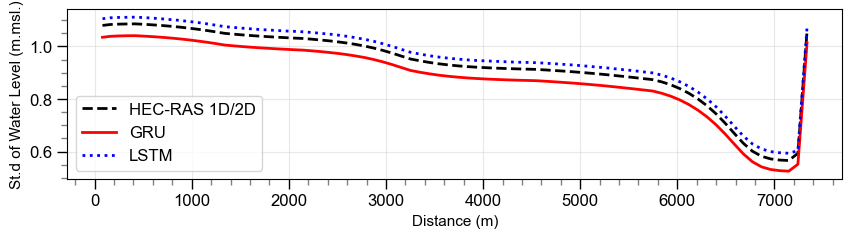

In [693]:
# Extract the standard deviation values across all timesteps for each cross-section
std_actual = all_actual[:, selected_indices].std(axis=0)
std_predict_GRU = all_predict_GRU[:, selected_indices].std(axis=0)
std_predict_LSTM = all_predict_LSTM[:, selected_indices].std(axis=0)

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 2.2))

# Plot standard deviation values
plt.plot(distances, std_actual, label='HEC-RAS 1D/2D', linestyle='--', color='black',lw=2, alpha=1)
plt.plot(distances, std_predict_GRU, label='GRU', linestyle='-', color='red',lw=2, alpha=1)
plt.plot(distances, std_predict_LSTM, label='LSTM', linestyle=':', color='blue',lw=2, alpha=1)

plt.xlabel('Distance (m)',fontsize=11)
plt.ylabel('St.d of Water Level (m.msl.)',fontsize=11)
# plt.title('Observed vs Predicted Water Levels by Distance')

# Add minor ticks
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()
plt.grid(True, color='lightgray', alpha=0.5)
plt.show()

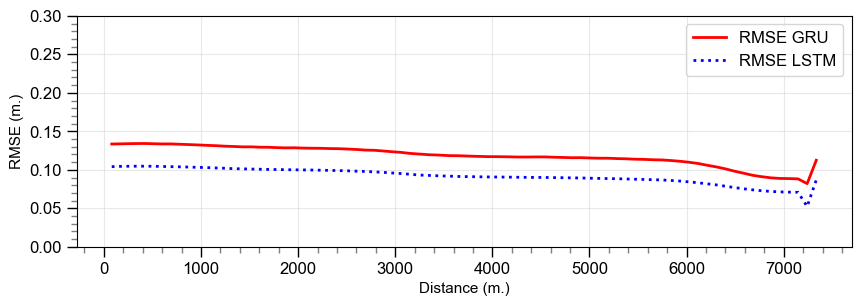

In [694]:
plt.rcParams['font.family'] = 'Arial'
# Select the specified indices

# Extract the actual and predicted values for the selected indices
actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 3))

# Plot RMSE values
plt.plot(distances, rmse_GRU, label='RMSE GRU', linestyle='-', color='red', lw=2, alpha=1)
plt.plot(distances, rmse_LSTM, label='RMSE LSTM', linestyle=':', color='blue', lw=2, alpha=1)

plt.xlabel('Distance (m.)',fontsize=11)
plt.ylabel('RMSE (m.)',fontsize=11)
# plt.title('RMSE of Predicted Water Levels by Distance')
plt.ylim(0, 0.3)
# Add minor ticks
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()
plt.grid(True, color='lightgray', alpha=0.5)
plt.show()

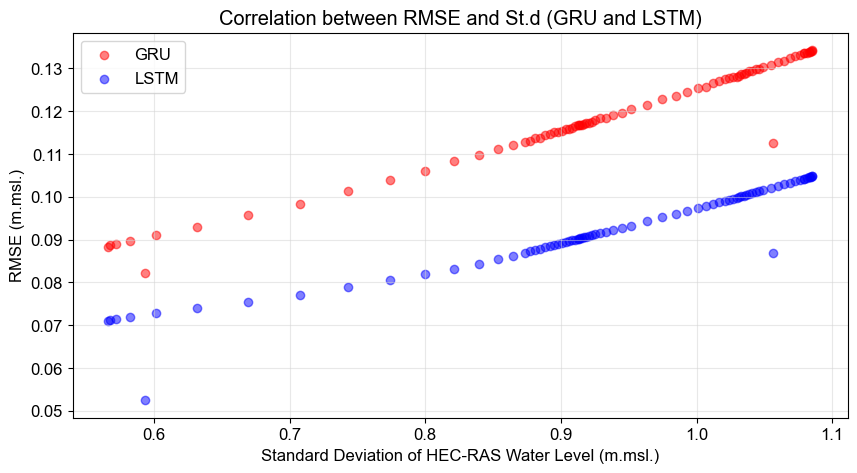

In [695]:
import numpy as np
import matplotlib.pyplot as plt

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'


# Extract the actual and predicted values for the selected indices
actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Calculate standard deviation for the actual values (HEC-RAS)
std_actual = actual_values.std(axis=0)

# Plot the correlation between RMSE and standard deviation of HEC-RAS
plt.figure(figsize=(10, 5))

# Scatter plot for GRU and LSTM in one graph
plt.scatter(std_actual, rmse_GRU, color='red', alpha=0.5, label='GRU')
plt.scatter(std_actual, rmse_LSTM, color='blue', alpha=0.5, label='LSTM')

plt.xlabel('Standard Deviation of HEC-RAS Water Level (m.msl.)')
plt.ylabel('RMSE (m.msl.)')
plt.title('Correlation between RMSE and St.d (GRU and LSTM)')
plt.grid(True, color='lightgray', alpha=0.5)
plt.legend()

plt.show()

## Plot all

In [307]:
geom_df = df[:]
geom_df['STA'] = geom_df['Len Left'].cumsum()
geom_df = geom_df.reset_index(drop=True)

# Save data
min_el_dict = dict()
max_el_dict = dict()

for col in geom_df.columns:
    min_el_dict[col] = geom_df[col].min()
    max_el_dict[col] = geom_df[col].max()

geom_df

C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_27240\2323007256.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geom_df['STA'] = geom_df['Len Left'].cumsum()


,River,Reach,RS,Name,Description,Len Left,Len Channel,Len Right,Left Bank,Right Bank,...,Contr (USF),Expan (USF),HP Count,HP Start Elev,HP Vert Incr,HP LOB Slices,HP Chan Slices,HP ROB Slices,Default Centerline,STA
0,PATTANI_RIVER,Reach 5,49645.77,,TOPO2022 49476.000,83.60,83.6,83.6,0.0,84.8,...,nan,nan,200,-1.87,0.1,5,5,5,0,83.60
1,PATTANI_RIVER,Reach 5,49562,,,83.90,83.9,83.9,0.471,83.932,...,nan,nan,200,-1.84,0.1,5,5,5,0,167.50
2,PATTANI_RIVER,Reach 5,49478,,,83.80,83.8,83.8,0.9420002,83.063,...,nan,nan,200,-1.87,0.1,5,5,5,0,251.30
3,PATTANI_RIVER,Reach 5,49394,,,83.80,83.8,83.8,1.413,82.195,...,nan,nan,200,-2.01,0.1,5,5,5,0,335.10
4,PATTANI_RIVER,Reach 5,49311,,,83.70,83.7,83.7,1.884,81.326,...,nan,nan,200,-2.18,0.1,5,5,5,0,418.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
710,PATTANI_RIVER,Reach 3,397,,TOPO2022 365.000,91.20,91.2,91.2,19.2,518.0,...,nan,nan,200,-3.15,0.1,5,5,5,0,69872.80
711,PATTANI_RIVER,Reach 3,306,,,91.20,91.2,91.2,18.7,343.1,...,nan,nan,200,-2.56,0.1,5,5,5,0,69964.00
712,PATTANI_RIVER,Reach 3,215,,,91.20,91.2,91.2,19.5,394.5,...,nan,nan,200,-2.02,0.1,5,5,5,0,70055.20
713,PATTANI_RIVER,Reach 3,124,,,91.20,91.2,91.2,18.5,345.7,...,nan,nan,200,-2.43,0.1,5,5,5,0,70146.40


In [308]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from math import sqrt

# Determine number of timesteps and cross-sections per timestep
num_timesteps = len(results_df_GRU) // 715  # Assuming 715 rows per timestep

# Initialize empty lists to store data
all_actual = []
all_predict_GRU = []
all_predict_LSTM = []

# Loop through each timestep and collect data
for i in range(num_timesteps):
    subset_df_GRU = results_df_GRU[0 + 715 * i: 715 + 715 * i].reset_index(drop=True)
    all_actual.append(subset_df_GRU['y_actual'].values)
    all_predict_GRU.append(subset_df_GRU['y_predict'].values)

    subset_df_LSTM = results_df_LSTM[0 + 715 * i: 715 + 715 * i].reset_index(drop=True)
    all_predict_LSTM.append(subset_df_LSTM['y_predict'].values)

# Convert lists to arrays for easier calculation

all_actual = np.array(all_actual) # Shape: (num_timesteps, 715)
all_predict_GRU = np.array(all_predict_GRU)
all_predict_LSTM = np.array(all_predict_LSTM)

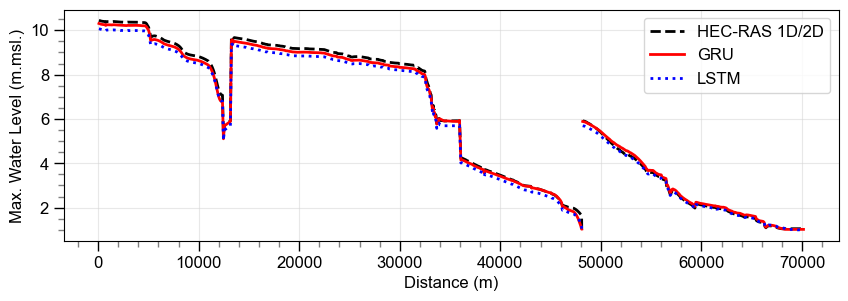

In [309]:
import numpy as np
import matplotlib.pyplot as plt

# Select the specified indices
selected_indices = np.concatenate([np.arange(0, 715)])

# Extract the mean, max, min, and standard deviation values across all timesteps for each cross-section
max_actual = all_actual[:, selected_indices].max(axis=0)
max_predict_GRU = all_predict_GRU[:, selected_indices].max(axis=0)
max_predict_LSTM = all_predict_LSTM[:, selected_indices].max(axis=0)

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 3))

# Plot max values
plt.plot(distances, max_actual, label='HEC-RAS 1D/2D', linestyle='--', color='black',lw=2, alpha=1)
plt.plot(distances, max_predict_GRU, label='GRU', linestyle='-', color='red',lw=2, alpha=1)
plt.plot(distances, max_predict_LSTM, label='LSTM', linestyle=':', color='blue',lw=2, alpha=1)

plt.xlabel('Distance (m)')
plt.ylabel('Max. Water Level (m.msl.)')
# plt.title('Observed vs Predicted Water Levels by Distance')

plt.grid(True, color='lightgray',alpha=0.5) 
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()

plt.show()

In [310]:
geom_df['STA'].values

array([   83.6  ,   167.5  ,   251.3  ,   335.1  ,   418.8  ,   504.1  ,
         589.4  ,   674.8  ,   760.3  ,   845.7  ,   927.6  ,  1016.6  ,
        1105.9  ,  1192.3  ,  1272.7  ,  1351.8  ,  1457.7  ,  1559.4  ,
        1653.8  ,  1745.6  ,  1837.1  ,  1932.4  ,  2029.6  ,  2125.6  ,
        2218.5  ,  2295.6  ,  2436.8  ,  2568.9  ,  2672.7  ,  2801.6  ,
        2945.7  ,  3017.   ,  3066.6  ,  3163.7  ,  3262.9  ,  3362.   ,
        3460.8  ,  3559.1  ,  3657.5  ,  3757.   ,  3856.1  ,  3954.2  ,
        4051.7  ,  4149.2  ,  4246.7  ,  4344.2  ,  4441.7  ,  4539.2  ,
        4636.7  ,  4734.2  ,  4831.7  ,  4929.2  ,  5026.7  ,  5124.2  ,
        5221.7  ,  5302.7  ,  5383.7  ,  5464.7  ,  5545.7  ,  5638.32 ,
        5730.94 ,  5823.56 ,  5916.18 ,  6008.8  ,  6101.42 ,  6194.04 ,
        6286.66 ,  6379.28 ,  6471.9  ,  6560.856,  6649.812,  6738.768,
        6827.724,  6916.68 ,  7005.636,  7094.592,  7183.548,  7272.504,
        7364.221,  7455.938,  7547.655,  7639.372, 

In [311]:
# Filter the DataFrame to only contain rows for 'PATTANI_RIVER'
pattani_df = geom_df.loc[geom_df['River'] == 'PATTANI_RIVER']
pattani_df.reset_index(drop=True, inplace=True)
# Find the index where RS = 4623 in the filtered DataFrame
rs_4623_index = pattani_df.loc[pattani_df['RS'] == 23552].index

# Display the index of RS = 4623 within the filtered DataFrame
rs_4623_index


Int64Index([], dtype='int64')

In [312]:
rs_values

array([12456.  , 12313.  , 12222.  , 12089.39, 11996.  , 11900.  ,
       11805.  , 11707.  , 11612.  , 11524.  , 11436.  , 11348.  ,
       11260.  , 11172.  , 11084.  , 10996.  , 10908.  , 10820.  ,
       10732.  , 10644.  , 10556.  , 10458.  , 10361.  , 10263.  ,
       10165.  , 10068.  ,  9970.  ,  9872.  ,  9774.  ,  9677.  ,
        9579.  ,  9481.  ,  9384.  ,  9300.  ,  9216.  ,  9132.  ,
        9049.  ,  8965.  ,  8881.  ,  8797.  ,  8713.  ,  8630.  ,
        8546.  ,  8462.  ,  8378.  ,  8280.  ,  8182.  ,  8084.  ,
        7986.  ,  7887.  ,  7789.  ,  7691.  ,  7593.  ,  7495.  ,
        7397.  ,  7299.  ,  7200.  ,  7109.  ,  7013.  ,  6918.  ,
        6826.  ,  6734.  ,  6637.  ,  6540.  ,  6452.  ,  6360.  ,
        6265.  ,  6171.  ,  6078.  ,  5988.  ,  5899.  ,  5798.  ,
        5608.  ,  5137.  ,  5048.  ,  4953.  ,  4856.  ,  4760.  ,
        4667.  ,  4581.  ,  4496.  ,  4410.  ,  4325.  ,  4239.  ,
        4154.  ,  4068.  ,  3982.  ,  3897.  ,  3811.  ,  3717

505
80
130


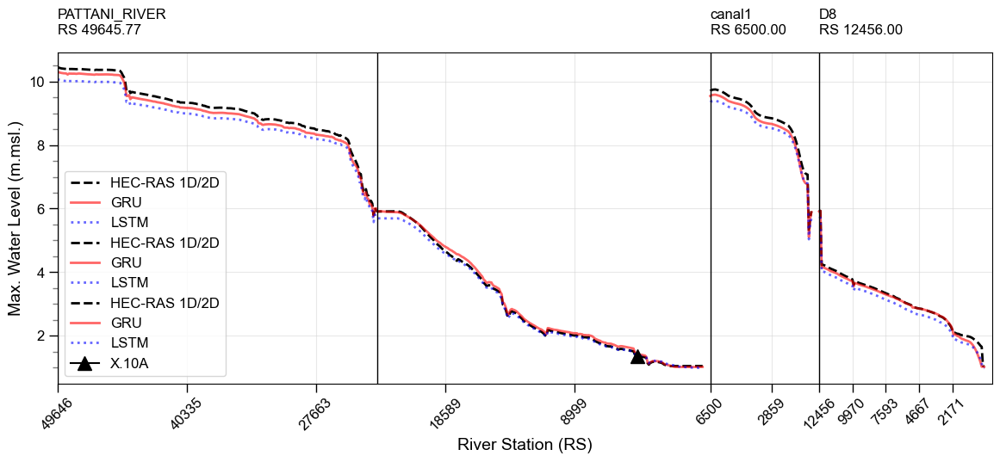

In [313]:
import numpy as np
import matplotlib.pyplot as plt

# Define custom font sizes
font_size_axis_labels = 14
font_size_ticks = 12
font_size_legend = 12
font_size_annotations = 12
geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce') 
# Get unique river names to categorize the data
rivers = geom_df['River'].unique()

# Initialize lists to store categorized data
index_mapping = []  # Store the mapping of RS values to new indices
xtick_labels = []  # Store labels for x-axis
xtick_positions = []  # Store positions of x-ticks
river_labels = []  # Store river names for annotations

# Generate a continuous temporary index for plotting
temp_index = 0

# Store separate segments to avoid linking between rivers
segments = []

for river in rivers:
    mask = geom_df['River'] == river
    rs_values = geom_df.loc[mask, 'RS'].values  # Use RS as X-axis
    indices = np.where(mask)[0]  # Get corresponding indices

    if len(indices) == 0:
        continue  # Skip empty rivers

    # Extract max values
    max_actual = all_actual[:, indices].max(axis=0)
    max_predict_GRU = all_predict_GRU[:, indices].max(axis=0)
    max_predict_LSTM = all_predict_LSTM[:, indices].max(axis=0)

    # Store index mapping for this river
    index_range = range(temp_index, temp_index + len(rs_values))
    segments.append((index_range, max_actual, max_predict_GRU, max_predict_LSTM))
    print(len(index_range))
    # Store x-ticks (choosing every Nth RS for readability)
    step = max(1, len(rs_values) // 5)  # Adjust step size for better visibility
    xtick_labels.extend([f"{rs:.0f}" for rs in rs_values[::step]])
    xtick_positions.extend(list(index_range)[::step])

    # Store river name and RS for annotation
    river_labels.append((temp_index, rs_values[0], river))
    
    # **Insert a larger gap if the river is "canal_1"**
    if river.lower() == "canal_1":
        temp_index += len(rs_values) + 0  # Extend gap
    else:
        temp_index += len(rs_values) + 5  # Normal gap

# Plot the data using the temporary index
plt.figure(figsize=(14, 5))

# Plot each segment separately to avoid linking between different rivers
for index_range, max_actual, max_predict_GRU, max_predict_LSTM in segments:
    plt.plot(index_range, max_actual, linestyle='--', color='black', lw=2, alpha=1, label='HEC-RAS 1D/2D')
    plt.plot(index_range, max_predict_GRU, linestyle='-', color='red', lw=2, alpha=0.6, label='GRU')
    plt.plot(index_range, max_predict_LSTM, linestyle=':', color='blue', lw=2, alpha=0.6, label='LSTM')

# Add vertical lines and annotations for each river section
for idx, rs_start, river in river_labels:
    plt.axvline(x=idx, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
    plt.text(idx, np.max(all_max_actual) * 1.1, f"{river}\nRS {rs_start:.2f}",
             ha='left', fontsize=font_size_annotations, rotation=360)

plt.axvline(x=250, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
# Formatting with custom font sizes
plt.xlabel('River Station (RS)', fontsize=font_size_axis_labels)
plt.ylabel('Max. Water Level (m.msl.)', fontsize=font_size_axis_labels)
plt.grid(True, color='lightgray', alpha=0.5)
plt.minorticks_on()
plt.tick_params(which='both', width=1, labelsize=font_size_ticks)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')


plt.plot(453, all_max_actual[453], marker='^', markersize=12,
         color='black', markeredgecolor='black', label="X.10A")

# Customize legend font size
plt.legend(loc='lower left', fontsize=font_size_legend)

# Remove NaN labels from x-ticks
filtered_xticks = [(pos, label) for pos, label in zip(xtick_positions, xtick_labels) if label.lower() != 'nan']
xtick_positions, xtick_labels = zip(*filtered_xticks) if filtered_xticks else ([], [])

# Adjust x-axis labels to show RS values with custom font size
plt.xlim(0, temp_index)
plt.xticks(xtick_positions, xtick_labels, rotation=45, fontsize=font_size_ticks)
plt.tick_params(axis='x', which='minor', bottom=False, top=False)

# Show plot
plt.show()


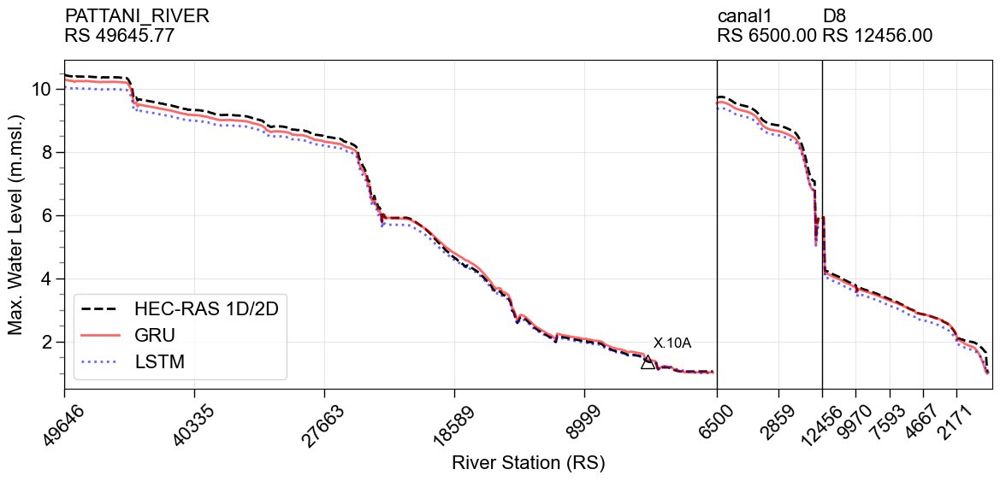

In [314]:
import numpy as np
import matplotlib.pyplot as plt

# Define custom font sizes
font_size_axis_labels = 16
font_size_ticks = 16
font_size_legend = 16
font_size_annotations = 16

# Get unique river names to categorize the data
rivers = geom_df['River'].unique()

# Initialize lists to store categorized data
all_max_actual = []  # Store max actual water level values
index_mapping = []  # Store the mapping of RS values to new indices
xtick_labels = []  # Store labels for x-axis
xtick_positions = []  # Store positions of x-ticks
river_labels = []  # Store river names for annotations

# Generate a continuous temporary index for plotting
temp_index = 0

# Store separate segments to avoid linking between rivers
segments = []

for river in rivers:
    mask = geom_df['River'] == river
    rs_values = geom_df.loc[mask, 'RS'].values  # Use RS as X-axis
    indices = np.where(mask)[0]  # Get corresponding indices

    if len(indices) == 0:
        continue  # Skip empty rivers

    # Extract max values
    max_actual = all_actual[:, indices].max(axis=0)
    max_predict_GRU = all_predict_GRU[:, indices].max(axis=0)
    max_predict_LSTM = all_predict_LSTM[:, indices].max(axis=0)

    # Store max actual values in the list
    all_max_actual.extend(max_actual)

    # Store index mapping for this river
    index_range = range(temp_index, temp_index + len(rs_values))
    segments.append((index_range, max_actual, max_predict_GRU, max_predict_LSTM))

    # Store x-ticks (choosing every Nth RS for readability)
    step = max(1, len(rs_values) // 5)  # Adjust step size for better visibility
    xtick_labels.extend([f"{rs:.0f}" for rs in rs_values[::step]])
    xtick_positions.extend(list(index_range)[::step])

    # Store river name and RS for annotation
    river_labels.append((temp_index, rs_values[0], river))
    
    # **Insert a larger gap if the river is "canal_1"**
    if river.lower() == "canal_1":
        temp_index += len(rs_values) + 2  # Extend gap
    else:
        temp_index += len(rs_values) + 2  # Normal gap

# Convert all_max_actual to numpy array
all_max_actual = np.array(all_max_actual)

# Plot the data using the temporary index
plt.figure(figsize=(14, 5))

# Plot each segment separately to avoid linking between different rivers
for index_range, max_actual, max_predict_GRU, max_predict_LSTM in segments:
    plt.plot(index_range, max_actual, linestyle='--', color='black', lw=2, alpha=1, label='HEC-RAS 1D/2D')
    plt.plot(index_range, max_predict_GRU, linestyle='-', color='red', lw=2, alpha=0.6, label='GRU')
    plt.plot(index_range, max_predict_LSTM, linestyle=':', color='blue', lw=2, alpha=0.6, label='LSTM')

# Add vertical lines and annotations for each river section
for idx, rs_start, river in river_labels:
    plt.axvline(x=idx, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
    plt.text(idx, np.max(all_max_actual) * 1.1, f"{river}\nRS {rs_start:.2f}",
             ha='left', fontsize=font_size_annotations, rotation=360)

# Ensure index 453 exists before plotting marker
if 453 < len(all_max_actual):
    plt.plot(453, all_max_actual[453], marker='^', markersize=12,
             color='black', markeredgecolor='black', fillstyle='none')
    plt.annotate("X.10A", (453, all_max_actual[453]),
                 xytext=(5,10), textcoords="offset points",  # Offset position for better readability
                 fontsize=12, color='black', ha='left', va='bottom')

# Formatting with custom font sizes
plt.xlabel('River Station (RS)', fontsize=font_size_axis_labels)
plt.ylabel('Max. Water Level (m.msl.)', fontsize=font_size_axis_labels)
plt.grid(True, color='lightgray', alpha=0.5)
plt.minorticks_on()
plt.tick_params(which='both', width=1, labelsize=font_size_ticks)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')


handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))

# Customize legend font size
plt.legend(by_label.values(), by_label.keys(),
           loc='lower left', fontsize=font_size_legend)

# Remove NaN labels from x-ticks
filtered_xticks = [(pos, label) for pos, label in zip(xtick_positions, xtick_labels) if label.lower() != 'nan']
xtick_positions, xtick_labels = zip(*filtered_xticks) if filtered_xticks else ([], [])

# Adjust x-axis labels to show RS values with custom font size
plt.xlim(0, temp_index)
plt.xticks(xtick_positions, xtick_labels, rotation=45, fontsize=font_size_ticks)
plt.tick_params(axis='x', which='minor', bottom=False, top=False)

# Show plot
plt.show()


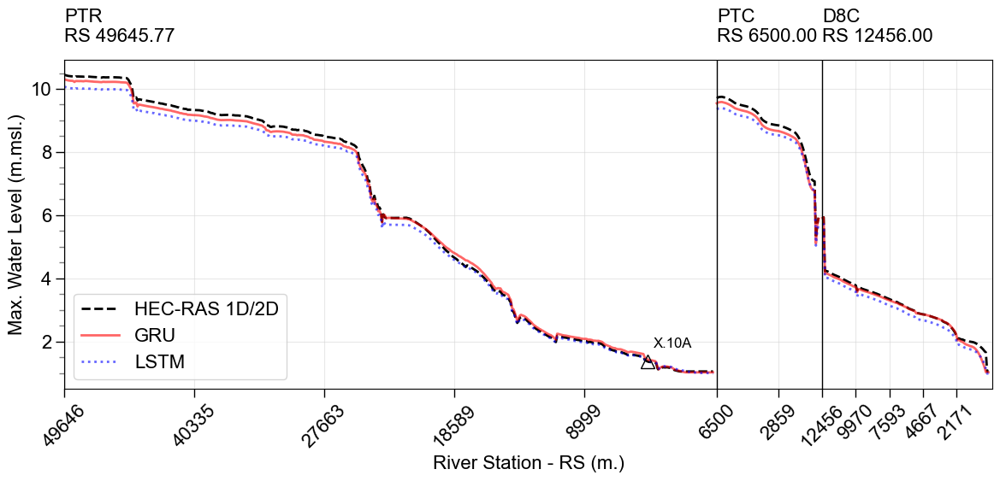

In [315]:
import numpy as np
import matplotlib.pyplot as plt

# Define custom font sizes
font_size_axis_labels = 16
font_size_ticks = 16
font_size_legend = 16
font_size_annotations = 16

# Get unique river names to categorize the data
rivers = geom_df['River'].unique()

# Define mapping for renaming river names
river_name_mapping = {
    "PATTANI_RIVER": "PTR",
    "canal1": "PTC",
    "D8": "D8C"
}

# Initialize lists to store categorized data
all_max_actual = []  # Store max actual water level values
index_mapping = []  # Store the mapping of RS values to new indices
xtick_labels = []  # Store labels for x-axis
xtick_positions = []  # Store positions of x-ticks
river_labels = []  # Store river names for annotations

# Generate a continuous temporary index for plotting
temp_index = 0

# Store separate segments to avoid linking between rivers
segments = []

for river in rivers:
    mask = geom_df['River'] == river
    rs_values = geom_df.loc[mask, 'RS'].values  # Use RS as X-axis
    indices = np.where(mask)[0]  # Get corresponding indices

    if len(indices) == 0:
        continue  # Skip empty rivers

    # Extract max values
    max_actual = all_actual[:, indices].max(axis=0)
    max_predict_GRU = all_predict_GRU[:, indices].max(axis=0)
    max_predict_LSTM = all_predict_LSTM[:, indices].max(axis=0)

    # Store max actual values in the list
    all_max_actual.extend(max_actual)

    # Store index mapping for this river
    index_range = range(temp_index, temp_index + len(rs_values))
    segments.append((index_range, max_actual, max_predict_GRU, max_predict_LSTM))

    # Store x-ticks (choosing every Nth RS for readability)
    step = max(1, len(rs_values) // 5)  # Adjust step size for better visibility
    xtick_labels.extend([f"{rs:.0f}" for rs in rs_values[::step]])
    xtick_positions.extend(list(index_range)[::step])

    # Rename river name if found in mapping
    new_river_name = river_name_mapping.get(river, river)

    # Store river name and RS for annotation
    river_labels.append((temp_index, rs_values[0], new_river_name))

    # **Insert a larger gap if the river is "canal1" (PTC)**
    if new_river_name == "PTC":
        temp_index += len(rs_values) + 2  # Extend gap
    else:
        temp_index += len(rs_values) + 2  # Normal gap

# Convert all_max_actual to numpy array
all_max_actual = np.array(all_max_actual)

# Plot the data using the temporary index
plt.figure(figsize=(14, 5))

# Plot each segment separately to avoid linking between different rivers
for index_range, max_actual, max_predict_GRU, max_predict_LSTM in segments:
    plt.plot(index_range, max_actual, linestyle='--', color='black', lw=2, alpha=1, label='HEC-RAS 1D/2D')
    plt.plot(index_range, max_predict_GRU, linestyle='-', color='red', lw=2, alpha=0.6, label='GRU')
    plt.plot(index_range, max_predict_LSTM, linestyle=':', color='blue', lw=2, alpha=0.6, label='LSTM')

# Add vertical lines and annotations for each river section
for idx, rs_start, river in river_labels:
    plt.axvline(x=idx, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
    plt.text(idx, np.max(all_max_actual) * 1.1, f"{river}\nRS {rs_start:.2f}",
             ha='left', fontsize=font_size_annotations, rotation=360)

# Ensure index 453 exists before plotting marker
if 453 < len(all_max_actual):
    plt.plot(453, all_max_actual[453], marker='^', markersize=12,
             color='black', markeredgecolor='black', fillstyle='none')
    plt.annotate("X.10A", (453, all_max_actual[453]),
                 xytext=(5,10), textcoords="offset points",  # Offset position for better readability
                 fontsize=12, color='black', ha='left', va='bottom')

# Formatting with custom font sizes
plt.xlabel('River Station - RS (m.)', fontsize=font_size_axis_labels)
plt.ylabel('Max. Water Level (m.msl.)', fontsize=font_size_axis_labels)
plt.grid(True, color='lightgray', alpha=0.5)
plt.minorticks_on()
plt.tick_params(which='both', width=1, labelsize=font_size_ticks)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

# Remove duplicate legend entries
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))

# Customize legend font size
plt.legend(by_label.values(), by_label.keys(),
           loc='lower left', fontsize=font_size_legend)

# Remove NaN labels from x-ticks
filtered_xticks = [(pos, label) for pos, label in zip(xtick_positions, xtick_labels) if label.lower() != 'nan']
xtick_positions, xtick_labels = zip(*filtered_xticks) if filtered_xticks else ([], [])

# Adjust x-axis labels to show RS values with custom font size
plt.xlim(0, temp_index)
plt.xticks(xtick_positions, xtick_labels, rotation=45, fontsize=font_size_ticks)
plt.tick_params(axis='x', which='minor', bottom=False, top=False)

# Show plot
plt.show()


In [316]:
# Filter the DataFrame to only contain rows for 'PATTANI_RIVER'
pattani_df = geom_df.loc[geom_df['River'] == 'PATTANI_RIVER']
pattani_df.reset_index(drop=True, inplace=True)
# Find the index where RS = 4623 in the filtered DataFrame
rs_4623_index = pattani_df.loc[pattani_df['RS'] == 44521].index

# Display the index of RS = 4623 within the filtered DataFrame
rs_4623_index

Int64Index([54], dtype='int64')

In [317]:
# Filter the DataFrame to only contain rows for 'PATTANI_RIVER'
pattani_df = geom_df.loc[geom_df['River'] == 'canal1']
pattani_df.reset_index(drop=True, inplace=True)
# Find the index where RS = 4623 in the filtered DataFrame
rs_4623_index = pattani_df.loc[pattani_df['RS'] == 44521].index

# Display the index of RS = 4623 within the filtered DataFrame
rs_4623_index

Int64Index([], dtype='int64')

In [318]:
mask = geom_df['River'] == 'canal1'
last_18_indices = geom_df[mask].index[-18:]  # Get the last 18 indices of 'canal1'
print(last_18_indices.tolist())  # Display as a list


[117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134]


In [319]:
mask = geom_df['River'] == 'canal1'
geom_mask = geom_df.drop(geom_df[mask].index[-18:]).reset_index(drop=True)
geom_mask

,River,Reach,RS,Name,Description,Len Left,Len Channel,Len Right,Left Bank,Right Bank,...,Contr (USF),Expan (USF),HP Count,HP Start Elev,HP Vert Incr,HP LOB Slices,HP Chan Slices,HP ROB Slices,Default Centerline,STA
0,PATTANI_RIVER,Reach 5,49645.77,,TOPO2022 49476.000,83.60,83.6,83.6,0.0,84.8,...,nan,nan,200,-1.87,0.1,5,5,5,0,83.60
1,PATTANI_RIVER,Reach 5,49562.00,,,83.90,83.9,83.9,0.471,83.932,...,nan,nan,200,-1.84,0.1,5,5,5,0,167.50
2,PATTANI_RIVER,Reach 5,49478.00,,,83.80,83.8,83.8,0.9420002,83.063,...,nan,nan,200,-1.87,0.1,5,5,5,0,251.30
3,PATTANI_RIVER,Reach 5,49394.00,,,83.80,83.8,83.8,1.413,82.195,...,nan,nan,200,-2.01,0.1,5,5,5,0,335.10
4,PATTANI_RIVER,Reach 5,49311.00,,,83.70,83.7,83.7,1.884,81.326,...,nan,nan,200,-2.18,0.1,5,5,5,0,418.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
692,PATTANI_RIVER,Reach 3,397.00,,TOPO2022 365.000,91.20,91.2,91.2,19.2,518.0,...,nan,nan,200,-3.15,0.1,5,5,5,0,69872.80
693,PATTANI_RIVER,Reach 3,306.00,,,91.20,91.2,91.2,18.7,343.1,...,nan,nan,200,-2.56,0.1,5,5,5,0,69964.00
694,PATTANI_RIVER,Reach 3,215.00,,,91.20,91.2,91.2,19.5,394.5,...,nan,nan,200,-2.02,0.1,5,5,5,0,70055.20
695,PATTANI_RIVER,Reach 3,124.00,,,91.20,91.2,91.2,18.5,345.7,...,nan,nan,200,-2.43,0.1,5,5,5,0,70146.40


In [320]:
# Step 2: Drop these indices from the second axis (columns) in all_actual
all_actual_mask = np.delete(all_actual, last_18_indices, axis=1)
all_predict_GRU_mask = np.delete(all_predict_GRU, last_18_indices, axis=1)
all_predict_LSTM_mask = np.delete(all_predict_LSTM, last_18_indices, axis=1)

In [321]:
all_predict_LSTM_mask.shape

(3073, 697)

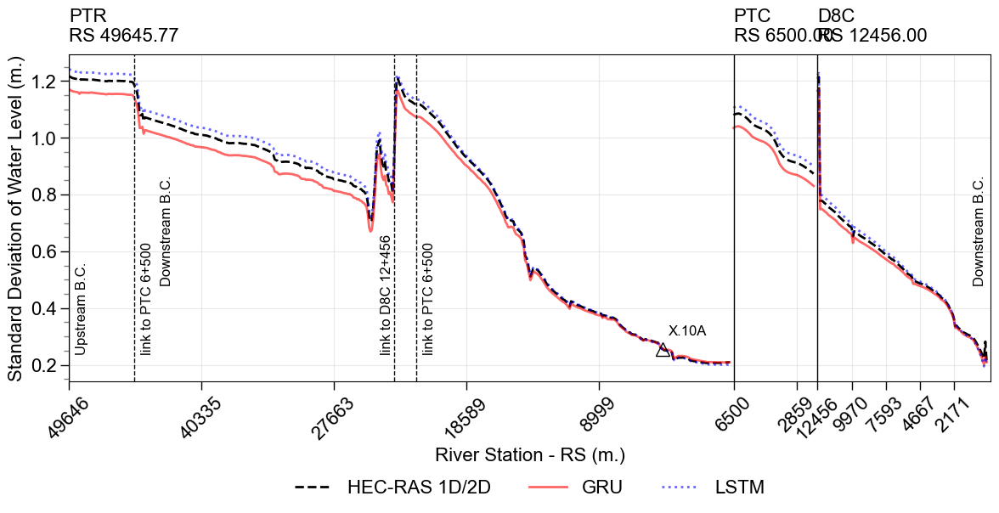

In [322]:
import numpy as np
import matplotlib.pyplot as plt

# Define custom font sizes
font_size_axis_labels = 16
font_size_ticks = 16
font_size_legend = 16
font_size_annotations = 16

# Get unique river names to categorize the data
rivers = geom_mask['River'].unique()

# Define mapping for renaming river names
river_name_mapping = {
    "PATTANI_RIVER": "PTR",
    "canal1": "PTC",
    "D8": "D8C"
}

# Initialize lists to store categorized data
all_std_actual = []  # Store standard deviation of actual water level values
index_mapping = []  # Store the mapping of RS values to new indices
xtick_labels = []  # Store labels for x-axis
xtick_positions = []  # Store positions of x-ticks
river_labels = []  # Store river names for annotations

# Generate a continuous temporary index for plotting
temp_index = 0

# Store separate segments to avoid linking between rivers
segments = []

for river in rivers:
    mask = geom_mask['River'] == river
    rs_values = geom_mask.loc[mask, 'RS'].values  # Use RS as X-axis
    indices = np.where(mask)[0]  # Get corresponding indices

    if len(indices) == 0:
        continue  # Skip empty rivers

    # Extract standard deviation values
    std_actual = all_actual_mask[:, indices].std(axis=0)
    std_predict_GRU = all_predict_GRU_mask[:, indices].std(axis=0)
    std_predict_LSTM = all_predict_LSTM_mask[:, indices].std(axis=0)

    # Store standard deviation actual values in the list
    all_std_actual.extend(std_actual)

    # Store index mapping for this river
    index_range = range(temp_index, temp_index + len(rs_values))
    segments.append((index_range, std_actual, std_predict_GRU, std_predict_LSTM))

    # Store x-ticks (choosing every Nth RS for readability)
    step = max(1, len(rs_values) // 5)  # Adjust step size for better visibility
    xtick_labels.extend([f"{rs:.0f}" for rs in rs_values[::step]])
    xtick_positions.extend(list(index_range)[::step])

    # Rename river name if found in mapping
    new_river_name = river_name_mapping.get(river, river)

    # Store river name and RS for annotation
    river_labels.append((temp_index, rs_values[0], new_river_name))

    # Insert a larger gap if the river is "canal1" (PTC)
    if new_river_name == "PTC":
        temp_index += len(rs_values) + 2  # Extend gap
    else:
        temp_index += len(rs_values) + 2  # Normal gap

# Convert all_std_actual to numpy array
all_std_actual = np.array(all_std_actual)

# Plot the data using the temporary index
plt.figure(figsize=(14, 5))

# Plot each segment separately to avoid linking between different rivers
for index_range, std_actual, std_predict_GRU, std_predict_LSTM in segments:
    plt.plot(index_range, std_actual, linestyle='--', color='black', lw=2, alpha=1, label='HEC-RAS 1D/2D')
    plt.plot(index_range, std_predict_GRU, linestyle='-', color='red', lw=2, alpha=0.6, label='GRU')
    plt.plot(index_range, std_predict_LSTM, linestyle=':', color='blue', lw=2, alpha=0.6, label='LSTM')




# Add vertical lines and annotations for each river section
for idx, rs_start, river in river_labels:
    plt.axvline(x=idx, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
    plt.text(idx, max(all_std_actual) * 1.1, f"{river}\nRS {rs_start:.2f}",
             ha='left', fontsize=font_size_annotations, rotation=360)

### custom annotations ####################
plt.text(5, max(all_std_actual) * 0.2, f"Upstream B.C.",ha='left', fontsize=12, rotation=90)

plt.axvline(x=248, color='k', linestyle='--', lw=1, alpha=1, zorder=99)
plt.text(248-10, max(all_std_actual) * 0.2, f"link to D8C 12+456",ha='left', fontsize=12, rotation=90)

plt.axvline(x=265, color='k', linestyle='--', lw=1, alpha=1, zorder=99)
plt.text(265+5, max(all_std_actual) * 0.2, f"link to PTC 6+500",ha='left', fontsize=12, rotation=90)

plt.axvline(x=50, color='k', linestyle='--', lw=1, alpha=1, zorder=99)
plt.text(50+5, max(all_std_actual) * 0.2, f"link to PTC 6+500",ha='left', fontsize=12, rotation=90)

plt.text(pattani_df.index.stop-10, max(all_std_actual) * 0.4, f"Downstream B.C.",ha='left', fontsize=12, rotation=90)

plt.text(xtick_positions[-1] + 15, max(all_std_actual) * 0.4, f"Downstream B.C.",ha='left', fontsize=12, rotation=90)

##########################################

# Ensure index 453 exists before plotting marker
if 453 < len(all_std_actual):
    plt.plot(453, all_std_actual[453], marker='^', markersize=12,
             color='black', markeredgecolor='black', fillstyle='none')
    plt.annotate("X.10A", (453, all_std_actual[453]),
                 xytext=(5,10), textcoords="offset points",  # Offset position for better readability
                 fontsize=12, color='black', ha='left', va='bottom')

# Formatting with custom font sizes
plt.xlabel('River Station - RS (m.)', fontsize=font_size_axis_labels)
plt.ylabel('Standard Deviation of Water Level (m.)', fontsize=font_size_axis_labels)
plt.grid(True, color='lightgray', alpha=0.5)
plt.minorticks_on()
plt.tick_params(which='both', width=1, labelsize=font_size_ticks)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

# Remove duplicate legend entries
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))

# Customize legend font size
# plt.legend(by_label.values(), by_label.keys(),
#            loc='lower left', fontsize=font_size_legend)

plt.legend(by_label.values(), by_label.keys(),
           loc='upper center', bbox_to_anchor=(0.5, -0.25),  # Adjust bbox_to_anchor for position
           fontsize=font_size_legend, ncol=3, frameon=False)  # ncol controls horizontal layout

# Remove NaN labels from x-ticks
filtered_xticks = [(pos, label) for pos, label in zip(xtick_positions, xtick_labels) if label.lower() != 'nan']
xtick_positions, xtick_labels = zip(*filtered_xticks) if filtered_xticks else ([], [])

# Adjust x-axis labels to show RS values with custom font size
plt.xlim(0, temp_index)
plt.xticks(xtick_positions, xtick_labels, rotation=45, fontsize=font_size_ticks)
plt.tick_params(axis='x', which='minor', bottom=False, top=False)

# Show plot
plt.show()


In [323]:
pattani_df.index

RangeIndex(start=0, stop=80, step=1)

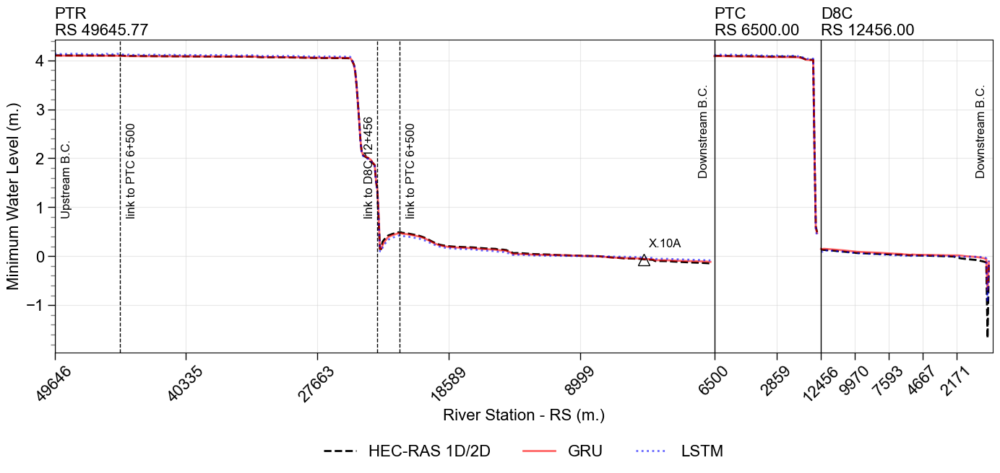

In [324]:
import numpy as np
import matplotlib.pyplot as plt

# Define custom font sizes
font_size_axis_labels = 16
font_size_ticks = 16
font_size_legend = 16
font_size_annotations = 16

# Get unique river names to categorize the data
rivers = geom_df['River'].unique()

# Define mapping for renaming river names
river_name_mapping = {
    "PATTANI_RIVER": "PTR",
    "canal1": "PTC",
    "D8": "D8C"
}

# Initialize lists to store categorized data
all_min_actual = []  # Store min of actual water level values
xtick_labels = []    # Store labels for x-axis
xtick_positions = [] # Store positions of x-ticks
river_labels = []    # Store river names for annotations

# Generate a continuous temporary index for plotting
temp_index = 0

# Store separate segments to avoid linking between rivers
segments = []

for river in rivers:
    mask = geom_df['River'] == river
    rs_values = geom_df.loc[mask, 'RS'].values
    indices = np.where(mask)[0]

    if len(indices) == 0:
        continue

    # Extract minimum values
    min_actual = all_actual[:, indices].min(axis=0)
    min_predict_GRU = all_predict_GRU[:, indices].min(axis=0)
    min_predict_LSTM = all_predict_LSTM[:, indices].min(axis=0)

    # Store actual min values for y-axis reference
    all_min_actual.extend(min_actual)

    # Create continuous index for plotting
    index_range = range(temp_index, temp_index + len(rs_values))
    segments.append((index_range, min_actual, min_predict_GRU, min_predict_LSTM))

    # Store x-ticks (choosing every Nth RS for readability)
    step = max(1, len(rs_values) // 5)
    xtick_labels.extend([f"{rs:.0f}" for rs in rs_values[::step]])
    xtick_positions.extend(list(index_range)[::step])

    # Rename river if needed
    new_river_name = river_name_mapping.get(river, river)
    river_labels.append((temp_index, rs_values[0], new_river_name))

    # Gap between river segments
    temp_index += len(rs_values) + 2

# Convert to NumPy array for y-limit calculation
all_min_actual = np.array(all_min_actual)

# Plotting
plt.figure(figsize=(14, 7))

# Plot each segment
for index_range, min_actual, min_gru, min_lstm in segments:
    plt.plot(index_range, min_actual, linestyle='--', color='black', lw=2, alpha=1, label='HEC-RAS 1D/2D')
    plt.plot(index_range, min_gru, linestyle='-', color='red', lw=2, alpha=0.6, label='GRU')
    plt.plot(index_range, min_lstm, linestyle=':', color='blue', lw=2, alpha=0.6, label='LSTM')

# Vertical lines and annotations for each river
for idx, rs_start, river in river_labels:
    plt.axvline(x=idx, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
    plt.text(idx, max(all_min_actual) * 1.1, f"{river}\nRS {rs_start:.2f}",
             ha='left', fontsize=font_size_annotations, rotation=360)

# Custom annotations
plt.text(5, max(all_min_actual) * 0.2, "Upstream B.C.", ha='left', fontsize=12, rotation=90)
plt.axvline(x=248, color='k', linestyle='--', lw=1)
plt.text(238, max(all_min_actual) * 0.2, "link to D8C 12+456", ha='left', fontsize=12, rotation=90)
plt.axvline(x=265, color='k', linestyle='--', lw=1)
plt.text(270, max(all_min_actual) * 0.2, "link to PTC 6+500", ha='left', fontsize=12, rotation=90)
plt.axvline(x=50, color='k', linestyle='--', lw=1)
plt.text(55, max(all_min_actual) * 0.2, "link to PTC 6+500", ha='left', fontsize=12, rotation=90)
plt.text(495, max(all_min_actual) * 0.4, "Downstream B.C.", ha='left', fontsize=12, rotation=90)
plt.text(xtick_positions[-1] + 15, max(all_min_actual) * 0.4, "Downstream B.C.", ha='left', fontsize=12, rotation=90)

# Optional marker
if 453 < len(all_min_actual):
    plt.plot(453, all_min_actual[453], marker='^', markersize=12,
             color='black', markeredgecolor='black', fillstyle='none')
    plt.annotate("X.10A", (453, all_min_actual[453]),
                 xytext=(5, 10), textcoords="offset points",
                 fontsize=12, color='black', ha='left', va='bottom')

# Axis formatting
plt.xlabel('River Station - RS (m.)', fontsize=font_size_axis_labels)
plt.ylabel('Minimum Water Level (m.)', fontsize=font_size_axis_labels)
plt.grid(True, color='lightgray', alpha=0.5)
plt.minorticks_on()
plt.tick_params(which='both', width=1, labelsize=font_size_ticks)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

# Remove duplicate legends
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(),
           loc='upper center', bbox_to_anchor=(0.5, -0.25),
           fontsize=font_size_legend, ncol=3, frameon=False)

# Clean up x-ticks
filtered_xticks = [(pos, label) for pos, label in zip(xtick_positions, xtick_labels) if label.lower() != 'nan']
xtick_positions, xtick_labels = zip(*filtered_xticks) if filtered_xticks else ([], [])
plt.xlim(0, temp_index)
plt.xticks(xtick_positions, xtick_labels, rotation=45, fontsize=font_size_ticks)
plt.tick_params(axis='x', which='minor', bottom=False, top=False)

# Final layout and show
plt.tight_layout()
plt.show()


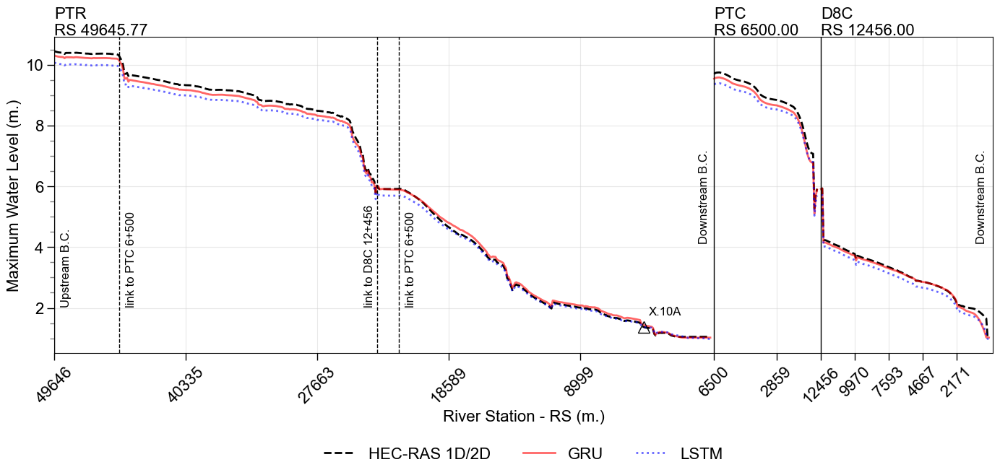

In [325]:
import numpy as np
import matplotlib.pyplot as plt

# Define custom font sizes
font_size_axis_labels = 16
font_size_ticks = 16
font_size_legend = 16
font_size_annotations = 16

# Get unique river names to categorize the data
rivers = geom_df['River'].unique()

# Define mapping for renaming river names
river_name_mapping = {
    "PATTANI_RIVER": "PTR",
    "canal1": "PTC",
    "D8": "D8C"
}

# Initialize lists to store categorized data
all_max_actual = []  # Store max of actual water level values
xtick_labels = []    # Store labels for x-axis
xtick_positions = [] # Store positions of x-ticks
river_labels = []    # Store river names for annotations

# Generate a continuous temporary index for plotting
temp_index = 0

# Store separate segments to avoid linking between rivers
segments = []

for river in rivers:
    mask = geom_df['River'] == river
    rs_values = geom_df.loc[mask, 'RS'].values
    indices = np.where(mask)[0]

    if len(indices) == 0:
        continue

    # Extract maximum values
    max_actual = all_actual[:, indices].max(axis=0)
    max_predict_GRU = all_predict_GRU[:, indices].max(axis=0)
    max_predict_LSTM = all_predict_LSTM[:, indices].max(axis=0)

    # Store actual max values for y-axis reference
    all_max_actual.extend(max_actual)

    # Create continuous index for plotting
    index_range = range(temp_index, temp_index + len(rs_values))
    segments.append((index_range, max_actual, max_predict_GRU, max_predict_LSTM))

    # Store x-ticks (choosing every Nth RS for readability)
    step = max(1, len(rs_values) // 5)
    xtick_labels.extend([f"{rs:.0f}" for rs in rs_values[::step]])
    xtick_positions.extend(list(index_range)[::step])

    # Rename river if needed
    new_river_name = river_name_mapping.get(river, river)
    river_labels.append((temp_index, rs_values[0], new_river_name))

    # Gap between river segments
    temp_index += len(rs_values) + 2

# Convert to NumPy array for y-limit calculation
all_max_actual = np.array(all_max_actual)

# Plotting
plt.figure(figsize=(14, 7))

# Plot each segment
for index_range, max_actual, max_gru, max_lstm in segments:
    plt.plot(index_range, max_actual, linestyle='--', color='black', lw=2, alpha=1, label='HEC-RAS 1D/2D')
    plt.plot(index_range, max_gru, linestyle='-', color='red', lw=2, alpha=0.6, label='GRU')
    plt.plot(index_range, max_lstm, linestyle=':', color='blue', lw=2, alpha=0.6, label='LSTM')

# Vertical lines and annotations for each river
for idx, rs_start, river in river_labels:
    plt.axvline(x=idx, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
    plt.text(idx, max(all_max_actual) * 1.05, f"{river}\nRS {rs_start:.2f}",
             ha='left', fontsize=font_size_annotations, rotation=360)

# Custom annotations
plt.text(5, max(all_max_actual) * 0.2, "Upstream B.C.", ha='left', fontsize=12, rotation=90)
plt.axvline(x=248, color='k', linestyle='--', lw=1)
plt.text(238, max(all_max_actual) * 0.2, "link to D8C 12+456", ha='left', fontsize=12, rotation=90)
plt.axvline(x=265, color='k', linestyle='--', lw=1)
plt.text(270, max(all_max_actual) * 0.2, "link to PTC 6+500", ha='left', fontsize=12, rotation=90)
plt.axvline(x=50, color='k', linestyle='--', lw=1)
plt.text(55, max(all_max_actual) * 0.2, "link to PTC 6+500", ha='left', fontsize=12, rotation=90)
plt.text(495, max(all_max_actual) * 0.4, "Downstream B.C.", ha='left', fontsize=12, rotation=90)
plt.text(xtick_positions[-1] + 15, max(all_max_actual) * 0.4, "Downstream B.C.", ha='left', fontsize=12, rotation=90)

# Optional marker
if 453 < len(all_max_actual):
    plt.plot(453, all_max_actual[453], marker='^', markersize=12,
             color='black', markeredgecolor='black', fillstyle='none')
    plt.annotate("X.10A", (453, all_max_actual[453]),
                 xytext=(5, 10), textcoords="offset points",
                 fontsize=12, color='black', ha='left', va='bottom')

# Axis formatting
plt.xlabel('River Station - RS (m.)', fontsize=font_size_axis_labels)
plt.ylabel('Maximum Water Level (m.)', fontsize=font_size_axis_labels)
plt.grid(True, color='lightgray', alpha=0.5)
plt.minorticks_on()
plt.tick_params(which='both', width=1, labelsize=font_size_ticks)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

# Remove duplicate legends
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(),
           loc='upper center', bbox_to_anchor=(0.5, -0.25),
           fontsize=font_size_legend, ncol=3, frameon=False)

# Clean up x-ticks
filtered_xticks = [(pos, label) for pos, label in zip(xtick_positions, xtick_labels) if label.lower() != 'nan']
xtick_positions, xtick_labels = zip(*filtered_xticks) if filtered_xticks else ([], [])
plt.xlim(0, temp_index)
plt.xticks(xtick_positions, xtick_labels, rotation=45, fontsize=font_size_ticks)
plt.tick_params(axis='x', which='minor', bottom=False, top=False)

# Final layout and show
plt.tight_layout()
plt.show()


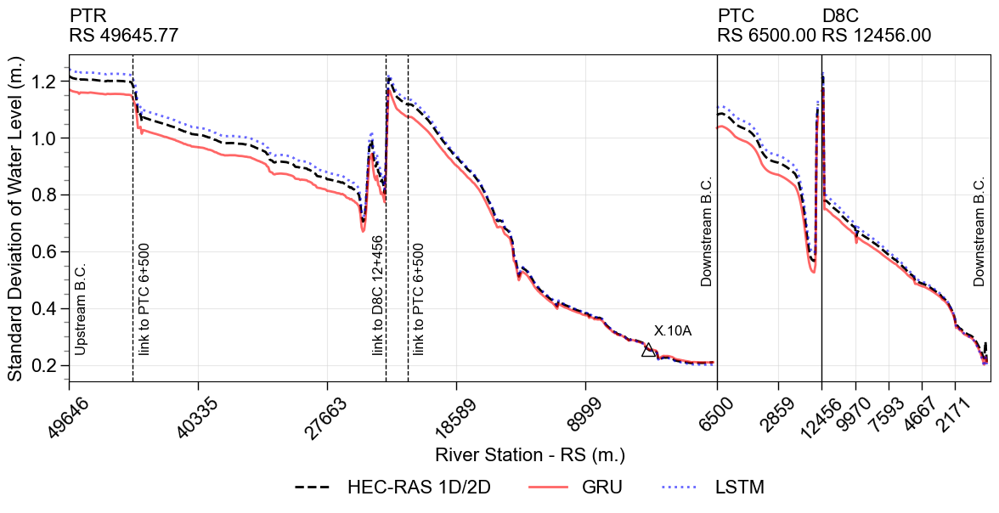

In [326]:
import numpy as np
import matplotlib.pyplot as plt

# Define custom font sizes
font_size_axis_labels = 16
font_size_ticks = 16
font_size_legend = 16
font_size_annotations = 16

# Get unique river names to categorize the data
rivers = geom_df['River'].unique()

# Define mapping for renaming river names
river_name_mapping = {
    "PATTANI_RIVER": "PTR",
    "canal1": "PTC",
    "D8": "D8C"
}

# Initialize lists to store categorized data
all_std_actual = []  # Store standard deviation of actual water level values
index_mapping = []  # Store the mapping of RS values to new indices
xtick_labels = []  # Store labels for x-axis
xtick_positions = []  # Store positions of x-ticks
river_labels = []  # Store river names for annotations

# Generate a continuous temporary index for plotting
temp_index = 0

# Store separate segments to avoid linking between rivers
segments = []

for river in rivers:
    mask = geom_df['River'] == river
    rs_values = geom_df.loc[mask, 'RS'].values  # Use RS as X-axis
    indices = np.where(mask)[0]  # Get corresponding indices

    if len(indices) == 0:
        continue  # Skip empty rivers

    # Extract standard deviation values
    std_actual = all_actual[:, indices].std(axis=0)
    std_predict_GRU = all_predict_GRU[:, indices].std(axis=0)
    std_predict_LSTM = all_predict_LSTM[:, indices].std(axis=0)

    # Store standard deviation actual values in the list
    all_std_actual.extend(std_actual)

    # Store index mapping for this river
    index_range = range(temp_index, temp_index + len(rs_values))
    segments.append((index_range, std_actual, std_predict_GRU, std_predict_LSTM))

    # Store x-ticks (choosing every Nth RS for readability)
    step = max(1, len(rs_values) // 5)  # Adjust step size for better visibility
    xtick_labels.extend([f"{rs:.0f}" for rs in rs_values[::step]])
    xtick_positions.extend(list(index_range)[::step])

    # Rename river name if found in mapping
    new_river_name = river_name_mapping.get(river, river)

    # Store river name and RS for annotation
    river_labels.append((temp_index, rs_values[0], new_river_name))

    # Insert a larger gap if the river is "canal1" (PTC)
    if new_river_name == "PTC":
        temp_index += len(rs_values) + 2  # Extend gap
    else:
        temp_index += len(rs_values) + 2  # Normal gap

# Convert all_std_actual to numpy array
all_std_actual = np.array(all_std_actual)

# Plot the data using the temporary index
plt.figure(figsize=(14, 5))

# Plot each segment separately to avoid linking between different rivers
for index_range, std_actual, std_predict_GRU, std_predict_LSTM in segments:
    plt.plot(index_range, std_actual, linestyle='--', color='black', lw=2, alpha=1, label='HEC-RAS 1D/2D')
    plt.plot(index_range, std_predict_GRU, linestyle='-', color='red', lw=2, alpha=0.6, label='GRU')
    plt.plot(index_range, std_predict_LSTM, linestyle=':', color='blue', lw=2, alpha=0.6, label='LSTM')




# Add vertical lines and annotations for each river section
for idx, rs_start, river in river_labels:
    plt.axvline(x=idx, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
    plt.text(idx, max(all_std_actual) * 1.1, f"{river}\nRS {rs_start:.2f}",
             ha='left', fontsize=font_size_annotations, rotation=360)

### custom annotations ####################
plt.text(5, max(all_std_actual) * 0.2, f"Upstream B.C.",ha='left', fontsize=12, rotation=90)

plt.axvline(x=248, color='k', linestyle='--', lw=1, alpha=1, zorder=99)
plt.text(248-10, max(all_std_actual) * 0.2, f"link to D8C 12+456",ha='left', fontsize=12, rotation=90)

plt.axvline(x=265, color='k', linestyle='--', lw=1, alpha=1, zorder=99)
plt.text(265+5, max(all_std_actual) * 0.2, f"link to PTC 6+500",ha='left', fontsize=12, rotation=90)

plt.axvline(x=50, color='k', linestyle='--', lw=1, alpha=1, zorder=99)
plt.text(50+5, max(all_std_actual) * 0.2, f"link to PTC 6+500",ha='left', fontsize=12, rotation=90)

plt.text(495, max(all_std_actual) * 0.4, f"Downstream B.C.",ha='left', fontsize=12, rotation=90)

plt.text(xtick_positions[-1] + 15, max(all_std_actual) * 0.4, f"Downstream B.C.",ha='left', fontsize=12, rotation=90)

##########################################

# Ensure index 453 exists before plotting marker
if 453 < len(all_std_actual):
    plt.plot(453, all_std_actual[453], marker='^', markersize=12,
             color='black', markeredgecolor='black', fillstyle='none')
    plt.annotate("X.10A", (453, all_std_actual[453]),
                 xytext=(5,10), textcoords="offset points",  # Offset position for better readability
                 fontsize=12, color='black', ha='left', va='bottom')

# Formatting with custom font sizes
plt.xlabel('River Station - RS (m.)', fontsize=font_size_axis_labels)
plt.ylabel('Standard Deviation of Water Level (m.)', fontsize=font_size_axis_labels)
plt.grid(True, color='lightgray', alpha=0.5)
plt.minorticks_on()
plt.tick_params(which='both', width=1, labelsize=font_size_ticks)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

# Remove duplicate legend entries
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))

# Customize legend font size
# plt.legend(by_label.values(), by_label.keys(),
#            loc='lower left', fontsize=font_size_legend)

plt.legend(by_label.values(), by_label.keys(),
           loc='upper center', bbox_to_anchor=(0.5, -0.25),  # Adjust bbox_to_anchor for position
           fontsize=font_size_legend, ncol=3, frameon=False)  # ncol controls horizontal layout

# Remove NaN labels from x-ticks
filtered_xticks = [(pos, label) for pos, label in zip(xtick_positions, xtick_labels) if label.lower() != 'nan']
xtick_positions, xtick_labels = zip(*filtered_xticks) if filtered_xticks else ([], [])

# Adjust x-axis labels to show RS values with custom font size
plt.xlim(0, temp_index)
plt.xticks(xtick_positions, xtick_labels, rotation=45, fontsize=font_size_ticks)
plt.tick_params(axis='x', which='minor', bottom=False, top=False)

# Show plot
plt.show()


In [327]:
geom_mask.columns

Index(['River', 'Reach', 'RS', 'Name', 'Description', 'Len Left',
       'Len Channel', 'Len Right', 'Left Bank', 'Right Bank', 'Friction Mode',
       'Contr', 'Expan', 'Contr (USF)', 'Expan (USF)', 'HP Count',
       'HP Start Elev', 'HP Vert Incr', 'HP LOB Slices', 'HP Chan Slices',
       'HP ROB Slices', 'Default Centerline', 'STA'],
      dtype='object')

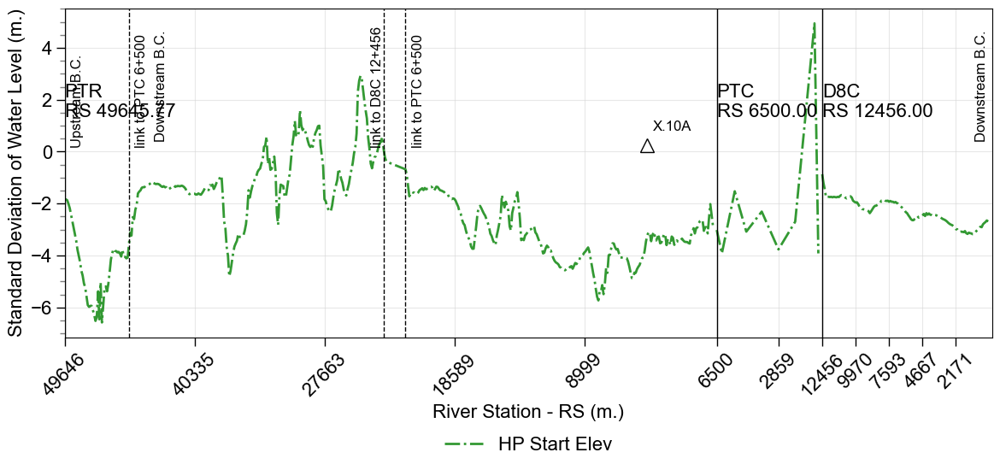

In [328]:
import numpy as np
import matplotlib.pyplot as plt

# Define custom font sizes
font_size_axis_labels = 16
font_size_ticks = 16
font_size_legend = 16
font_size_annotations = 16

# Get unique river names to categorize the data
rivers = geom_df['River'].unique()

# Define mapping for renaming river names
river_name_mapping = {
    "PATTANI_RIVER": "PTR",
    "canal1": "PTC",
    "D8": "D8C"
}

# Initialize lists to store categorized data
all_std_actual = []  # Store standard deviation of actual water level values
index_mapping = []  # Store the mapping of RS values to new indices
xtick_labels = []  # Store labels for x-axis
xtick_positions = []  # Store positions of x-ticks
river_labels = []  # Store river names for annotations

# Generate a continuous temporary index for plotting
temp_index = 0

# Store separate segments to avoid linking between rivers
segments = []
hp_elev_segments = []  # Store HP Start Elev values for each segment

for river in rivers:
    mask = geom_df['River'] == river
    rs_values = geom_df.loc[mask, 'RS'].values  # Use RS as X-axis
    indices = np.where(mask)[0]  # Get corresponding indices

    if len(indices) == 0:
        continue  # Skip empty rivers

    # Extract standard deviation values
    std_actual = all_actual[:, indices].std(axis=0)
    std_predict_GRU = all_predict_GRU[:, indices].std(axis=0)
    std_predict_LSTM = all_predict_LSTM[:, indices].std(axis=0)

    # Store standard deviation actual values in the list
    all_std_actual.extend(std_actual)

    # Store index mapping for this river
    index_range = range(temp_index, temp_index + len(rs_values))
    segments.append((index_range, std_actual, std_predict_GRU, std_predict_LSTM))

    # Store HP Start Elevation values for this river
    hp_start_elev_values = geom_df.loc[mask, 'HP Start Elev'].values
    hp_elev_segments.append((index_range, hp_start_elev_values))

    # Store x-ticks (choosing every Nth RS for readability)
    step = max(1, len(rs_values) // 5)  # Adjust step size for better visibility
    xtick_labels.extend([f"{rs:.0f}" for rs in rs_values[::step]])
    xtick_positions.extend(list(index_range)[::step])

    # Rename river name if found in mapping
    new_river_name = river_name_mapping.get(river, river)

    # Store river name and RS for annotation
    river_labels.append((temp_index, rs_values[0], new_river_name))

    # Insert a larger gap if the river is "canal1" (PTC)
    if new_river_name == "PTC":
        temp_index += len(rs_values) + 2  # Extend gap
    else:
        temp_index += len(rs_values) + 2  # Normal gap

# Convert all_std_actual to numpy array
all_std_actual = np.array(all_std_actual)

# Plot the data using the temporary index
plt.figure(figsize=(14, 5))

for index_range, hp_values in hp_elev_segments:
    plt.plot(index_range, hp_values, linestyle='-.', color='green', lw=2, alpha=0.8, label='HP Start Elev')


# Add vertical lines and annotations for each river section
for idx, rs_start, river in river_labels:
    plt.axvline(x=idx, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
    plt.text(idx, max(all_std_actual) * 1.1, f"{river}\nRS {rs_start:.2f}",
             ha='left', fontsize=font_size_annotations, rotation=360)

### custom annotations ####################
plt.text(5, max(all_std_actual) * 0.2, f"Upstream B.C.",ha='left', fontsize=12, rotation=90)

plt.axvline(x=248, color='k', linestyle='--', lw=1, alpha=1, zorder=99)
plt.text(248-10, max(all_std_actual) * 0.2, f"link to D8C 12+456",ha='left', fontsize=12, rotation=90)

plt.axvline(x=265, color='k', linestyle='--', lw=1, alpha=1, zorder=99)
plt.text(265+5, max(all_std_actual) * 0.2, f"link to PTC 6+500",ha='left', fontsize=12, rotation=90)

plt.axvline(x=50, color='k', linestyle='--', lw=1, alpha=1, zorder=99)
plt.text(50+5, max(all_std_actual) * 0.2, f"link to PTC 6+500",ha='left', fontsize=12, rotation=90)

plt.text(pattani_df.index.stop-10, max(all_std_actual) * 0.4, f"Downstream B.C.",ha='left', fontsize=12, rotation=90)

plt.text(xtick_positions[-1] + 15, max(all_std_actual) * 0.4, f"Downstream B.C.",ha='left', fontsize=12, rotation=90)

##########################################

# Ensure index 453 exists before plotting marker
if 453 < len(all_std_actual):
    plt.plot(453, all_std_actual[453], marker='^', markersize=12,
             color='black', markeredgecolor='black', fillstyle='none')
    plt.annotate("X.10A", (453, all_std_actual[453]),
                 xytext=(5,10), textcoords="offset points",  # Offset position for better readability
                 fontsize=12, color='black', ha='left', va='bottom')

# Formatting with custom font sizes
plt.xlabel('River Station - RS (m.)', fontsize=font_size_axis_labels)
plt.ylabel('Standard Deviation of Water Level (m.)', fontsize=font_size_axis_labels)
plt.grid(True, color='lightgray', alpha=0.5)
plt.minorticks_on()
plt.tick_params(which='both', width=1, labelsize=font_size_ticks)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

# Remove duplicate legend entries
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))

# Customize legend font size
# plt.legend(by_label.values(), by_label.keys(),
#            loc='lower left', fontsize=font_size_legend)

plt.legend(by_label.values(), by_label.keys(),
           loc='upper center', bbox_to_anchor=(0.5, -0.25),  # Adjust bbox_to_anchor for position
           fontsize=font_size_legend, ncol=3, frameon=False)  # ncol controls horizontal layout

# Remove NaN labels from x-ticks
filtered_xticks = [(pos, label) for pos, label in zip(xtick_positions, xtick_labels) if label.lower() != 'nan']
xtick_positions, xtick_labels = zip(*filtered_xticks) if filtered_xticks else ([], [])

# Adjust x-axis labels to show RS values with custom font size
plt.xlim(0, temp_index)
plt.xticks(xtick_positions, xtick_labels, rotation=45, fontsize=font_size_ticks)
plt.tick_params(axis='x', which='minor', bottom=False, top=False)

# Show plot
plt.show()


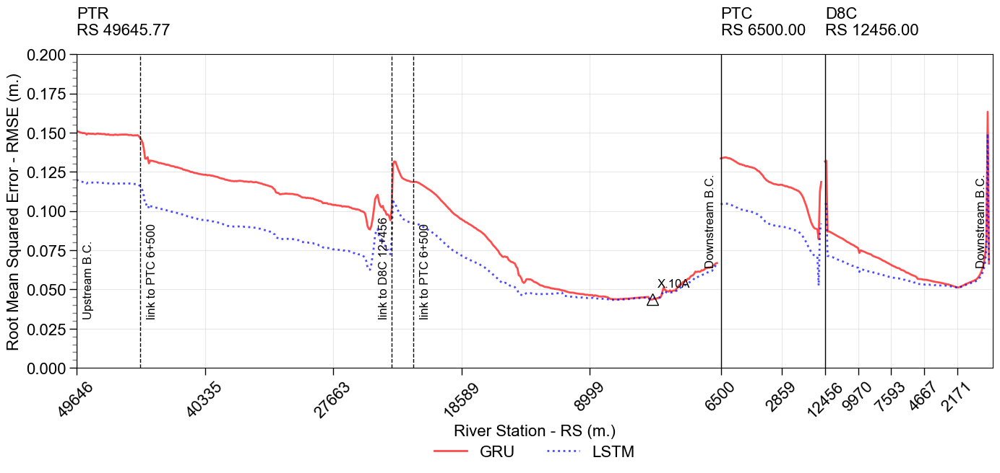

In [329]:
import numpy as np
import matplotlib.pyplot as plt

# Define custom font sizes
font_size_axis_labels = 16
font_size_ticks = 16
font_size_legend = 16
font_size_annotations = 16

# Get unique river names to categorize the data
rivers = geom_df['River'].unique()

# Define mapping for renaming river names
river_name_mapping = {
    "PATTANI_RIVER": "PTR",
    "canal1": "PTC",
    "D8": "D8C"
}

# Initialize lists to store categorized data
all_rmse_gru = []  # For axis limit calculation
xtick_labels = []
xtick_positions = []
river_labels = []

# Initialize counters and storage for segments
temp_index = 0
segments = []  # Store RMSEs per segment
hp_elev_segments = []  # Store HP Start Elev values for each segment

# Loop through each river
for river in rivers:
    mask = geom_df['River'] == river
    rs_values = geom_df.loc[mask, 'RS'].values
    indices = np.where(mask)[0]

    if len(indices) == 0:
        continue

    # Calculate RMSE for each station in this segment
    rmse_gru = np.sqrt(np.mean((all_actual[:, indices] - all_predict_GRU[:, indices])**2, axis=0))
    rmse_lstm = np.sqrt(np.mean((all_actual[:, indices] - all_predict_LSTM[:, indices])**2, axis=0))

    # Store for global reference
    all_rmse_gru.extend(rmse_gru)

    # Index range for plotting
    index_range = range(temp_index, temp_index + len(rs_values))
    segments.append((index_range, rmse_gru, rmse_gru, rmse_lstm))

    # Set xticks for RS
    step = max(1, len(rs_values) // 5)
    xtick_labels.extend([f"{rs:.0f}" for rs in rs_values[::step]])
    xtick_positions.extend(list(index_range)[::step])

    # Rename river if needed
    new_river_name = river_name_mapping.get(river, river)
    river_labels.append((temp_index, rs_values[0], new_river_name))

    # Increase index counter
    temp_index += len(rs_values) + 2

# Convert to numpy array
all_rmse_gru = np.array(all_rmse_gru)

# Plot
plt.figure(figsize=(14, 7))

# Plot RMSE
for index_range, rmse_gru, _, rmse_lstm in segments:
    plt.plot(index_range, rmse_gru, linestyle='-', color='red', lw=2, alpha=0.7, label='GRU')
    plt.plot(index_range, rmse_lstm, linestyle=':', color='blue', lw=2, alpha=0.7, label='LSTM')


# Annotations and vertical dividers
for idx, rs_start, river in river_labels:
    plt.axvline(x=idx, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
    plt.text(idx, max(all_rmse_gru) * 1.3, f"{river}\nRS {rs_start:.2f}",
             ha='left', fontsize=font_size_annotations, rotation=360)

# Custom annotations
plt.text(5, max(all_rmse_gru) * 0.2, "Upstream B.C.", ha='left', fontsize=12, rotation=90)
plt.axvline(x=248, color='k', linestyle='--', lw=1)
plt.text(238, max(all_rmse_gru) * 0.2, "link to D8C 12+456", ha='left', fontsize=12, rotation=90)
plt.axvline(x=265, color='k', linestyle='--', lw=1)
plt.text(270, max(all_rmse_gru) * 0.2, "link to PTC 6+500", ha='left', fontsize=12, rotation=90)
plt.axvline(x=50, color='k', linestyle='--', lw=1)
plt.text(55, max(all_rmse_gru) * 0.2, "link to PTC 6+500", ha='left', fontsize=12, rotation=90)
plt.text(495, max(all_rmse_gru) * 0.4, "Downstream B.C.", ha='left', fontsize=12, rotation=90)
plt.text(xtick_positions[-1] + 15, max(all_rmse_gru) * 0.4, "Downstream B.C.", ha='left', fontsize=12, rotation=90)

# Special marker (if index valid)
if 453 < len(all_rmse_gru):
    plt.plot(453, all_rmse_gru[453], marker='^', markersize=12,
             color='black', markeredgecolor='black', fillstyle='none')
    plt.annotate("X.10A", (453, all_rmse_gru[453]),
                 xytext=(5, 10), textcoords="offset points",
                 fontsize=12, color='black', ha='left', va='bottom')

# Axis settings
plt.xlabel('River Station - RS (m.)', fontsize=font_size_axis_labels)
plt.ylabel('Root Mean Squared Error - RMSE (m.)', fontsize=font_size_axis_labels)
plt.grid(True, color='lightgray', alpha=0.5)
plt.minorticks_on()
plt.tick_params(which='both', width=1, labelsize=font_size_ticks)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')
plt.ylim(0, 0.2)
# Clean up legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(),
           loc='upper center', bbox_to_anchor=(0.5, -0.20),
           fontsize=font_size_legend, ncol=3, frameon=False)

# Clean x-tick labels
filtered_xticks = [(pos, label) for pos, label in zip(xtick_positions, xtick_labels) if label.lower() != 'nan']
xtick_positions, xtick_labels = zip(*filtered_xticks) if filtered_xticks else ([], [])
plt.xlim(0, temp_index)
plt.xticks(xtick_positions, xtick_labels, rotation=45, fontsize=font_size_ticks)
plt.tick_params(axis='x', which='minor', bottom=False, top=False)

# Show
plt.tight_layout()
plt.show()


In [330]:
all_rmse_gru

array([0.15127812, 0.15070569, 0.15056076, 0.15004122, 0.14998316,
       0.14969667, 0.14974837, 0.14959397, 0.14878021, 0.14948973,
       0.14934912, 0.14934267, 0.14921303, 0.14937583, 0.14913626,
       0.14904541, 0.14937057, 0.1494601 , 0.14922283, 0.14926971,
       0.14909742, 0.14912472, 0.1491393 , 0.14885004, 0.14872474,
       0.14898072, 0.14858794, 0.14853746, 0.14858677, 0.14846948,
       0.14873641, 0.14875077, 0.14855441, 0.14856118, 0.14874089,
       0.14870798, 0.14880496, 0.14874547, 0.14876892, 0.14879864,
       0.14871133, 0.1484973 , 0.14847588, 0.14856488, 0.14825192,
       0.14817958, 0.14835257, 0.14826812, 0.14839095, 0.14785169,
       0.14664301, 0.14531865, 0.14372296, 0.13971924, 0.13342442,
       0.13342224, 0.13435892, 0.13044555, 0.13225476, 0.13202364,
       0.13197155, 0.13171113, 0.13150823, 0.13132923, 0.13094468,
       0.13057649, 0.13066667, 0.13037636, 0.13018084, 0.13008584,
       0.12965714, 0.1295478 , 0.12950339, 0.12929303, 0.12884

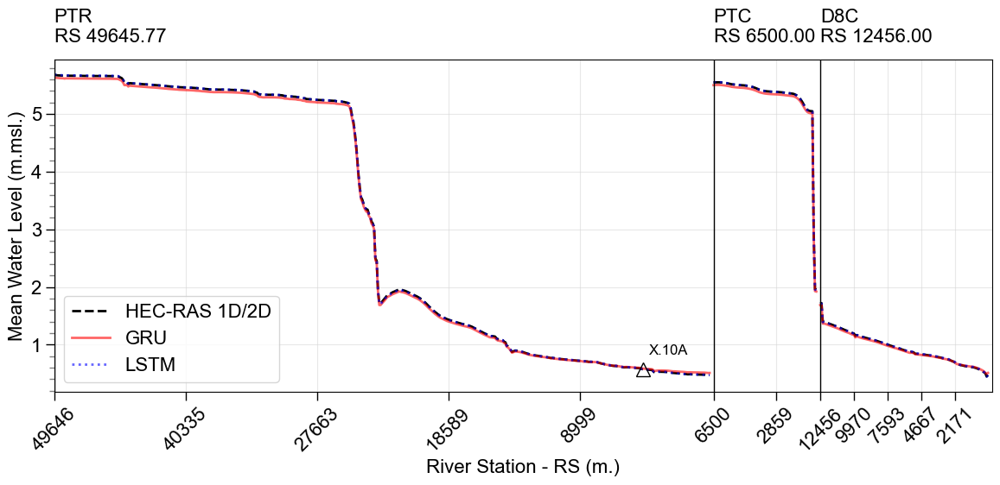

In [331]:
import numpy as np
import matplotlib.pyplot as plt

# Define custom font sizes
font_size_axis_labels = 16
font_size_ticks = 16
font_size_legend = 16
font_size_annotations = 16

# Get unique river names to categorize the data
rivers = geom_df['River'].unique()

# Define mapping for renaming river names
river_name_mapping = {
    "PATTANI_RIVER": "PTR",
    "canal1": "PTC",
    "D8": "D8C"
}

# Initialize lists to store categorized data
all_mean_actual = []  # Store mean actual water level values
index_mapping = []  # Store the mapping of RS values to new indices
xtick_labels = []  # Store labels for x-axis
xtick_positions = []  # Store positions of x-ticks
river_labels = []  # Store river names for annotations

# Generate a continuous temporary index for plotting
temp_index = 0

# Store separate segments to avoid linking between rivers
segments = []

for river in rivers:
    mask = geom_df['River'] == river
    rs_values = geom_df.loc[mask, 'RS'].values  # Use RS as X-axis
    indices = np.where(mask)[0]  # Get corresponding indices

    if len(indices) == 0:
        continue  # Skip empty rivers

    # Extract mean values
    mean_actual = all_actual[:, indices].mean(axis=0)
    mean_predict_GRU = all_predict_GRU[:, indices].mean(axis=0)
    mean_predict_LSTM = all_predict_LSTM[:, indices].mean(axis=0)

    # Store mean actual values in the list
    all_mean_actual.extend(mean_actual)

    # Store index mapping for this river
    index_range = range(temp_index, temp_index + len(rs_values))
    segments.append((index_range, mean_actual, mean_predict_GRU, mean_predict_LSTM))

    # Store x-ticks (choosing every Nth RS for readability)
    step = max(1, len(rs_values) // 5)  # Adjust step size for better visibility
    xtick_labels.extend([f"{rs:.0f}" for rs in rs_values[::step]])
    xtick_positions.extend(list(index_range)[::step])

    # Rename river name if found in mapping
    new_river_name = river_name_mapping.get(river, river)

    # Store river name and RS for annotation
    river_labels.append((temp_index, rs_values[0], new_river_name))

    # Insert a larger gap if the river is "canal1" (PTC)
    if new_river_name == "PTC":
        temp_index += len(rs_values) + 2  # Extend gap
    else:
        temp_index += len(rs_values) + 2  # Normal gap

# Convert all_mean_actual to numpy array
all_mean_actual = np.array(all_mean_actual)

# Plot the data using the temporary index
plt.figure(figsize=(14, 5))

# Plot each segment separately to avoid linking between different rivers
for index_range, mean_actual, mean_predict_GRU, mean_predict_LSTM in segments:
    plt.plot(index_range, mean_actual, linestyle='--', color='black', lw=2, alpha=1, label='HEC-RAS 1D/2D')
    plt.plot(index_range, mean_predict_GRU, linestyle='-', color='red', lw=2, alpha=0.6, label='GRU')
    plt.plot(index_range, mean_predict_LSTM, linestyle=':', color='blue', lw=2, alpha=0.6, label='LSTM')

# Add vertical lines and annotations for each river section
for idx, rs_start, river in river_labels:
    plt.axvline(x=idx, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
    plt.text(idx, max(all_mean_actual) * 1.1, f"{river}\nRS {rs_start:.2f}",
             ha='left', fontsize=font_size_annotations, rotation=360)

# Ensure index 453 exists before plotting marker
if 453 < len(all_mean_actual):
    plt.plot(453, all_mean_actual[453], marker='^', markersize=12,
             color='black', markeredgecolor='black', fillstyle='none')
    plt.annotate("X.10A", (453, all_mean_actual[453]),
                 xytext=(5,10), textcoords="offset points",  # Offset position for better readability
                 fontsize=12, color='black', ha='left', va='bottom')

# Formatting with custom font sizes
plt.xlabel('River Station - RS (m.)', fontsize=font_size_axis_labels)
plt.ylabel('Mean Water Level (m.msl.)', fontsize=font_size_axis_labels)
plt.grid(True, color='lightgray', alpha=0.5)
plt.minorticks_on()
plt.tick_params(which='both', width=1, labelsize=font_size_ticks)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

# Remove duplicate legend entries
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))

# Customize legend font size
plt.legend(by_label.values(), by_label.keys(),
           loc='lower left', fontsize=font_size_legend)

# Remove NaN labels from x-ticks
filtered_xticks = [(pos, label) for pos, label in zip(xtick_positions, xtick_labels) if label.lower() != 'nan']
xtick_positions, xtick_labels = zip(*filtered_xticks) if filtered_xticks else ([], [])

# Adjust x-axis labels to show RS values with custom font size
plt.xlim(0, temp_index)
plt.xticks(xtick_positions, xtick_labels, rotation=45, fontsize=font_size_ticks)
plt.tick_params(axis='x', which='minor', bottom=False, top=False)

# Show plot
plt.show()


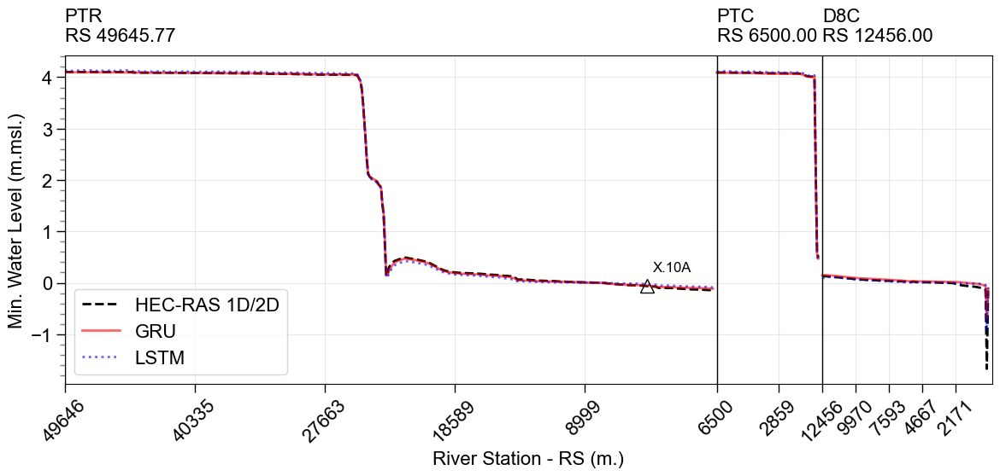

In [332]:
import numpy as np
import matplotlib.pyplot as plt

# Define custom font sizes
font_size_axis_labels = 16
font_size_ticks = 16
font_size_legend = 16
font_size_annotations = 16

# Get unique river names to categorize the data
rivers = geom_df['River'].unique()

# Define mapping for renaming river names
river_name_mapping = {
    "PATTANI_RIVER": "PTR",
    "canal1": "PTC",
    "D8": "D8C"
}

# Initialize lists to store categorized data
all_min_actual = []  # Store min actual water level values
index_mapping = []  # Store the mapping of RS values to new indices
xtick_labels = []  # Store labels for x-axis
xtick_positions = []  # Store positions of x-ticks
river_labels = []  # Store river names for annotations

# Generate a continuous temporary index for plotting
temp_index = 0

# Store separate segments to avoid linking between rivers
segments = []

for river in rivers:
    mask = geom_df['River'] == river
    rs_values = geom_df.loc[mask, 'RS'].values  # Use RS as X-axis
    indices = np.where(mask)[0]  # Get corresponding indices

    if len(indices) == 0:
        continue  # Skip empty rivers

    # Extract min values
    min_actual = all_actual[:, indices].min(axis=0)
    min_predict_GRU = all_predict_GRU[:, indices].min(axis=0)
    min_predict_LSTM = all_predict_LSTM[:, indices].min(axis=0)

    # Store min actual values in the list
    all_min_actual.extend(min_actual)

    # Store index mapping for this river
    index_range = range(temp_index, temp_index + len(rs_values))
    segments.append((index_range, min_actual, min_predict_GRU, min_predict_LSTM))

    # Store x-ticks (choosing every Nth RS for readability)
    step = max(1, len(rs_values) // 5)  # Adjust step size for better visibility
    xtick_labels.extend([f"{rs:.0f}" for rs in rs_values[::step]])
    xtick_positions.extend(list(index_range)[::step])

    # Rename river name if found in mapping
    new_river_name = river_name_mapping.get(river, river)

    # Store river name and RS for annotation
    river_labels.append((temp_index, rs_values[0], new_river_name))

    # Insert a larger gap if the river is "canal1" (PTC)
    if new_river_name == "PTC":
        temp_index += len(rs_values) + 2  # Extend gap
    else:
        temp_index += len(rs_values) + 2  # Normal gap

# Convert all_min_actual to numpy array
all_min_actual = np.array(all_min_actual)

# Plot the data using the temporary index
plt.figure(figsize=(14, 5))

# Plot each segment separately to avoid linking between different rivers
for index_range, min_actual, min_predict_GRU, min_predict_LSTM in segments:
    plt.plot(index_range, min_actual, linestyle='--', color='black', lw=2, alpha=1, label='HEC-RAS 1D/2D')
    plt.plot(index_range, min_predict_GRU, linestyle='-', color='red', lw=2, alpha=0.6, label='GRU')
    plt.plot(index_range, min_predict_LSTM, linestyle=':', color='blue', lw=2, alpha=0.6, label='LSTM')

# Add vertical lines and annotations for each river section
for idx, rs_start, river in river_labels:
    plt.axvline(x=idx, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
    plt.text(idx, 4.7, f"{river}\nRS {rs_start:.2f}",
             ha='left', fontsize=font_size_annotations, rotation=360)

# Ensure index 453 exists before plotting marker
if 453 < len(all_min_actual):
    plt.plot(453, all_min_actual[453], marker='^', markersize=12,
             color='black', markeredgecolor='black', fillstyle='none')
    plt.annotate("X.10A", (453, all_min_actual[453]),
                 xytext=(5,10), textcoords="offset points",  # Offset position for better readability
                 fontsize=12, color='black', ha='left', va='bottom')

# Formatting with custom font sizes
plt.xlabel('River Station - RS (m.)', fontsize=font_size_axis_labels)
plt.ylabel('Min. Water Level (m.msl.)', fontsize=font_size_axis_labels)
plt.grid(True, color='lightgray', alpha=0.5)
plt.minorticks_on()
plt.tick_params(which='both', width=1, labelsize=font_size_ticks)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

# Remove duplicate legend entries
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))

# Customize legend font size
plt.legend(by_label.values(), by_label.keys(),
           loc='lower left', fontsize=font_size_legend)

# Remove NaN labels from x-ticks
filtered_xticks = [(pos, label) for pos, label in zip(xtick_positions, xtick_labels) if label.lower() != 'nan']
xtick_positions, xtick_labels = zip(*filtered_xticks) if filtered_xticks else ([], [])

# Adjust x-axis labels to show RS values with custom font size
plt.xlim(0, temp_index)
plt.xticks(xtick_positions, xtick_labels, rotation=45, fontsize=font_size_ticks)
plt.tick_params(axis='x', which='minor', bottom=False, top=False)

# Show plot
plt.show()


In [333]:
# Filter the DataFrame to only contain rows for 'PATTANI_RIVER'
pattani_df = geom_df.loc[geom_df['River'] == 'D8'].index
pattani_df
rmse_GRU[346:475]

array([0.13162827, 0.13211897, 0.08687371, 0.08701426, 0.0866586 ,
       0.08626112, 0.08578282, 0.08534771, 0.08482391, 0.08429004,
       0.08391891, 0.08353294, 0.08303711, 0.08267145, 0.08233374,
       0.0816703 , 0.08118543, 0.08055783, 0.08010596, 0.07975539,
       0.07914073, 0.07874187, 0.07833822, 0.07794946, 0.07729612,
       0.07697472, 0.07636227, 0.07326231, 0.07497504, 0.07464447,
       0.07428542, 0.07404666, 0.07357998, 0.07320239, 0.07290676,
       0.07260347, 0.07242115, 0.07176899, 0.07124512, 0.07092619,
       0.07061696, 0.07033193, 0.07010006, 0.06962581, 0.06923823,
       0.06867436, 0.06826795, 0.06796116, 0.06747521, 0.06697717,
       0.06663043, 0.06608577, 0.06570444, 0.06515428, 0.06483075,
       0.0644908 , 0.06401748, 0.06368899, 0.06361113, 0.06311257,
       0.06239919, 0.06229186, 0.06195075, 0.06145736, 0.06073753,
       0.06066434, 0.0602139 , 0.05972284, 0.05934247, 0.05904028,
       0.05872183, 0.05840661, 0.05783556, 0.05667083, 0.05665

In [334]:
geom_shp

,id,FID,area,perimeter,RMSE,FID_2,Count,Length,River,Reach,...,Ice Fric_1,Ice Poro_1,Ice K1_2,Ice Max _1,Ice Cohe_1,Stationi_1,Cutline _1,geometry,RMSE_GRU,RMSE_LSTM
0,0,0,7399.94,343.57,0.37,0,4,88.04,PATTANI_RIVER,Reach 5,...,NaN,NaN,NaN,NaN,NaN,0.00,1.02,"POLYGON ((752720.659 738403.408, 752693.057 73...",0.15,0.12
1,1,1,7377.86,343.81,0.37,1,7,88.14,PATTANI_RIVER,Reach 5,...,NaN,NaN,NaN,NaN,NaN,0.00,1.00,"POLYGON ((752665.454 738465.104, 752610.249 73...",0.15,0.12
2,2,2,7398.80,344.14,0.37,2,7,88.29,PATTANI_RIVER,Reach 5,...,NaN,NaN,NaN,NaN,NaN,0.00,1.00,"POLYGON ((752610.249 738526.8, 752555.044 7385...",0.15,0.12
3,3,3,7427.17,344.54,0.37,3,7,88.48,PATTANI_RIVER,Reach 5,...,NaN,NaN,NaN,NaN,NaN,0.00,1.00,"POLYGON ((752555.044 738588.497, 752499.839 73...",0.15,0.12
4,4,4,7474.27,345.03,0.37,4,7,88.70,PATTANI_RIVER,Reach 5,...,NaN,NaN,NaN,NaN,NaN,0.00,1.03,"POLYGON ((752499.839 738650.193, 752487.967 73...",0.15,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
710,704,704,28416.73,837.16,1.42,704,5,255.63,PATTANI_RIVER,Reach 3,...,NaN,NaN,NaN,NaN,NaN,0.00,1.00,"POLYGON ((748115.447 763218.739, 748105.597 76...",0.06,0.06
711,705,705,30633.94,865.87,1.53,705,5,267.55,PATTANI_RIVER,Reach 3,...,NaN,NaN,NaN,NaN,NaN,0.00,1.00,"POLYGON ((748052.072 763297.916, 748011.172 76...",0.07,0.06
712,706,706,29668.96,863.32,1.48,706,5,275.51,PATTANI_RIVER,Reach 3,...,NaN,NaN,NaN,NaN,NaN,0.00,1.00,"POLYGON ((747998.651 763371.535, 747939.263 76...",0.07,0.06
713,707,707,30211.76,866.54,1.51,707,5,320.88,PATTANI_RIVER,Reach 3,...,NaN,NaN,NaN,NaN,NaN,0.00,1.00,"POLYGON ((747939.263 763452.548, 747893.746 76...",0.07,0.07


In [335]:
import geopandas as gpd
import numpy as np

# Load shapefile
shp_path = 'HEC-RAS1D-Geometry_rev2.shp'
geom_shp = gpd.read_file(shp_path)

# Sort by FID_3 before adding RMSE
geom_shp = geom_shp.sort_values(by='FID_3').reset_index(drop=True)

# Add RMSE columns (assumes rmse_GRU and rmse_LSTM are already sorted accordingly)
geom_shp['RMSE_GRU'] = rmse_GRU
geom_shp['RMSE_LSTM'] = rmse_LSTM

# Save to a new shapefile
output_path = 'HEC-RAS1D-Geometry_with_RMSE_rev2.shp'
geom_shp.to_file(output_path)


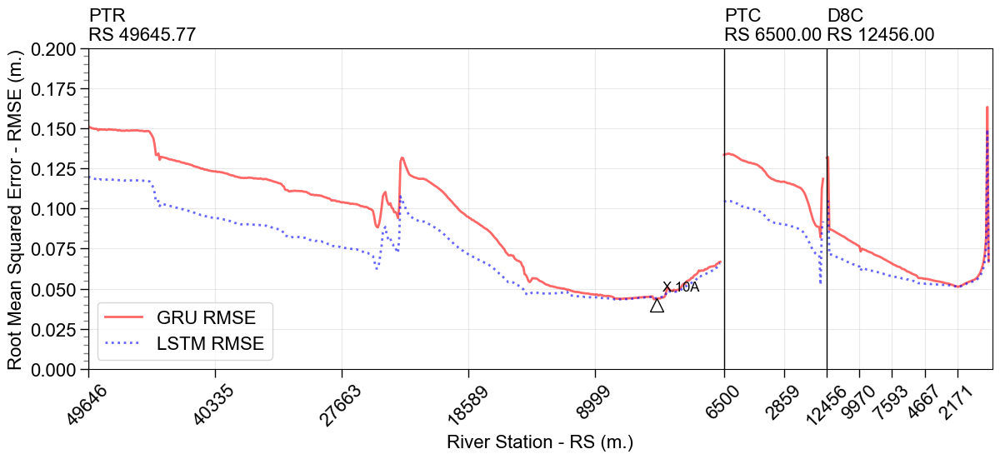

In [336]:
import numpy as np
import matplotlib.pyplot as plt

# Define custom font sizes
font_size_axis_labels = 16
font_size_ticks = 16
font_size_legend = 16
font_size_annotations = 16

# Get unique river names to categorize the data
rivers = geom_df['River'].unique()

# Define mapping for renaming river names
river_name_mapping = {
    "PATTANI_RIVER": "PTR",
    "canal1": "PTC",
    "D8": "D8C"
}

# Calculate RMSE for each station along the river
rmse_GRU = np.sqrt(np.mean((all_actual - all_predict_GRU) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((all_actual - all_predict_LSTM) ** 2, axis=0))

# Initialize lists for plotting
all_rmse_GRU = []
all_rmse_LSTM = []
index_mapping = []
xtick_labels = []
xtick_positions = []
river_labels = []

# Generate a continuous temporary index for plotting
temp_index = 0

# Store separate segments to avoid linking between rivers
segments = []

for river in rivers:
    mask = geom_df['River'] == river
    rs_values = geom_df.loc[mask, 'RS'].values  # Use RS as X-axis
    indices = np.where(mask)[0]  # Get corresponding indices

    if len(indices) == 0:
        continue  # Skip empty rivers

    # Extract RMSE values for the current river
    rmse_values_GRU = rmse_GRU[indices]
    rmse_values_LSTM = rmse_LSTM[indices]

    # Store RMSE values in the list
    all_rmse_GRU.extend(rmse_values_GRU)
    all_rmse_LSTM.extend(rmse_values_LSTM)

    # Store index mapping for this river
    index_range = range(temp_index, temp_index + len(rs_values))
    segments.append((index_range, rmse_values_GRU, rmse_values_LSTM))

    # Store x-ticks (choosing every Nth RS for readability)
    step = max(1, len(rs_values) // 5)  # Adjust step size for better visibility
    xtick_labels.extend([f"{rs:.0f}" for rs in rs_values[::step]])
    xtick_positions.extend(list(index_range)[::step])

    # Rename river name if found in mapping
    new_river_name = river_name_mapping.get(river, river)

    # Store river name and RS for annotation
    river_labels.append((temp_index, rs_values[0], new_river_name))

    # Insert a larger gap if the river is "canal1" (PTC)
    if new_river_name == "PTC":
        temp_index += len(rs_values) + 2  # Extend gap
    else:
        temp_index += len(rs_values) + 2  # Normal gap

# Convert all RMSE values to numpy arrays
all_rmse_GRU = np.array(all_rmse_GRU)
all_rmse_LSTM = np.array(all_rmse_LSTM)

# Plot the data using the temporary index
plt.figure(figsize=(14, 5))

# Plot each segment separately to avoid linking between different rivers
for index_range, rmse_values_GRU, rmse_values_LSTM in segments:
    plt.plot(index_range, rmse_values_GRU, linestyle='-', color='red', lw=2, alpha=0.6, label='GRU RMSE')
    plt.plot(index_range, rmse_values_LSTM, linestyle=':', color='blue', lw=2, alpha=0.6, label='LSTM RMSE')

# Add vertical lines and annotations for each river section
for idx, rs_start, river in river_labels:
    plt.axvline(x=idx, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
    plt.text(idx, 0.205, f"{river}\nRS {rs_start:.2f}",
             ha='left', fontsize=font_size_annotations, rotation=360)


plt.plot(453, 0.04, marker='^', markersize=12,
         color='black', markeredgecolor='black', fillstyle='none')
plt.annotate("X.10A", (453, 0.04),
             xytext=(5,10), textcoords="offset points",  # Offset position for better readability
             fontsize=12, color='black', ha='left', va='bottom')
# Formatting with custom font sizes
plt.xlabel('River Station - RS (m.)', fontsize=font_size_axis_labels)
plt.ylabel('Root Mean Squared Error - RMSE (m.)', fontsize=font_size_axis_labels)
plt.grid(True, color='lightgray', alpha=0.5)
plt.minorticks_on()
plt.tick_params(which='both', width=1, labelsize=font_size_ticks)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

# Remove duplicate legend entries
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))

# Customize legend font size
plt.legend(by_label.values(), by_label.keys(),
           loc='lower left', fontsize=font_size_legend)

# Remove NaN labels from x-ticks
filtered_xticks = [(pos, label) for pos, label in zip(xtick_positions, xtick_labels) if label.lower() != 'nan']
xtick_positions, xtick_labels = zip(*filtered_xticks) if filtered_xticks else ([], [])

# Adjust x-axis labels to show RS values with custom font size
plt.xlim(0, temp_index)
plt.ylim(0, 0.2)
plt.xticks(xtick_positions, xtick_labels, rotation=45, fontsize=font_size_ticks)
plt.tick_params(axis='x', which='minor', bottom=False, top=False)

# Show plot
plt.show()


In [337]:
rmse_GRU

array([0.15127812, 0.15070569, 0.15056076, 0.15004122, 0.14998316,
       0.14969667, 0.14974837, 0.14959397, 0.14878021, 0.14948973,
       0.14934912, 0.14934267, 0.14921303, 0.14937583, 0.14913626,
       0.14904541, 0.14937057, 0.1494601 , 0.14922283, 0.14926971,
       0.14909742, 0.14912472, 0.1491393 , 0.14885004, 0.14872474,
       0.14898072, 0.14858794, 0.14853746, 0.14858677, 0.14846948,
       0.14873641, 0.14875077, 0.14855441, 0.14856118, 0.14874089,
       0.14870798, 0.14880496, 0.14874547, 0.14876892, 0.14879864,
       0.14871133, 0.1484973 , 0.14847588, 0.14856488, 0.14825192,
       0.14817958, 0.14835257, 0.14826812, 0.14839095, 0.14785169,
       0.14664301, 0.14531865, 0.14372296, 0.13971924, 0.13342442,
       0.13357625, 0.13375946, 0.13399595, 0.13415121, 0.13425991,
       0.13393442, 0.13366468, 0.13367394, 0.13323279, 0.13280369,
       0.13234755, 0.13181815, 0.13138155, 0.13072687, 0.13035615,
       0.12986326, 0.12988587, 0.12943677, 0.12931107, 0.12886

In [338]:
all_rmse_GRU.shape

(715,)

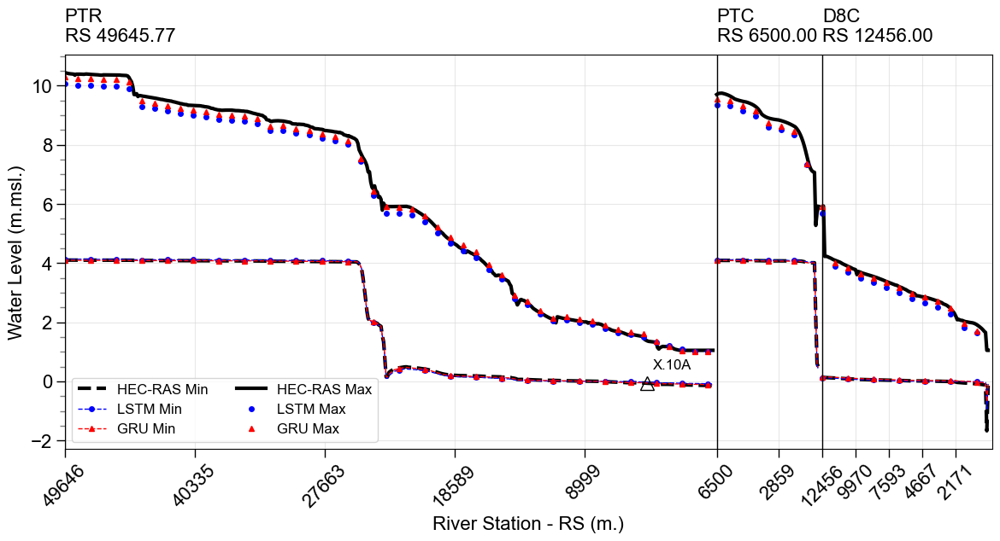

In [339]:
import numpy as np
import matplotlib.pyplot as plt

# Define custom font sizes
font_size_axis_labels = 16
font_size_ticks = 16
font_size_legend = 12
font_size_annotations = 16

# Initialize lists to store categorized data for GRU, LSTM, and Actual
all_min_actual, all_max_actual, all_mean_actual = [], [], []
all_min_GRU, all_max_GRU, all_mean_GRU = [], [], []
all_min_LSTM, all_max_LSTM, all_mean_LSTM = [], [], []
index_mapping, xtick_labels, xtick_positions, river_labels = [], [], [], []

# Generate a continuous temporary index for plotting
temp_index = 0

# Store separate segments to avoid linking between rivers
segments = []

for river in rivers:
    mask = geom_df['River'] == river
    rs_values = geom_df.loc[mask, 'RS'].values  # Use RS as X-axis
    indices = np.where(mask)[0]  # Get corresponding indices

    if len(indices) == 0:
        continue  # Skip empty rivers

    # Extract min, max, and mean values for actual, GRU, and LSTM
    min_actual, max_actual, mean_actual = all_actual[:, indices].min(axis=0), all_actual[:, indices].max(axis=0), all_actual[:, indices].mean(axis=0)
    min_GRU, max_GRU, mean_GRU = all_predict_GRU[:, indices].min(axis=0), all_predict_GRU[:, indices].max(axis=0), all_predict_GRU[:, indices].mean(axis=0)
    min_LSTM, max_LSTM, mean_LSTM = all_predict_LSTM[:, indices].min(axis=0), all_predict_LSTM[:, indices].max(axis=0), all_predict_LSTM[:, indices].mean(axis=0)

    # Store values in lists
    all_min_actual.extend(min_actual), all_max_actual.extend(max_actual), all_mean_actual.extend(mean_actual)
    all_min_GRU.extend(min_GRU), all_max_GRU.extend(max_GRU), all_mean_GRU.extend(mean_GRU)
    all_min_LSTM.extend(min_LSTM), all_max_LSTM.extend(max_LSTM), all_mean_LSTM.extend(mean_LSTM)

    # Store index mapping for this river
    index_range = range(temp_index, temp_index + len(rs_values))
    segments.append((index_range, min_actual, max_actual, mean_actual, min_GRU, max_GRU, mean_GRU, min_LSTM, max_LSTM, mean_LSTM))

    # Store x-ticks (choosing every Nth RS for readability)
    step = max(1, len(rs_values) // 5)  # Adjust step size for better visibility
    xtick_labels.extend([f"{rs:.0f}" for rs in rs_values[::step]])
    xtick_positions.extend(list(index_range)[::step])

    # Rename river name if found in mapping
    new_river_name = river_name_mapping.get(river, river)

    # Store river name and RS for annotation
    river_labels.append((temp_index, rs_values[0], new_river_name))

    # Insert a larger gap if the river is "canal1" (PTC)
    temp_index += len(rs_values) + (2 if new_river_name == "PTC" else 2)

# Convert lists to numpy arrays
all_min_actual, all_max_actual, all_mean_actual = np.array(all_min_actual), np.array(all_max_actual), np.array(all_mean_actual)
all_min_GRU, all_max_GRU, all_mean_GRU = np.array(all_min_GRU), np.array(all_max_GRU), np.array(all_mean_GRU)
all_min_LSTM, all_max_LSTM, all_mean_LSTM = np.array(all_min_LSTM), np.array(all_max_LSTM), np.array(all_mean_LSTM)

# Define line styles and markers for differentiation
styles = {
    "Actual": {"color": "black", "linestyle": "-", "marker": "o"},
    "GRU": {"color": "red", "linestyle": "--", "marker": "s"},
    "LSTM": {"color": "blue", "linestyle": ":", "marker": "d"}
}

# Plot the data using the temporary index
plt.figure(figsize=(14, 6))
ms = 4
# Plot each segment separately to avoid linking between different rivers
for index_range, min_actual, max_actual, mean_actual, min_GRU, max_GRU, mean_GRU, min_LSTM, max_LSTM, mean_LSTM in segments:
    plt.plot(index_range, min_actual , linestyle='--', color='k', lw=3,ms=ms ,marker='',markevery=20, alpha=1, label='HEC-RAS Min')
    plt.plot(index_range, min_LSTM , linestyle='--', color='b', lw=1,ms=ms, marker='o',markevery=20, alpha=1, label='LSTM Min')
    plt.plot(index_range, min_GRU , linestyle='--', color='r', lw=1,ms=ms, marker='^',markevery=20, alpha=1, label='GRU Min')
   
    plt.plot(index_range, max_actual , linestyle='-', color='k', lw=3,ms=ms, marker='',markevery=10, alpha=1, label='HEC-RAS Max')
    plt.plot(index_range, max_LSTM , linestyle='', color='b', lw=1,ms=ms, marker='o',markevery=10, alpha=1, label='LSTM Max')
    plt.plot(index_range, max_GRU , linestyle='', color='r', lw=1,ms=ms, marker='^',markevery=10, alpha=1, label='GRU Max')
    
    # plt.plot(index_range, mean_GRU, linestyle='--', color='r', lw=1,ms=ms, marker='o',markevery=20, alpha=0.7, label='GRU Mean')

    # plt.plot(index_range, mean_LSTM, linestyle='--', color='b', lw=1,ms=ms, marker='o',markevery=20, alpha=0.7, label='LSTM Mean')

# plt.plot(index_range, mean_actual, linestyle='--', color='k', lw=2,ms=ms, marker='',markevery=20, alpha=0.7, label='HEC-RAS Mean')



# Add vertical lines and annotations for each river section
for idx, rs_start, river in river_labels:
    plt.axvline(x=idx, color='k', linestyle='-', lw=1, alpha=1, zorder=99)
    plt.text(idx, max(all_max_actual) * 1.1, f"{river}\nRS {rs_start:.2f}",
             ha='left', fontsize=font_size_annotations, rotation=360)

# Ensure index 453 exists before plotting marker
if 453 < len(all_min_actual):
    plt.plot(453, all_min_actual[453], marker='^', markersize=12,
             color='black', markeredgecolor='black', fillstyle='none')
    plt.annotate("X.10A", (453, all_min_actual[453]),
                 xytext=(5,10), textcoords="offset points",
                 fontsize=12, color='black', ha='left', va='bottom')

# Formatting with custom font sizes
plt.xlabel('River Station - RS (m.)', fontsize=font_size_axis_labels)
plt.ylabel('Water Level (m.msl.)', fontsize=font_size_axis_labels)
plt.grid(True, color='lightgray', alpha=0.5)
plt.minorticks_on()
plt.tick_params(which='both', width=1, labelsize=font_size_ticks)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

# Remove duplicate legend entries
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))

# Customize legend font size
plt.legend(by_label.values(), by_label.keys(),
           loc='best', fontsize=font_size_legend, ncol=2)

# Remove NaN labels from x-ticks
filtered_xticks = [(pos, label) for pos, label in zip(xtick_positions, xtick_labels) if label.lower() != 'nan']
xtick_positions, xtick_labels = zip(*filtered_xticks) if filtered_xticks else ([], [])

# Adjust x-axis labels to show RS values with custom font size
plt.xlim(0, temp_index)
plt.xticks(xtick_positions, xtick_labels, rotation=45, fontsize=font_size_ticks)
plt.tick_params(axis='x', which='minor', bottom=False, top=False)

# Show plot
plt.show()




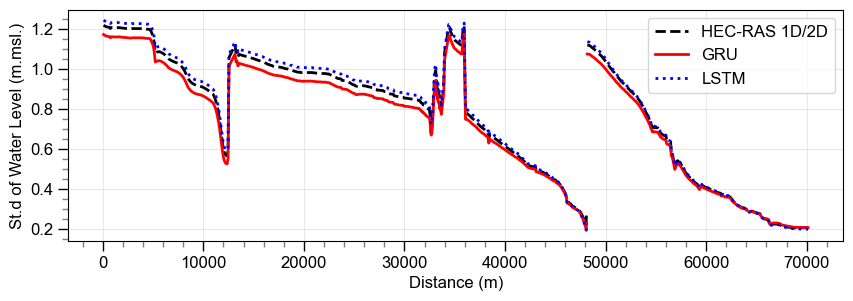

In [340]:
# Extract the standard deviation values across all timesteps for each cross-section
std_actual = all_actual[:, selected_indices].std(axis=0)
std_predict_GRU = all_predict_GRU[:, selected_indices].std(axis=0)
std_predict_LSTM = all_predict_LSTM[:, selected_indices].std(axis=0)

# Convert geom_df['RS'] to numeric
# geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df['STA'].values

# Plot the data
plt.figure(figsize=(10, 3))

# Plot standard deviation values
plt.plot(distances, std_actual, label='HEC-RAS 1D/2D', linestyle='--', color='black',lw=2, alpha=1)
plt.plot(distances, std_predict_GRU, label='GRU', linestyle='-', color='red',lw=2, alpha=1)
plt.plot(distances, std_predict_LSTM, label='LSTM', linestyle=':', color='blue',lw=2, alpha=1)

plt.xlabel('Distance (m)')
plt.ylabel('St.d of Water Level (m.msl.)')
# plt.title('Observed vs Predicted Water Levels by Distance')

# Add minor ticks
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.legend()
plt.grid(True, color='lightgray', alpha=0.5)
plt.show()

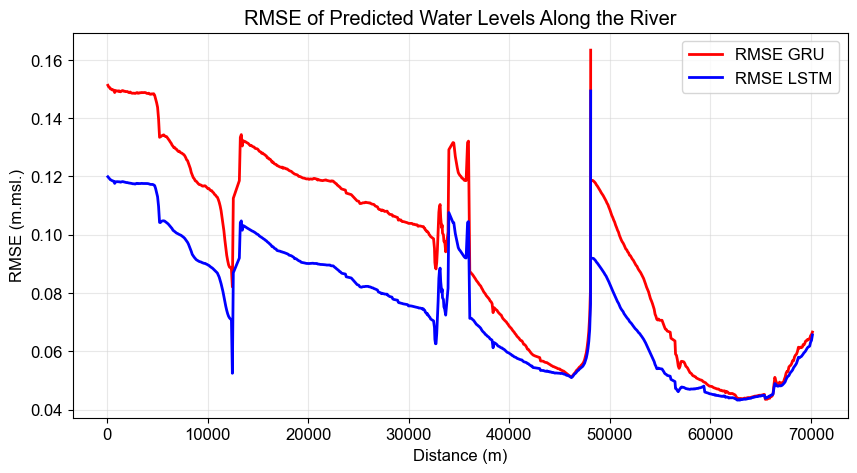

In [341]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Extract the max values across all timesteps for each cross-section
max_actual = all_actual[:, selected_indices].max(axis=0)
max_predict_GRU = all_predict_GRU[:, selected_indices].max(axis=0)
max_predict_LSTM = all_predict_LSTM[:, selected_indices].max(axis=0)

# Calculate RMSE for each cross-section across time
rmse_GRU = np.sqrt(np.mean((all_actual[:, selected_indices] - all_predict_GRU[:, selected_indices]) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((all_actual[:, selected_indices] - all_predict_LSTM[:, selected_indices]) ** 2, axis=0))

# Convert geom_df['RS'] to numeric
geom_df['RS'] = pd.to_numeric(geom_df['RS'], errors='coerce')

# Extract the corresponding distances from geom_df
distances = geom_df.iloc[selected_indices]['STA'].values  # Ensuring distances align with 715 values

# Create DataFrame for RMSE values
df_rmse = pd.DataFrame({'Distance': distances, 'RMSE_GRU': rmse_GRU, 'RMSE_LSTM': rmse_LSTM})

# Plot the RMSE along the river
plt.figure(figsize=(10, 5))
plt.plot(df_rmse['Distance'], df_rmse['RMSE_GRU'], label='RMSE GRU', linestyle='-', color='red', lw=2, alpha=1)
plt.plot(df_rmse['Distance'], df_rmse['RMSE_LSTM'], label='RMSE LSTM', linestyle='-', color='blue', lw=2, alpha=1)

plt.xlabel('Distance (m)')
plt.ylabel('RMSE (m.msl.)')
plt.title('RMSE of Predicted Water Levels Along the River')
plt.legend()
plt.grid(True, color='lightgray', alpha=0.5)
plt.show()



In [342]:
all_predict_GRU.shape

(3073, 715)

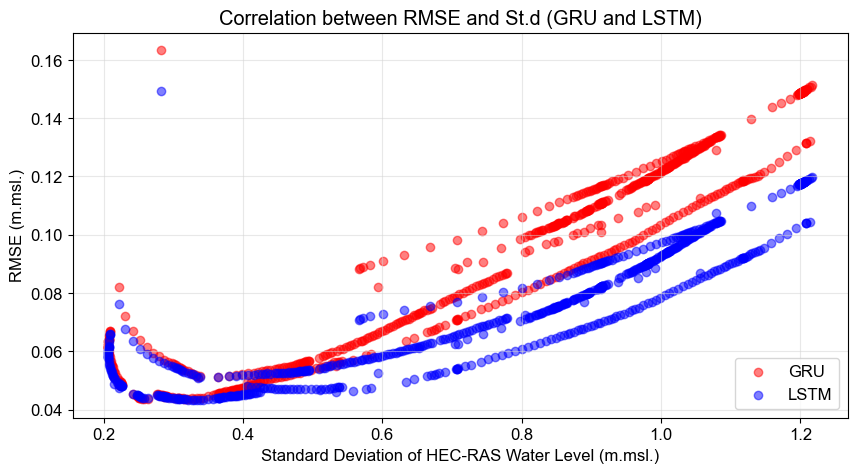

In [343]:
import numpy as np
import matplotlib.pyplot as plt

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'


# Extract the actual and predicted values for the selected indices
actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Calculate standard deviation for the actual values (HEC-RAS)
std_actual = actual_values.std(axis=0)

# Plot the correlation between RMSE and standard deviation of HEC-RAS
plt.figure(figsize=(10, 5))

# Scatter plot for GRU and LSTM in one graph
plt.scatter(std_actual, rmse_GRU, color='red', alpha=0.5, label='GRU')
plt.scatter(std_actual, rmse_LSTM, color='blue', alpha=0.5, label='LSTM')

plt.xlabel('Standard Deviation of HEC-RAS Water Level (m.msl.)')
plt.ylabel('RMSE (m.msl.)')
plt.title('Correlation between RMSE and St.d (GRU and LSTM)')
plt.grid(True, color='lightgray', alpha=0.5)
plt.legend()

plt.show()

<Figure size 1000x500 with 0 Axes>

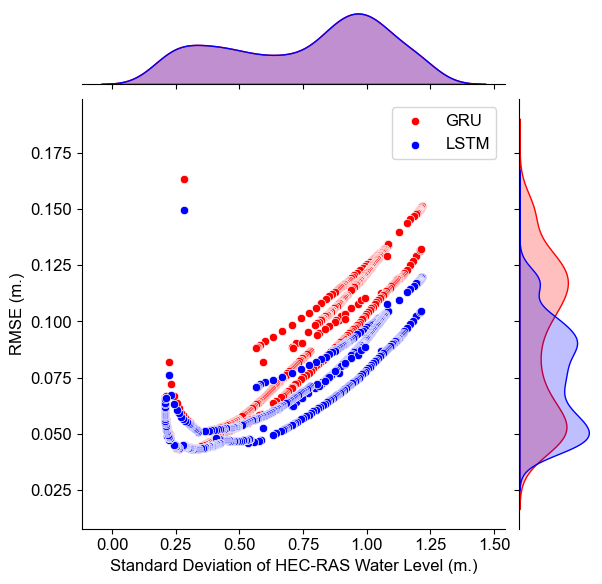

In [344]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'

actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Calculate standard deviation for the actual values (HEC-RAS)
std_actual = actual_values.std(axis=0)

# Create a DataFrame for plotting
df = pd.DataFrame({
    'Standard Deviation': std_actual,
    'RMSE_GRU': rmse_GRU,
    'RMSE_LSTM': rmse_LSTM
})

# Plot the correlation between RMSE and standard deviation of HEC-RAS using Seaborn JointGrid
plt.figure(figsize=(10, 5))

# Create a JointGrid
grid = sns.JointGrid(x='Standard Deviation', y='RMSE_GRU', data=df)

# Plot the scatter plot for GRU
grid.plot_joint(sns.scatterplot, color='red', label='GRU')
sns.kdeplot(x=df['Standard Deviation'], ax=grid.ax_marg_x, color='red', fill=True)
sns.kdeplot(y=df['RMSE_GRU'], ax=grid.ax_marg_y, color='red', fill=True)

# Plot the scatter plot for LSTM
sns.scatterplot(x='Standard Deviation', y='RMSE_LSTM', data=df, ax=grid.ax_joint, color='blue', label='LSTM')
sns.kdeplot(x=df['Standard Deviation'], ax=grid.ax_marg_x, color='blue', fill=True)
sns.kdeplot(y=df['RMSE_LSTM'], ax=grid.ax_marg_y, color='blue', fill=True)

# Set labels and title
grid.set_axis_labels('Standard Deviation of HEC-RAS Water Level (m.)', 'RMSE (m.)')
# plt.suptitle('Correlation between RMSE and St.d (GRU and LSTM)', y=1.02)

# Manually add legend
handles, labels = grid.ax_joint.get_legend_handles_labels()
grid.ax_joint.legend(handles, labels)

plt.show()

<Figure size 1000x500 with 0 Axes>

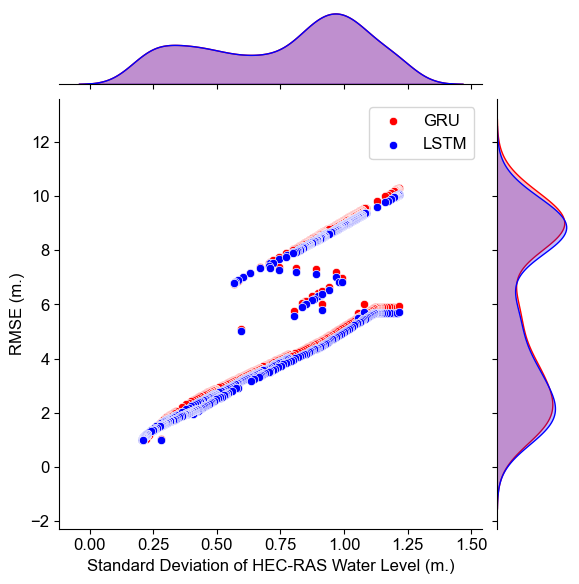

In [345]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'

actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.max(predict_GRU_values, axis=0)
rmse_LSTM = np.max(predict_LSTM_values, axis=0)

# Calculate standard deviation for the actual values (HEC-RAS)
std_actual = actual_values.std(axis=0)

# Create a DataFrame for plotting
df = pd.DataFrame({
    'Standard Deviation': std_actual,
    'RMSE_GRU': rmse_GRU,
    'RMSE_LSTM': rmse_LSTM
})

# Plot the correlation between RMSE and standard deviation of HEC-RAS using Seaborn JointGrid
plt.figure(figsize=(10, 5))

# Create a JointGrid
grid = sns.JointGrid(x='Standard Deviation', y='RMSE_GRU', data=df)

# Plot the scatter plot for GRU
grid.plot_joint(sns.scatterplot, color='red', label='GRU')
sns.kdeplot(x=df['Standard Deviation'], ax=grid.ax_marg_x, color='red', fill=True)
sns.kdeplot(y=df['RMSE_GRU'], ax=grid.ax_marg_y, color='red', fill=True)

# Plot the scatter plot for LSTM
sns.scatterplot(x='Standard Deviation', y='RMSE_LSTM', data=df, ax=grid.ax_joint, color='blue', label='LSTM')
sns.kdeplot(x=df['Standard Deviation'], ax=grid.ax_marg_x, color='blue', fill=True)
sns.kdeplot(y=df['RMSE_LSTM'], ax=grid.ax_marg_y, color='blue', fill=True)

# Set labels and title
grid.set_axis_labels('Standard Deviation of HEC-RAS Water Level (m.)', 'RMSE (m.)')
# plt.suptitle('Correlation between RMSE and St.d (GRU and LSTM)', y=1.02)

# Manually add legend
handles, labels = grid.ax_joint.get_legend_handles_labels()
grid.ax_joint.legend(handles, labels)

plt.show()

<Figure size 1000x500 with 0 Axes>

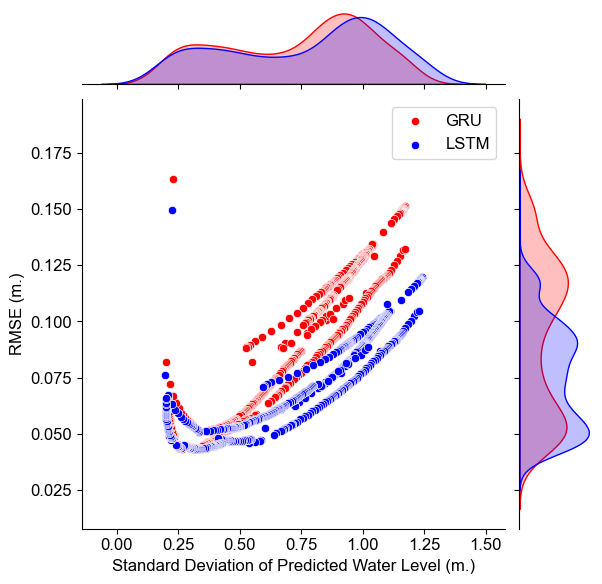

In [346]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'

actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Calculate standard deviation for the predicted values (GRU and LSTM)
std_predict_GRU = predict_GRU_values.std(axis=0)
std_predict_LSTM = predict_LSTM_values.std(axis=0)

# Create a DataFrame for plotting
df = pd.DataFrame({
    'Standard Deviation GRU': std_predict_GRU,
    'Standard Deviation LSTM': std_predict_LSTM,
    'RMSE_GRU': rmse_GRU,
    'RMSE_LSTM': rmse_LSTM
})

# Plot the correlation between RMSE and standard deviation of predicted values using Seaborn JointGrid
plt.figure(figsize=(10, 5))

# Create a JointGrid
grid = sns.JointGrid(x='Standard Deviation GRU', y='RMSE_GRU', data=df)

# Plot the scatter plot for GRU
grid.plot_joint(sns.scatterplot, color='red', label='GRU')
sns.kdeplot(x=df['Standard Deviation GRU'], ax=grid.ax_marg_x, color='red', fill=True)
sns.kdeplot(y=df['RMSE_GRU'], ax=grid.ax_marg_y, color='red', fill=True)

# Plot the scatter plot for LSTM
sns.scatterplot(x='Standard Deviation LSTM', y='RMSE_LSTM', data=df, ax=grid.ax_joint, color='blue', label='LSTM')
sns.kdeplot(x=df['Standard Deviation LSTM'], ax=grid.ax_marg_x, color='blue', fill=True)
sns.kdeplot(y=df['RMSE_LSTM'], ax=grid.ax_marg_y, color='blue', fill=True)

# Set labels and title
grid.set_axis_labels('Standard Deviation of Predicted Water Level (m.)', 'RMSE (m.)')
# plt.suptitle('Correlation between RMSE and St.d (GRU and LSTM)', y=1.02)

# Manually add legend
handles, labels = grid.ax_joint.get_legend_handles_labels()
grid.ax_joint.legend(handles, labels)

plt.show()

<Figure size 1000x500 with 0 Axes>

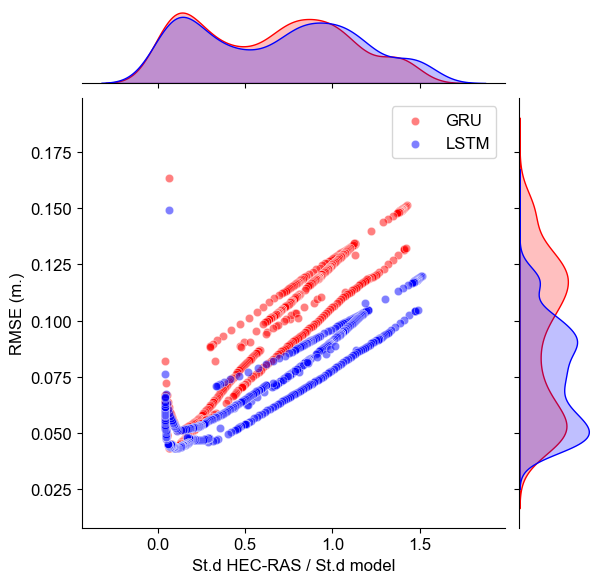

In [347]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'

actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Calculate standard deviation for the predicted values (GRU and LSTM)
std_actual = actual_values.std(axis=0)
std_predict_GRU = predict_GRU_values.std(axis=0) / (1 / std_actual)
std_predict_LSTM = predict_LSTM_values.std(axis=0) / (1 / std_actual)

# Create a DataFrame for plotting
df = pd.DataFrame({
    'Standard Deviation GRU': std_predict_GRU,
    'Standard Deviation LSTM': std_predict_LSTM,
    'Standard Deviation HEC-RAS': std_actual,
    'RMSE_GRU': rmse_GRU,
    'RMSE_LSTM': rmse_LSTM
})

# Plot the correlation between RMSE and standard deviation of predicted values using Seaborn JointGrid
plt.figure(figsize=(10, 5))

# Create a JointGrid
grid = sns.JointGrid(x='Standard Deviation GRU', y='RMSE_GRU', data=df)

# Plot the scatter plot for GRU
grid.plot_joint(sns.scatterplot, color='red', label='GRU', alpha=0.5)
sns.kdeplot(x=df['Standard Deviation GRU'], ax=grid.ax_marg_x, color='red', fill=True)
sns.kdeplot(y=df['RMSE_GRU'], ax=grid.ax_marg_y, color='red', fill=True)

# Plot the scatter plot for LSTM
sns.scatterplot(x='Standard Deviation LSTM', y='RMSE_LSTM', data=df, ax=grid.ax_joint, color='blue', label='LSTM', alpha=0.5)
sns.kdeplot(x=df['Standard Deviation LSTM'], ax=grid.ax_marg_x, color='blue', fill=True)
sns.kdeplot(y=df['RMSE_LSTM'], ax=grid.ax_marg_y, color='blue', fill=True)

# Set labels and title
grid.set_axis_labels('St.d HEC-RAS / St.d model', 'RMSE (m.)')
# plt.suptitle('Correlation between RMSE and St.d (GRU and LSTM)', y=1.02)

# Manually add legend
handles, labels = grid.ax_joint.get_legend_handles_labels()
grid.ax_joint.legend(handles, labels)

plt.show()

<Figure size 1000x500 with 0 Axes>

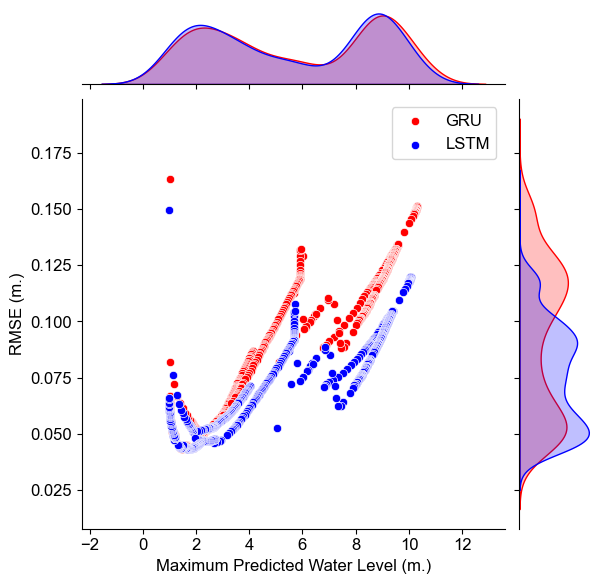

In [348]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'

actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Extract the maximum water levels for the predicted values (GRU and LSTM)
max_predict_GRU = predict_GRU_values.max(axis=0)
max_predict_LSTM = predict_LSTM_values.max(axis=0)

# Create a DataFrame for plotting
df = pd.DataFrame({
    'Max Water Level GRU': max_predict_GRU,
    'Max Water Level LSTM': max_predict_LSTM,
    'RMSE_GRU': rmse_GRU,
    'RMSE_LSTM': rmse_LSTM
})

# Plot the correlation between RMSE and maximum predicted water levels using Seaborn JointGrid
plt.figure(figsize=(10, 5))

# Create a JointGrid
grid = sns.JointGrid(x='Max Water Level GRU', y='RMSE_GRU', data=df)

# Plot the scatter plot for GRU
grid.plot_joint(sns.scatterplot, color='red', label='GRU')
sns.kdeplot(x=df['Max Water Level GRU'], ax=grid.ax_marg_x, color='red', fill=True)
sns.kdeplot(y=df['RMSE_GRU'], ax=grid.ax_marg_y, color='red', fill=True)

# Plot the scatter plot for LSTM
sns.scatterplot(x='Max Water Level LSTM', y='RMSE_LSTM', data=df, ax=grid.ax_joint, color='blue', label='LSTM')
sns.kdeplot(x=df['Max Water Level LSTM'], ax=grid.ax_marg_x, color='blue', fill=True)
sns.kdeplot(y=df['RMSE_LSTM'], ax=grid.ax_marg_y, color='blue', fill=True)

# Set labels and title
grid.set_axis_labels('Maximum Predicted Water Level (m.)', 'RMSE (m.)')

# plt.suptitle('Correlation between RMSE and Max Water Level (GRU and LSTM)', y=1.02)

# Manually add legend
handles, labels = grid.ax_joint.get_legend_handles_labels()
grid.ax_joint.legend(handles, labels)

plt.show()

<Figure size 1000x500 with 0 Axes>

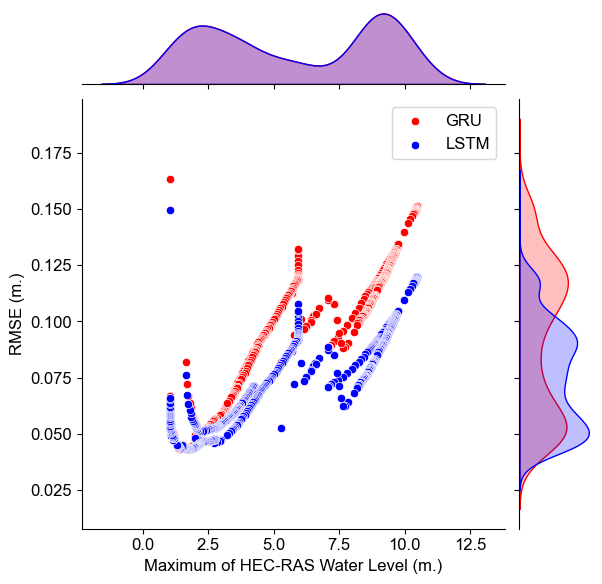

In [349]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'

actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Extract the maximum water levels for the actual values
max_actual = actual_values.max(axis=0)

# Create a DataFrame for plotting
df = pd.DataFrame({
    'Max Water Level Actual': max_actual,
    'RMSE_GRU': rmse_GRU,
    'RMSE_LSTM': rmse_LSTM
})

# Plot the correlation between RMSE and maximum actual water levels using Seaborn JointGrid
plt.figure(figsize=(10, 5))

# Create a JointGrid
grid = sns.JointGrid(x='Max Water Level Actual', y='RMSE_GRU', data=df)

# Plot the scatter plot for GRU
grid.plot_joint(sns.scatterplot, color='red', label='GRU')
sns.kdeplot(x=df['Max Water Level Actual'], ax=grid.ax_marg_x, color='red', fill=True)
sns.kdeplot(y=df['RMSE_GRU'], ax=grid.ax_marg_y, color='red', fill=True)

# Plot the scatter plot for LSTM
sns.scatterplot(x='Max Water Level Actual', y='RMSE_LSTM', data=df, ax=grid.ax_joint, color='blue', label='LSTM')
sns.kdeplot(x=df['Max Water Level Actual'], ax=grid.ax_marg_x, color='blue', fill=True)
sns.kdeplot(y=df['RMSE_LSTM'], ax=grid.ax_marg_y, color='blue', fill=True)

# Set labels and title
grid.set_axis_labels('Maximum of HEC-RAS Water Level (m.)', 'RMSE (m.)')
# plt.suptitle('Correlation between RMSE and Max Water Level (GRU and LSTM)', y=1.02)

# Manually add legend
handles, labels = grid.ax_joint.get_legend_handles_labels()
grid.ax_joint.legend(handles, labels)

plt.show()

<Figure size 1000x500 with 0 Axes>

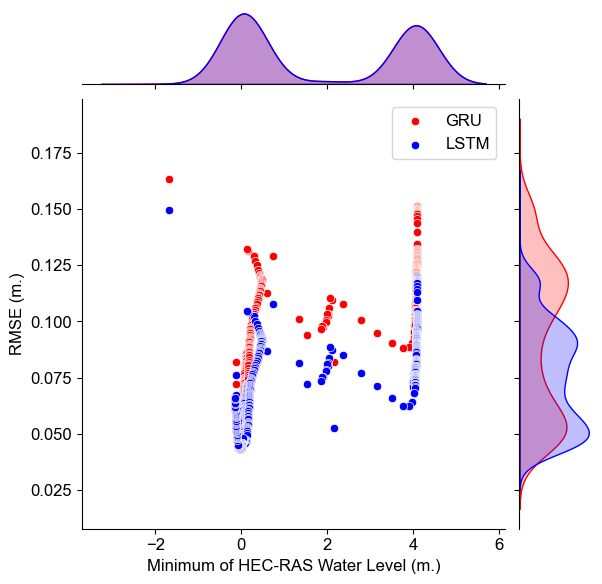

In [350]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'

actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Extract the minimum water levels for the actual values
min_actual = actual_values.min(axis=0)

# Create a DataFrame for plotting
df = pd.DataFrame({
    'Min Water Level Actual': min_actual,
    'RMSE_GRU': rmse_GRU,
    'RMSE_LSTM': rmse_LSTM
})

# Plot the correlation between RMSE and minimum actual water levels using Seaborn JointGrid
plt.figure(figsize=(10, 5))

# Create a JointGrid
grid = sns.JointGrid(x='Min Water Level Actual', y='RMSE_GRU', data=df)

# Plot the scatter plot for GRU
grid.plot_joint(sns.scatterplot, color='red', label='GRU')
sns.kdeplot(x=df['Min Water Level Actual'], ax=grid.ax_marg_x, color='red', fill=True)
sns.kdeplot(y=df['RMSE_GRU'], ax=grid.ax_marg_y, color='red', fill=True)

# Plot the scatter plot for LSTM
sns.scatterplot(x='Min Water Level Actual', y='RMSE_LSTM', data=df, ax=grid.ax_joint, color='blue', label='LSTM')
sns.kdeplot(x=df['Min Water Level Actual'], ax=grid.ax_marg_x, color='blue', fill=True)
sns.kdeplot(y=df['RMSE_LSTM'], ax=grid.ax_marg_y, color='blue', fill=True)

# Set labels and title
grid.set_axis_labels('Minimum of HEC-RAS Water Level (m.)', 'RMSE (m.)')
# plt.suptitle('Correlation between RMSE and Min Water Level (GRU and LSTM)', y=1.02)

# Manually add legend
handles, labels = grid.ax_joint.get_legend_handles_labels()
grid.ax_joint.legend(handles, labels)

plt.show()

<Figure size 1000x500 with 0 Axes>

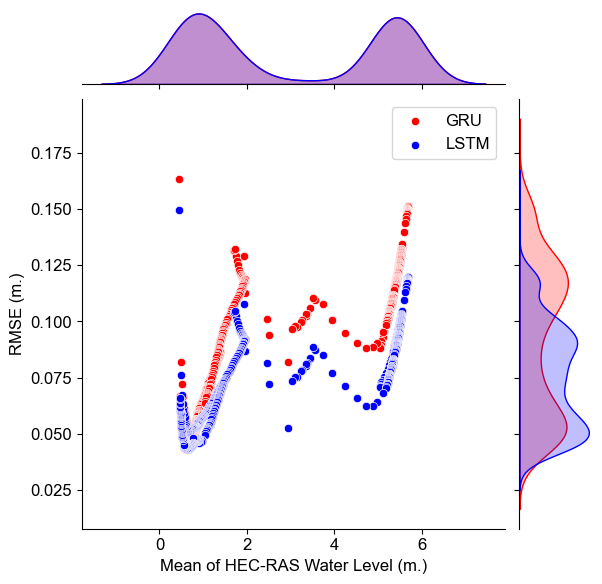

In [351]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Set the font to Arial
plt.rcParams['font.family'] = 'Arial'

actual_values = all_actual[:, selected_indices]
predict_GRU_values = all_predict_GRU[:, selected_indices]
predict_LSTM_values = all_predict_LSTM[:, selected_indices]

# Calculate RMSE for each cross-section
rmse_GRU = np.sqrt(np.mean((actual_values - predict_GRU_values) ** 2, axis=0))
rmse_LSTM = np.sqrt(np.mean((actual_values - predict_LSTM_values) ** 2, axis=0))

# Extract the mean water levels for the actual values
mean_actual = actual_values.mean(axis=0)

# Create a DataFrame for plotting
df = pd.DataFrame({
    'Mean Water Level Actual': mean_actual,
    'RMSE_GRU': rmse_GRU,
    'RMSE_LSTM': rmse_LSTM
})

# Plot the correlation between RMSE and mean actual water levels using Seaborn JointGrid
plt.figure(figsize=(10, 5))

# Create a JointGrid
grid = sns.JointGrid(x='Mean Water Level Actual', y='RMSE_GRU', data=df)

# Plot the scatter plot for GRU
grid.plot_joint(sns.scatterplot, color='red', label='GRU')
sns.kdeplot(x=df['Mean Water Level Actual'], ax=grid.ax_marg_x, color='red', fill=True)
sns.kdeplot(y=df['RMSE_GRU'], ax=grid.ax_marg_y, color='red', fill=True)

# Plot the scatter plot for LSTM
sns.scatterplot(x='Mean Water Level Actual', y='RMSE_LSTM', data=df, ax=grid.ax_joint, color='blue', label='LSTM')
sns.kdeplot(x=df['Mean Water Level Actual'], ax=grid.ax_marg_x, color='blue', fill=True)
sns.kdeplot(y=df['RMSE_LSTM'], ax=grid.ax_marg_y, color='blue', fill=True)

# Set labels and title
grid.set_axis_labels('Mean of HEC-RAS Water Level (m.)', 'RMSE (m.)')
# plt.suptitle('Correlation between RMSE and Mean Water Level (GRU and LSTM)', y=1.02)

# Manually add legend
handles, labels = grid.ax_joint.get_legend_handles_labels()
grid.ax_joint.legend(handles, labels)

plt.show()

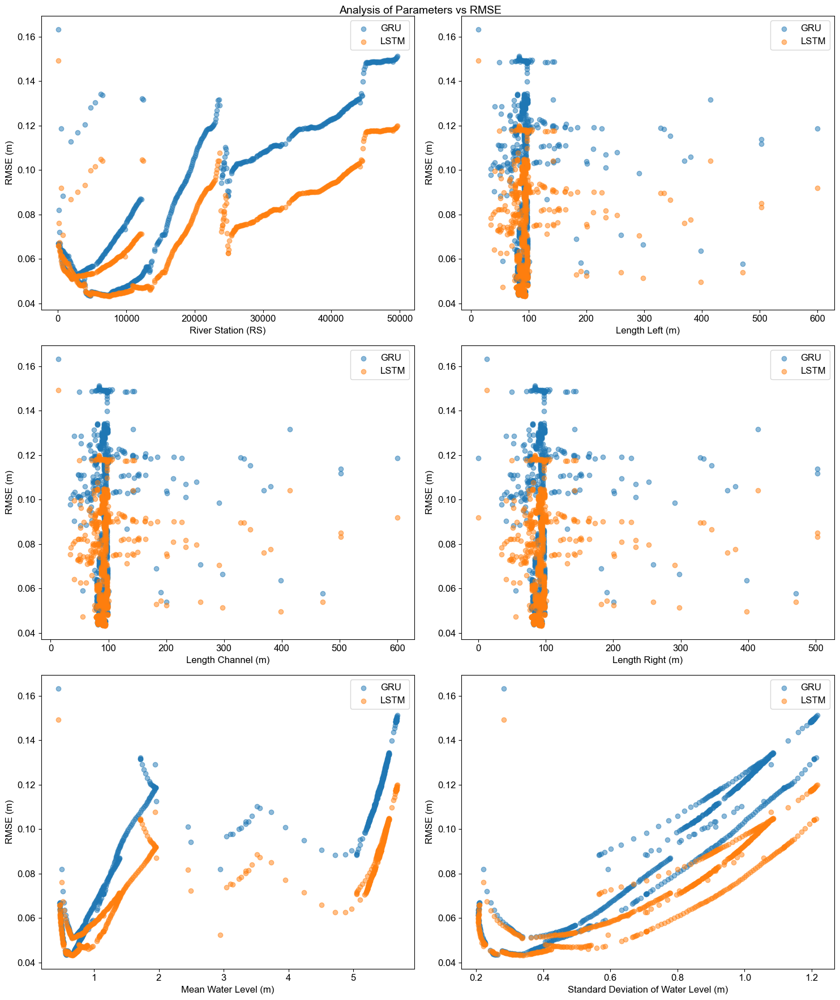

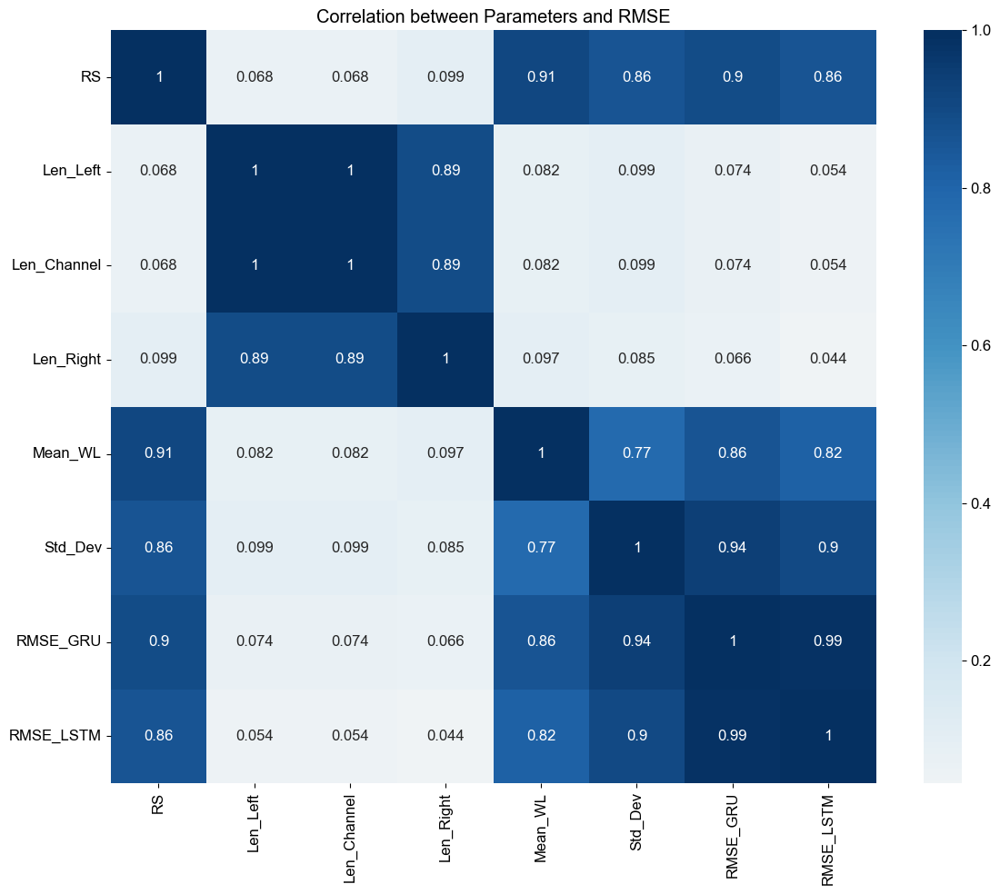


Summary Statistics:
            RS  Len_Left  Len_Channel  Len_Right  Mean_WL  Std_Dev  RMSE_GRU  \
count   644.00    713.00       713.00     713.00   715.00   715.00    715.00   
mean  20202.10     98.38        98.38      97.54     2.97     0.75      0.09   
std   15055.48     49.04        49.04      45.43     2.21     0.31      0.03   
min      32.00     12.90        12.90       0.00     0.45     0.21      0.04   
25%    7144.25     83.90        83.90      83.90     0.81     0.47      0.06   
50%   16869.00     91.72        91.72      91.72     1.79     0.85      0.10   
75%   32451.50     97.00        97.00      96.80     5.42     1.01      0.12   
max   49645.77    600.00       600.00     502.60     5.68     1.22      0.16   

       RMSE_LSTM  
count     715.00  
mean        0.07  
std         0.02  
min         0.04  
25%         0.05  
50%         0.07  
75%         0.09  
max         0.15  

Average RMSE by River and Reach:
                             RMSE_GRU  RMSE_LSTM
Rive

In [352]:
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt

# Flatten the tuples
flat_data = [item.decode('utf-8') if isinstance(item, bytes) else item for sublist in River_XS for item in sublist]

# Reshape the flattened data into a DataFrame
df = pd.DataFrame(np.array(flat_data).reshape(len(River_XS), -1), columns=[
    'River', 'Reach', 'RS', 'Name', 'Description', 'Len Left', 'Len Channel', 'Len Right', 'Left Bank', 'Right Bank',
    'Friction Mode', 'Contr', 'Expan', 'Contr (USF)', 'Expan (USF)', 'HP Count', 'HP Start Elev', 'HP Vert Incr', 'HP LOB Slices',
    'HP Chan Slices', 'HP ROB Slices', 'Default Centerline'
])

df_analysis = pd.DataFrame({
    'River': df['River'],
    'Reach': df['Reach'],
    'RS': pd.to_numeric(df['RS'], errors='coerce'),
    'Len_Left': pd.to_numeric(df['Len Left'], errors='coerce'),
    'Len_Channel': pd.to_numeric(df['Len Channel'], errors='coerce'),
    'Len_Right': pd.to_numeric(df['Len Right'], errors='coerce'),
    'Left_Bank': pd.to_numeric(df['Left Bank'], errors='coerce'),
    'Right_Bank': pd.to_numeric(df['Right Bank'], errors='coerce'),
    'HP_Start_Elev': pd.to_numeric(df['HP Start Elev'], errors='coerce'),
    'RMSE_GRU': rmse_GRU,
    'RMSE_LSTM': rmse_LSTM,
    'Std_Dev': std_actual,
    'Max_WL': np.max(actual_values, axis=0),
    'Min_WL': np.min(actual_values, axis=0),
    'Mean_WL': np.mean(actual_values, axis=0)
})

# Create a figure with multiple subplots
fig, axes = plt.subplots(3, 2, figsize=(15, 18))
fig.suptitle('Analysis of Parameters vs RMSE', fontsize=14)

# Plot 1: RS vs RMSE
ax = axes[0,0]
ax.scatter(df_analysis['RS'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['RS'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('River Station (RS)')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 2: Length Left vs RMSE
ax = axes[0,1]
ax.scatter(df_analysis['Len_Left'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['Len_Left'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('Length Left (m)')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 3: Length Channel vs RMSE
ax = axes[1,0]
ax.scatter(df_analysis['Len_Channel'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['Len_Channel'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('Length Channel (m)')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 4: Length Right vs RMSE
ax = axes[1,1]
ax.scatter(df_analysis['Len_Right'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['Len_Right'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('Length Right (m)')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 5: Water level statistics vs RMSE
ax = axes[2,0]
ax.scatter(df_analysis['Mean_WL'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['Mean_WL'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('Mean Water Level (m)')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 6: Standard deviation vs RMSE
ax = axes[2,1]
ax.scatter(df_analysis['Std_Dev'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['Std_Dev'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('Standard Deviation of Water Level (m)')
ax.set_ylabel('RMSE (m)')
ax.legend()

plt.tight_layout()
plt.show()

# Calculate correlation matrix
corr_columns = ['RS', 'Len_Left', 'Len_Channel', 'Len_Right', 'Mean_WL', 'Std_Dev', 'RMSE_GRU', 'RMSE_LSTM']
correlation = df_analysis[corr_columns].corr()

# Plot correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation, annot=True, cmap='RdBu', center=0)
plt.title('Correlation between Parameters and RMSE')
plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSummary Statistics:")
print(df_analysis[corr_columns].describe())

# Calculate average RMSE by river and reach
print("\nAverage RMSE by River and Reach:")
rmse_summary = df_analysis.groupby(['River', 'Reach'])[['RMSE_GRU', 'RMSE_LSTM']].mean()
print(rmse_summary)

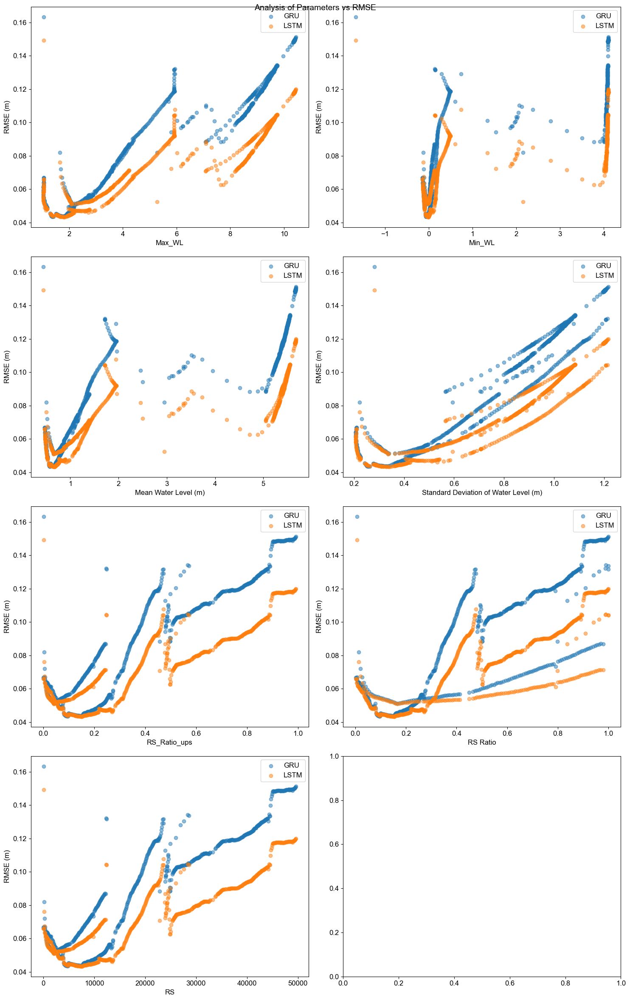

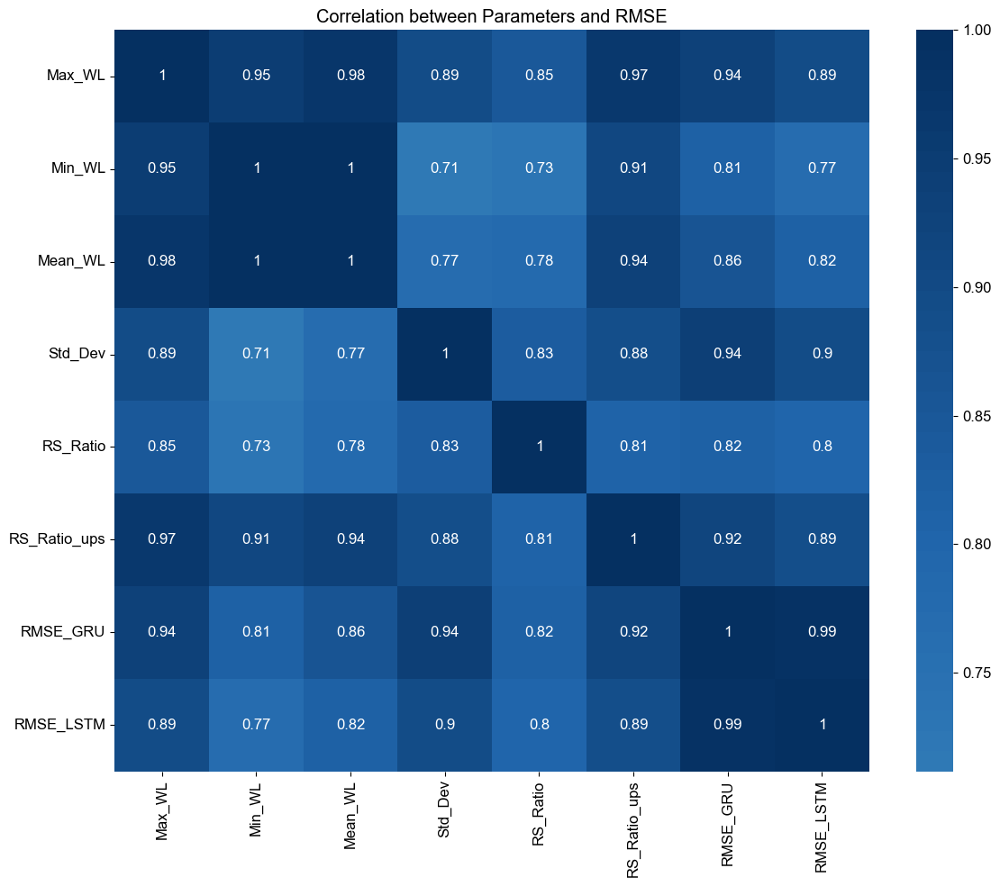


Summary Statistics:
       Max_WL  Min_WL  Mean_WL  Std_Dev  RS_Ratio  RS_Ratio_ups  RMSE_GRU  \
count  715.00  715.00   715.00   715.00    644.00        644.00    715.00   
mean     5.78    1.85     2.97     0.75      0.49          0.41      0.09   
std      3.27    1.97     2.21     0.31      0.30          0.30      0.03   
min      1.05   -1.67     0.45     0.21      0.00          0.00      0.04   
25%      2.61    0.02     0.81     0.47      0.23          0.15      0.06   
50%      5.70    0.39     1.79     0.85      0.49          0.35      0.10   
75%      9.11    4.08     5.42     1.01      0.77          0.65      0.12   
max     10.45    4.10     5.68     1.22      1.00          0.99      0.16   

       RMSE_LSTM  
count     715.00  
mean        0.07  
std         0.02  
min         0.04  
25%         0.05  
50%         0.07  
75%         0.09  
max         0.15  

Average RMSE by River and Reach:
                             RMSE_GRU  RMSE_LSTM
River         Reach            

In [353]:
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt

# Flatten the tuples
flat_data = [item.decode('utf-8') if isinstance(item, bytes) else item for sublist in River_XS for item in sublist]

# Reshape the flattened data into a DataFrame
df = pd.DataFrame(np.array(flat_data).reshape(len(River_XS), -1), columns=[
    'River', 'Reach', 'RS', 'Name', 'Description', 'Len Left', 'Len Channel', 'Len Right', 'Left Bank', 'Right Bank',
    'Friction Mode', 'Contr', 'Expan', 'Contr (USF)', 'Expan (USF)', 'HP Count', 'HP Start Elev', 'HP Vert Incr', 'HP LOB Slices',
    'HP Chan Slices', 'HP ROB Slices', 'Default Centerline'
])


df_analysis = pd.DataFrame({
    'River': df['River'],
    'Reach': df['Reach'],
    'RS': pd.to_numeric(df['RS'], errors='coerce'),
    'Len_Left': pd.to_numeric(df['Len Left'], errors='coerce'),
    'Len_Channel': pd.to_numeric(df['Len Channel'], errors='coerce'),
    'Len_Right': pd.to_numeric(df['Len Right'], errors='coerce'),
    'Left_Bank': pd.to_numeric(df['Left Bank'], errors='coerce'),
    'Right_Bank': pd.to_numeric(df['Right Bank'], errors='coerce'),
    'HP_Start_Elev': pd.to_numeric(df['HP Start Elev'], errors='coerce'),
    'RMSE_GRU': rmse_GRU,
    'RMSE_LSTM': rmse_LSTM,
    'Std_Dev': std_actual,
    'Max_WL': np.max(actual_values, axis=0),
    'Min_WL': np.min(actual_values, axis=0),
    'Mean_WL': np.mean(actual_values, axis=0)
})

df_analysis.loc[df_analysis['River'] == 'canal1','RS'] += 22084

# Calculate the maximum RS for each reach or river
max_rs = df_analysis.groupby(['River'])['RS'].transform('max')

# Compute the ratio of each RS to the maximum RS for its respective reach or river
df_analysis['RS_Ratio'] = df_analysis['RS'] / max_rs
# Compute the ratio of each RS to the maximum RS for its respective reach or river
df_analysis['RS_Ratio_ups'] = df_analysis['RS'] / 50000

# Create a figure with multiple subplots
fig, axes = plt.subplots(4, 2, figsize=(15, 24))
fig.suptitle('Analysis of Parameters vs RMSE', fontsize=14)

# Plot 1: RS vs RMSE
ax = axes[0,0]
ax.scatter(df_analysis['Max_WL'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['Max_WL'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('Max_WL')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 2: Length Left vs RMSE
ax = axes[0,1]
ax.scatter(df_analysis['Min_WL'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['Min_WL'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('Min_WL')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 5: Water level statistics vs RMSE
ax = axes[1,0]
ax.scatter(df_analysis['Mean_WL'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['Mean_WL'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('Mean Water Level (m)')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 6: Standard deviation vs RMSE
ax = axes[1,1]
ax.scatter(df_analysis['Std_Dev'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['Std_Dev'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('Standard Deviation of Water Level (m)')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 7: RS Ratio vs RMSE
ax = axes[2,0]
ax.scatter(df_analysis['RS_Ratio_ups'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['RS_Ratio_ups'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('RS_Ratio_ups')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 7: RS Ratio vs RMSE
ax = axes[2,1]
ax.scatter(df_analysis['RS_Ratio'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['RS_Ratio'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('RS Ratio')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 7: RS Ratio vs RMSE
ax = axes[3,0]
ax.scatter(df_analysis['RS'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['RS'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('RS')
ax.set_ylabel('RMSE (m)')
ax.legend()


plt.tight_layout()
plt.show()

# Calculate correlation matrix
corr_columns = ['Max_WL', 'Min_WL', 'Mean_WL', 'Std_Dev', 'RS_Ratio','RS_Ratio_ups', 'RMSE_GRU', 'RMSE_LSTM']
correlation = df_analysis[corr_columns].corr()

# Plot correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation, annot=True, cmap='RdBu', center=0)
plt.title('Correlation between Parameters and RMSE')
plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSummary Statistics:")
print(df_analysis[corr_columns].describe())

# Calculate average RMSE by river and reach
print("\nAverage RMSE by River and Reach:")
rmse_summary = df_analysis.groupby(['River', 'Reach'])[['RMSE_GRU', 'RMSE_LSTM']].mean()
print(rmse_summary)

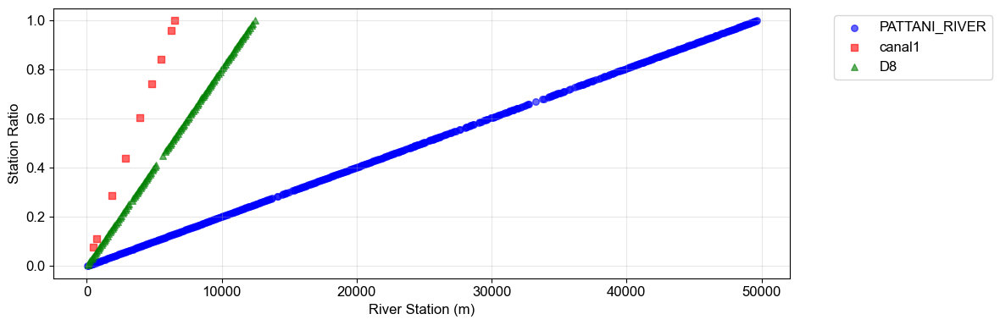

In [354]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Set font to Arial
plt.rcParams['font.family'] = 'Arial'

# Prepare data by river
rivers = df['River'].unique()
markers = ['o', 's', '^', 'D']  # Different markers for each river
colors = ['blue', 'red', 'green', 'orange']  # Colors for each river

plt.figure(figsize=(12, 4))

for i, river in enumerate(rivers):
    river_data = df[df['River'] == river]
    
    # Calculate distance and ratio for each river
    RS = pd.to_numeric(river_data['RS'], errors='coerce')
    max_RS = RS.max()
    ratio = RS / max_RS if max_RS != 0 else 0
    
    plt.scatter(RS, ratio, 
               label=f'{river}', 
               alpha=0.6,
               marker=markers[i],
               color=colors[i],
               s=30)

plt.xlabel('River Station (m)')
plt.ylabel('Station Ratio')
plt.grid(True, alpha=0.3)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


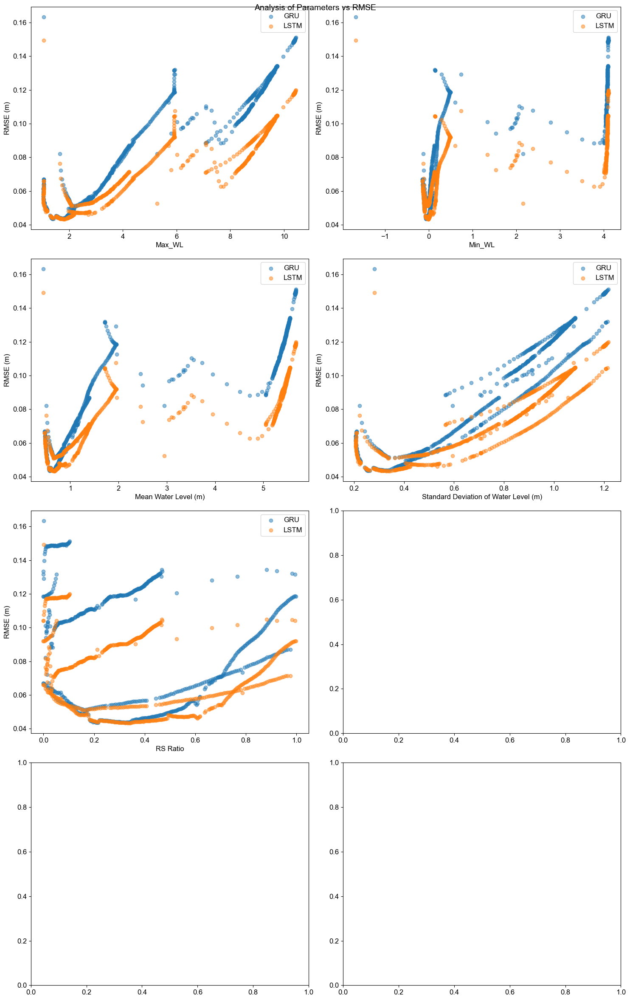

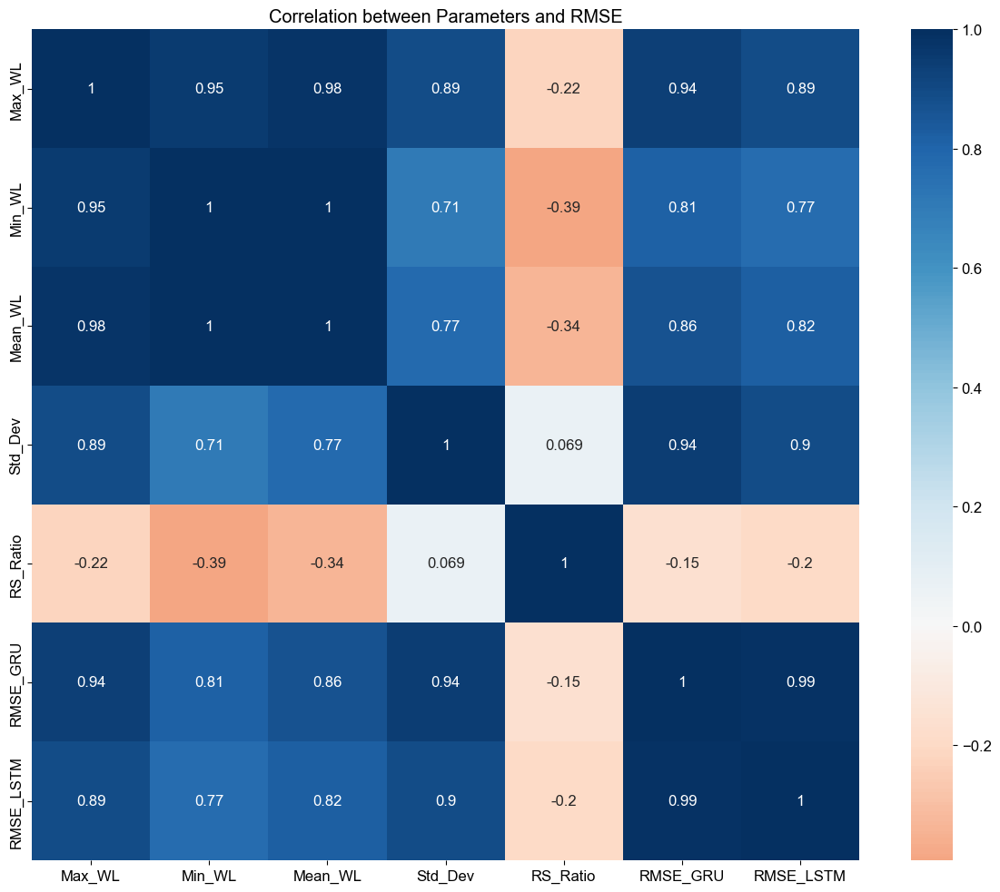


Summary Statistics:
       Max_WL  Min_WL  Mean_WL  Std_Dev  RS_Ratio  RMSE_GRU  RMSE_LSTM
count  715.00  715.00   715.00   715.00    644.00    715.00     715.00
mean     5.78    1.85     2.97     0.75      0.36      0.09       0.07
std      3.27    1.97     2.21     0.31      0.29      0.03       0.02
min      1.05   -1.67     0.45     0.21      0.00      0.04       0.04
25%      2.61    0.02     0.81     0.47      0.10      0.06       0.05
50%      5.70    0.39     1.79     0.85      0.32      0.10       0.07
75%      9.11    4.08     5.42     1.01      0.56      0.12       0.09
max     10.45    4.10     5.68     1.22      1.00      0.16       0.15

Average RMSE by River and Reach:
                             RMSE_GRU  RMSE_LSTM
River         Reach                             
D8            Reach 1            0.07       0.06
PATTANI_RIVER Reach 3            0.07       0.06
              Reach 4            0.12       0.10
              Reach 5            0.15       0.12
            

In [355]:
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt

# Flatten the tuples
flat_data = [item.decode('utf-8') if isinstance(item, bytes) else item for sublist in River_XS for item in sublist]

# Reshape the flattened data into a DataFrame
df = pd.DataFrame(np.array(flat_data).reshape(len(River_XS), -1), columns=[
    'River', 'Reach', 'RS', 'Name', 'Description', 'Len Left', 'Len Channel', 'Len Right', 'Left Bank', 'Right Bank',
    'Friction Mode', 'Contr', 'Expan', 'Contr (USF)', 'Expan (USF)', 'HP Count', 'HP Start Elev', 'HP Vert Incr', 'HP LOB Slices',
    'HP Chan Slices', 'HP ROB Slices', 'Default Centerline'
])

df_analysis = pd.DataFrame({
    'River': df['River'],
    'Reach': df['Reach'],
    'RS': pd.to_numeric(df['RS'], errors='coerce'),
    'Len_Left': pd.to_numeric(df['Len Left'], errors='coerce'),
    'Len_Channel': pd.to_numeric(df['Len Channel'], errors='coerce'),
    'Len_Right': pd.to_numeric(df['Len Right'], errors='coerce'),
    'Left_Bank': pd.to_numeric(df['Left Bank'], errors='coerce'),
    'Right_Bank': pd.to_numeric(df['Right Bank'], errors='coerce'),
    'HP_Start_Elev': pd.to_numeric(df['HP Start Elev'], errors='coerce'),
    'RMSE_GRU': rmse_GRU,
    'RMSE_LSTM': rmse_LSTM,
    'Std_Dev': std_actual,
    'Max_WL': np.max(actual_values, axis=0),
    'Min_WL': np.min(actual_values, axis=0),
    'Mean_WL': np.mean(actual_values, axis=0)
})

# # Add 22084 to RS for "canal1" river
# df_analysis.loc[df_analysis['River'] == 'canal1', 'RS'] += 22084

# Calculate the minimum and maximum RS for each reach or river
min_rs = df_analysis.groupby(['River', 'Reach'])['RS'].transform('min')
max_rs = df_analysis.groupby(['River', 'Reach'])['RS'].transform('max')

# Compute the ratio of each RS to the maximum RS for its respective reach or river
df_analysis['RS_Ratio'] = (df_analysis['RS'] - min_rs) / (max_rs)

# Create a figure with multiple subplots
fig, axes = plt.subplots(4, 2, figsize=(15, 24))
fig.suptitle('Analysis of Parameters vs RMSE', fontsize=14)

# Plot 1: RS vs RMSE
ax = axes[0,0]
ax.scatter(df_analysis['Max_WL'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['Max_WL'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('Max_WL')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 2: Length Left vs RMSE
ax = axes[0,1]
ax.scatter(df_analysis['Min_WL'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['Min_WL'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('Min_WL')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 5: Water level statistics vs RMSE
ax = axes[1,0]
ax.scatter(df_analysis['Mean_WL'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['Mean_WL'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('Mean Water Level (m)')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 6: Standard deviation vs RMSE
ax = axes[1,1]
ax.scatter(df_analysis['Std_Dev'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['Std_Dev'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('Standard Deviation of Water Level (m)')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 7: RS Ratio vs RMSE
ax = axes[2,0]
ax.scatter(df_analysis['RS_Ratio'], df_analysis['RMSE_GRU'], alpha=0.5, label='GRU')
ax.scatter(df_analysis['RS_Ratio'], df_analysis['RMSE_LSTM'], alpha=0.5, label='LSTM')
ax.set_xlabel('RS Ratio')
ax.set_ylabel('RMSE (m)')
ax.legend()

plt.tight_layout()
plt.show()

# Calculate correlation matrix
corr_columns = ['Max_WL', 'Min_WL', 'Mean_WL', 'Std_Dev', 'RS_Ratio', 'RMSE_GRU', 'RMSE_LSTM']
correlation = df_analysis[corr_columns].corr()

# Plot correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation, annot=True, cmap='RdBu', center=0)
plt.title('Correlation between Parameters and RMSE')
plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSummary Statistics:")
print(df_analysis[corr_columns].describe())

# Calculate average RMSE by river and reach
print("\nAverage RMSE by River and Reach:")
rmse_summary = df_analysis.groupby(['River', 'Reach'])[['RMSE_GRU', 'RMSE_LSTM']].mean()
print(rmse_summary)

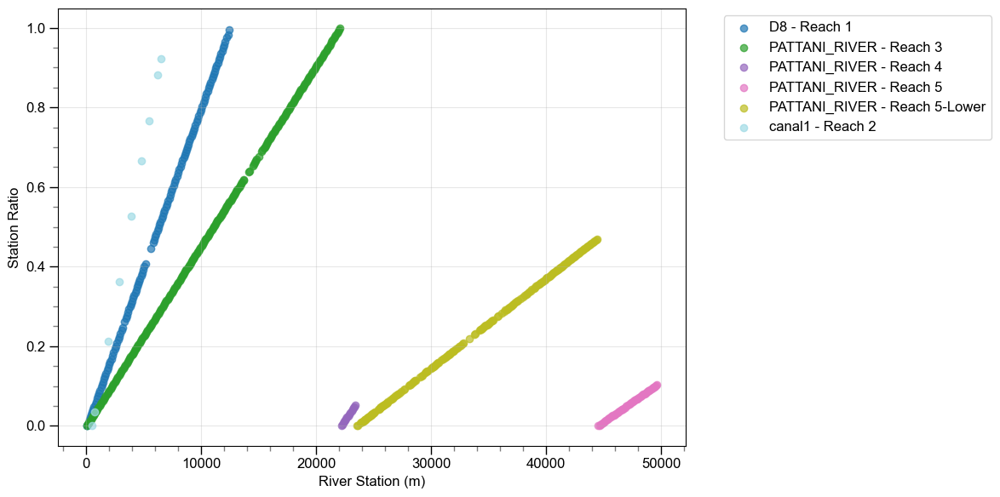

In [356]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set font to Arial
plt.rcParams['font.family'] = 'Arial'

# Create figure
plt.figure(figsize=(12, 6))

# Create unique colors for each combination of river and reach
rivers_reaches = df_analysis.groupby(['River', 'Reach']).size().index
colors = plt.cm.tab20(np.linspace(0, 1, len(rivers_reaches)))

# Plot each river and reach combination
for i, (river, reach) in enumerate(rivers_reaches):
    mask = (df_analysis['River'] == river) & (df_analysis['Reach'] == reach)
    data = df_analysis[mask]
    
    plt.scatter(data['RS'], data['RS_Ratio'], 
               label=f'{river} - {reach}',
               alpha=0.7,
               color=colors[i])

plt.xlabel('River Station (m)')
plt.ylabel('Station Ratio')
plt.grid(True, alpha=0.3)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Add minor ticks
plt.minorticks_on()
plt.tick_params(which='both', width=1)
plt.tick_params(which='major', length=7)
plt.tick_params(which='minor', length=4, color='gray')

plt.tight_layout()
plt.show()


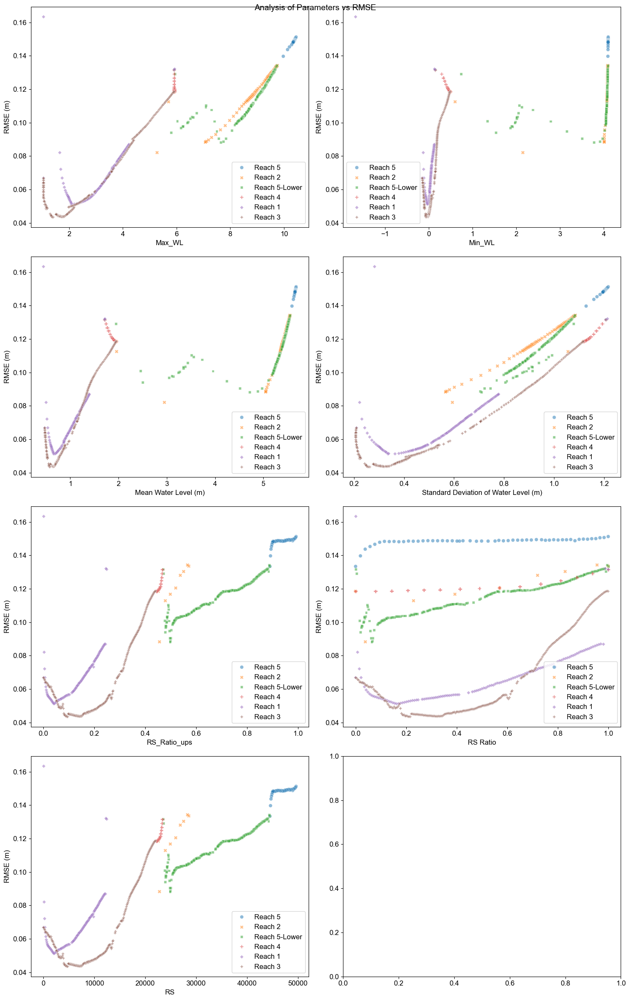

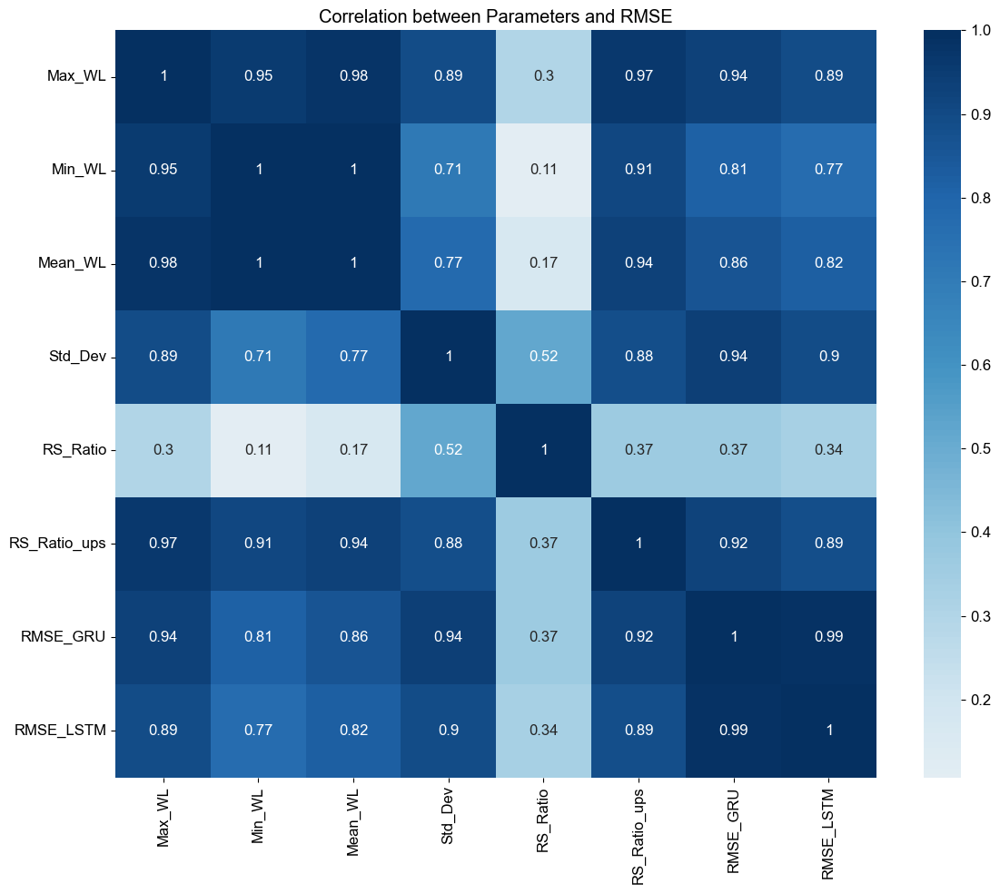


Summary Statistics:
       Max_WL  Min_WL  Mean_WL  Std_Dev  RS_Ratio  RS_Ratio_ups  RMSE_GRU  \
count  715.00  715.00   715.00   715.00    644.00        644.00    715.00   
mean     5.78    1.85     2.97     0.75      0.50          0.41      0.09   
std      3.27    1.97     2.21     0.31      0.30          0.30      0.03   
min      1.05   -1.67     0.45     0.21      0.00          0.00      0.04   
25%      2.61    0.02     0.81     0.47      0.23          0.15      0.06   
50%      5.70    0.39     1.79     0.85      0.50          0.35      0.10   
75%      9.11    4.08     5.42     1.01      0.77          0.65      0.12   
max     10.45    4.10     5.68     1.22      1.00          0.99      0.16   

       RMSE_LSTM  
count     715.00  
mean        0.07  
std         0.02  
min         0.04  
25%         0.05  
50%         0.07  
75%         0.09  
max         0.15  

Average RMSE by River and Reach:
                             RMSE_GRU  RMSE_LSTM
River         Reach            

In [357]:
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt

# Flatten the tuples
flat_data = [item.decode('utf-8') if isinstance(item, bytes) else item for sublist in River_XS for item in sublist]

# Reshape the flattened data into a DataFrame
df = pd.DataFrame(np.array(flat_data).reshape(len(River_XS), -1), columns=[
    'River', 'Reach', 'RS', 'Name', 'Description', 'Len Left', 'Len Channel', 'Len Right', 'Left Bank', 'Right Bank',
    'Friction Mode', 'Contr', 'Expan', 'Contr (USF)', 'Expan (USF)', 'HP Count', 'HP Start Elev', 'HP Vert Incr', 'HP LOB Slices',
    'HP Chan Slices', 'HP ROB Slices', 'Default Centerline'
])

df_analysis = pd.DataFrame({
    'River': df['River'],
    'Reach': df['Reach'],
    'RS': pd.to_numeric(df['RS'], errors='coerce'),
    'Len_Left': pd.to_numeric(df['Len Left'], errors='coerce'),
    'Len_Channel': pd.to_numeric(df['Len Channel'], errors='coerce'),
    'Len_Right': pd.to_numeric(df['Len Right'], errors='coerce'),
    'Left_Bank': pd.to_numeric(df['Left Bank'], errors='coerce'),
    'Right_Bank': pd.to_numeric(df['Right Bank'], errors='coerce'),
    'HP_Start_Elev': pd.to_numeric(df['HP Start Elev'], errors='coerce'),
    'RMSE_GRU': rmse_GRU,
    'RMSE_LSTM': rmse_LSTM,
    'Std_Dev': std_actual,
    'Max_WL': np.max(actual_values, axis=0),
    'Min_WL': np.min(actual_values, axis=0),
    'Mean_WL': np.mean(actual_values, axis=0)
})

df_analysis.loc[df_analysis['River'] == 'canal1', 'RS'] += 22084

# Calculate the minimum and maximum RS for each reach or river
min_rs = df_analysis.groupby(['River', 'Reach'])['RS'].transform('min')
max_rs = df_analysis.groupby(['River', 'Reach'])['RS'].transform('max')

# Compute the ratio of each RS to the maximum RS for its respective reach or river
df_analysis['RS_Ratio'] = (df_analysis['RS'] - min_rs) / (max_rs - min_rs)
df_analysis['RS_Ratio_ups'] = df_analysis['RS'] / 50000

# Create a figure with multiple subplots
fig, axes = plt.subplots(4, 2, figsize=(15, 24))
fig.suptitle('Analysis of Parameters vs RMSE', fontsize=14)

# Plot 1: Max_WL vs RMSE
ax = axes[0,0]
sns.scatterplot(x='Max_WL', y='RMSE_GRU', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
# sns.scatterplot(x='Max_WL', y='RMSE_LSTM', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
ax.set_xlabel('Max_WL')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 2: Min_WL vs RMSE
ax = axes[0,1]
sns.scatterplot(x='Min_WL', y='RMSE_GRU', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
# sns.scatterplot(x='Min_WL', y='RMSE_LSTM', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
ax.set_xlabel('Min_WL')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 3: Mean_WL vs RMSE
ax = axes[1,0]
sns.scatterplot(x='Mean_WL', y='RMSE_GRU', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
# sns.scatterplot(x='Mean_WL', y='RMSE_LSTM', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
ax.set_xlabel('Mean Water Level (m)')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 4: Std_Dev vs RMSE
ax = axes[1,1]
sns.scatterplot(x='Std_Dev', y='RMSE_GRU', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
# sns.scatterplot(x='Std_Dev', y='RMSE_LSTM', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
ax.set_xlabel('Standard Deviation of Water Level (m)')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 5: RS_Ratio_ups vs RMSE
ax = axes[2,0]
sns.scatterplot(x='RS_Ratio_ups', y='RMSE_GRU', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
# sns.scatterplot(x='RS_Ratio_ups', y='RMSE_LSTM', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
ax.set_xlabel('RS_Ratio_ups')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 6: RS_Ratio vs RMSE
ax = axes[2,1]
sns.scatterplot(x='RS_Ratio', y='RMSE_GRU', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
# sns.scatterplot(x='RS_Ratio', y='RMSE_LSTM', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
ax.set_xlabel('RS Ratio')
ax.set_ylabel('RMSE (m)')
ax.legend()

# Plot 7: RS vs RMSE
ax = axes[3,0]
sns.scatterplot(x='RS', y='RMSE_GRU', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
# sns.scatterplot(x='RS', y='RMSE_LSTM', hue='Reach', style='Reach', data=df_analysis, ax=ax, alpha=0.5)
ax.set_xlabel('RS')
ax.set_ylabel('RMSE (m)')
ax.legend()

plt.tight_layout()
plt.show()

# Calculate correlation matrix
corr_columns = ['Max_WL', 'Min_WL', 'Mean_WL', 'Std_Dev', 'RS_Ratio', 'RS_Ratio_ups', 'RMSE_GRU', 'RMSE_LSTM']
correlation = df_analysis[corr_columns].corr()

# Plot correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation, annot=True, cmap='RdBu', center=0)
plt.title('Correlation between Parameters and RMSE')
plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSummary Statistics:")
print(df_analysis[corr_columns].describe())

# Calculate average RMSE by river and reach
print("\nAverage RMSE by River and Reach:")
rmse_summary = df_analysis.groupby(['River', 'Reach'])[['RMSE_GRU', 'RMSE_LSTM']].mean()
print(rmse_summary)

In [358]:
all_predict_GRU.shape

(3073, 715)

C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_27240\379467799.py:11: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  tr = PolarAxes.PolarTransform()
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_27240\379467799.py:123: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  plt.clabel(dia_GRU.add_contours(colors='red'), inline=0, fontsize=0)
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_27240\379467799.py:91: MatplotlibDeprecationWarning: The get_cmap function was depre

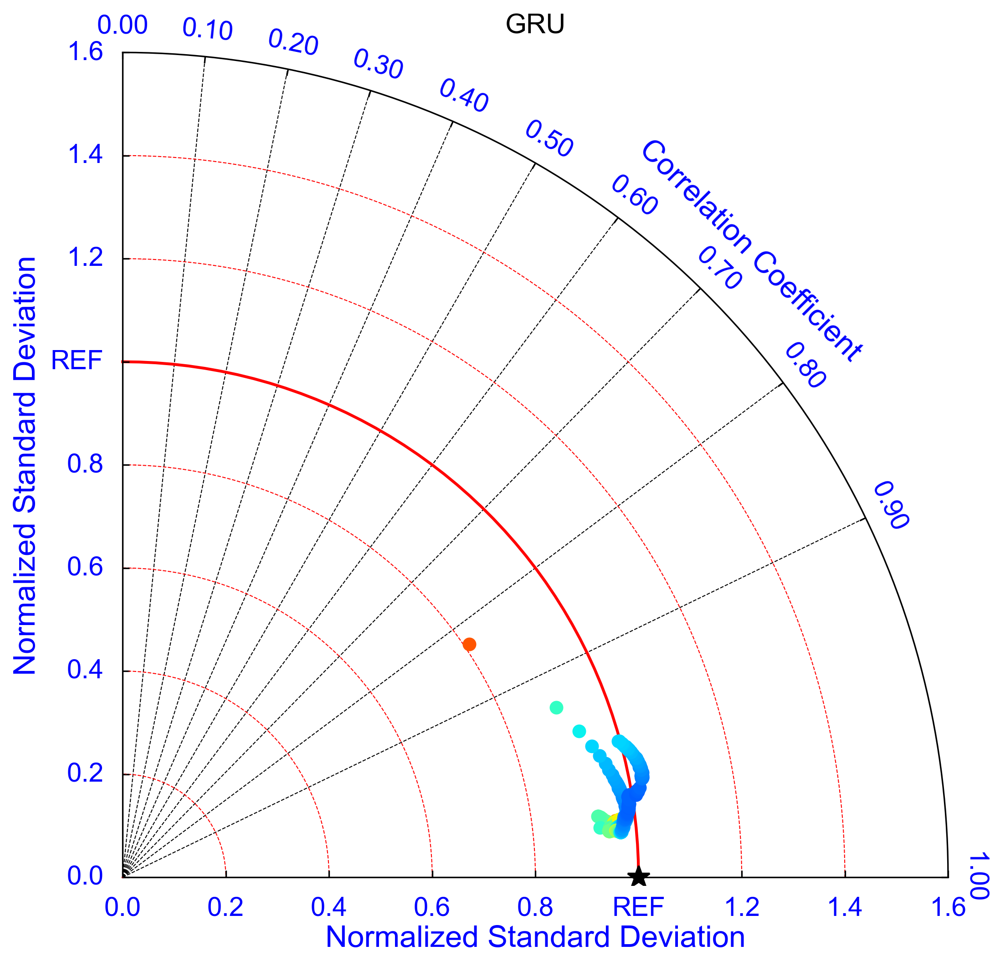

C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_27240\379467799.py:139: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  plt.clabel(dia_LSTM.add_contours(colors='red'), inline=0, fontsize=0)


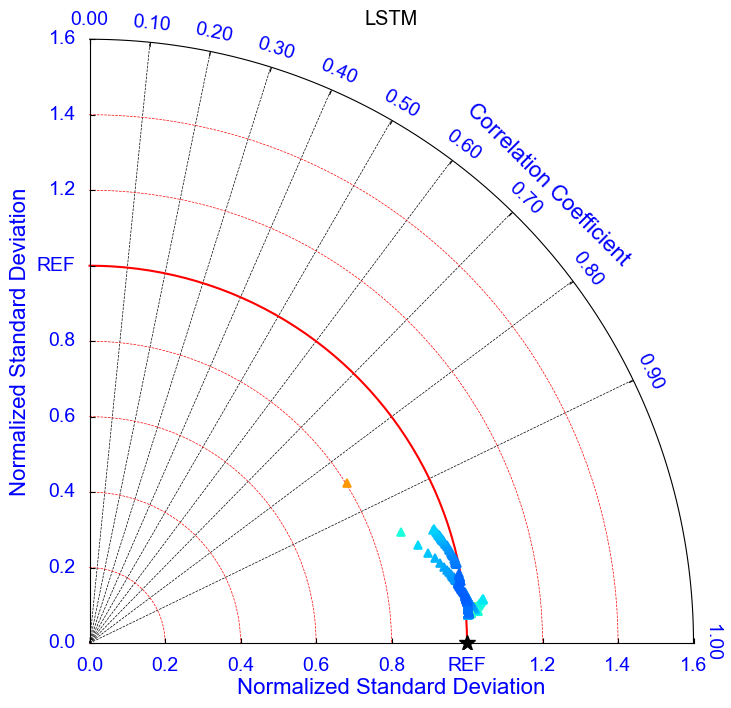

In [359]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.projections import PolarAxes
import mpl_toolkits.axisartist.grid_finder as gf
import mpl_toolkits.axisartist.floating_axes as fa
import matplotlib.cm as cm

class TaylorDiagram(object):
    def __init__(self, fig=None, rect=111, label='_'):
        self.ref_std = 1  # Reference value (Normalized Standard Deviation)
        tr = PolarAxes.PolarTransform()
        
        # Define correlation labels
        rlocs = np.linspace(0, 1, num=11)  # Define correlation levels
        tlocs = np.arccos(rlocs)  # Convert correlation to angle
        gl1 = gf.FixedLocator(tlocs)  
        tf1 = gf.DictFormatter(dict(zip(tlocs, map(lambda x: f"{x:.2f}", rlocs))))

        self.smin = 0
        self.smax = 1.6 * self.ref_std
        gh = fa.GridHelperCurveLinear(tr, extremes=(0, (np.pi/2), self.smin, self.smax), 
                                      grid_locator1=gl1, tick_formatter1=tf1)
        
        if fig is None:
            fig = plt.figure()
        ax = fa.FloatingSubplot(fig, rect, grid_helper=gh)
        fig.add_subplot(ax)
        
        ax.axis['top'].set_axis_direction('bottom')
        ax.axis['top'].label.set_text("Correlation Coefficient")
        ax.axis['top'].toggle(ticklabels=True, label=True)
        ax.axis['top'].major_ticklabels.set_axis_direction('top')
        ax.axis['top'].label.set_axis_direction('top')
        ax.axis['top'].label.set_color('blue')
        ax.axis['top'].label.set_fontsize(16)
        # ax.axis['top'].label.set_pad(20)

        ax.axis['left'].set_axis_direction('bottom')
        ax.axis['left'].label.set_text("Normalized Standard Deviation")
        ax.axis['left'].toggle(ticklabels=True, label=True)
        ax.axis['left'].major_ticklabels.set_axis_direction('bottom')
        ax.axis['left'].label.set_axis_direction('bottom')
        ax.axis['left'].label.set_color('blue')
        ax.axis['left'].label.set_fontsize(16)


        ax.axis['right'].set_axis_direction('top')
        ax.axis['right'].label.set_text("Normalized Standard Deviation")
        ax.axis['right'].toggle(ticklabels=True, label=True)
        ax.axis['right'].major_ticklabels.set_axis_direction('left')
        ax.axis['right'].label.set_axis_direction('top')
        ax.axis['right'].label.set_color('blue')
        ax.axis['right'].label.set_fontsize(16)
        for axis in ['top', 'left', 'right', 'bottom']:
            ax.axis[axis].major_ticklabels.set_color('blue')
            ax.axis[axis].major_ticklabels.set_fontsize(14)
            ax.axis[axis].major_ticklabels.set_pad(10)

        # Ensure the bottom axis is visible
        # ax.axis['bottom'].set_visible(True)

        # Define tick locations
        tick_values = np.linspace(self.smin, self.smax, num=9)  # Generate tick values

        # Create a dictionary to replace 1.0 with "REF"
        tick_labels_dict = {t: ("REF" if np.isclose(t, 1.0) else f"{t:.1f}") for t in tick_values}

        # Apply the custom tick formatter using DictFormatter
        gh.grid_finder.tick_formatter2 = gf.DictFormatter(tick_labels_dict)




        ax.axis['bottom'].set_visible(False)
        ax.grid(color='grey')  # Changed grid color to red
        ax.grid(axis='x', which='minor', color='black', linestyle='--', linewidth=0.5)  # Changed major grid color to black
        # ax.grid(axis='y', which='minor', color='green', linestyle='--', linewidth=0.5)  # Changed minor grid color to black
        
        self._ax = ax
        self.ax = ax.get_aux_axes(tr)

        l, = self.ax.plot([0], self.ref_std, 'k*', ls='', ms=12, label=label, zorder=10)
        t = np.linspace(0, (np.pi / 2.0))
        r = np.zeros_like(t) + self.ref_std
        self.ax.plot(t, r, 'r-', label='_')

        self.samplePoints = [l]

    def add_sample(self, norm_std, correlation, rmse, *args, **kwargs):
        theta = np.arccos(correlation)
        cmap = cm.get_cmap('jet')  # Colormap for RMSE
        color = cmap(rmse / 0.2)  # Normalize RMSE for color mapping, assuming max RMSE is 0.2
        l, = self.ax.plot(theta, norm_std, *args, markerfacecolor=color, markeredgecolor=color, **kwargs)
        self.samplePoints.append(l)
        return l

    def add_contours(self, levels=8, linestyle='dashed', linewidth=0.5, **kwargs):
        rs, ts = np.meshgrid(np.linspace(self.smin, self.smax, 100), np.linspace(0, (np.pi / 2.0), 100))
        contours = self.ax.contour(ts, rs, rs, levels, linestyles=linestyle, linewidths=linewidth, **kwargs)
        return contours

# Function to plot separate Taylor Diagrams for GRU and LSTM
def plot_taylor_diagram_separate(actual, predicted_GRU, predicted_LSTM):
    num_sections = actual.shape[1]

    std_actual = np.std(actual, axis=0)
    std_GRU = np.std(predicted_GRU, axis=0)
    std_LSTM = np.std(predicted_LSTM, axis=0)

    norm_std_GRU = std_GRU / std_actual
    norm_std_LSTM = std_LSTM / std_actual

    correlation_GRU = np.array([np.corrcoef(actual[:, i], predicted_GRU[:, i])[0, 1] for i in range(num_sections)])
    correlation_LSTM = np.array([np.corrcoef(actual[:, i], predicted_LSTM[:, i])[0, 1] for i in range(num_sections)])

    rmse_GRU = np.sqrt(np.mean((actual - predicted_GRU) ** 2, axis=0))
    rmse_LSTM = np.sqrt(np.mean((actual - predicted_LSTM) ** 2, axis=0))

    # Plot for GRU
    fig_GRU = plt.figure(figsize=(8, 8),dpi=300)
    dia_GRU = TaylorDiagram(fig=fig_GRU, rect=111, label='HEC-RAS')

    plt.clabel(dia_GRU.add_contours(colors='red'), inline=0, fontsize=0)
    

    for i in range(num_sections):
        dia_GRU.add_sample(norm_std_GRU[i], correlation_GRU[i], rmse_GRU[i], marker='o', mew=1.2)

    spl_GRU = [p.get_label() for p in dia_GRU.samplePoints]
    # fig_GRU.legend(dia_GRU.samplePoints, spl_GRU, numpoints=1, prop=dict(size='small'), loc=[0.7, 0.3])

    plt.title("GRU")
    plt.show()

    # Plot for LSTM
    fig_LSTM = plt.figure(figsize=(8, 8))
    dia_LSTM = TaylorDiagram(fig=fig_LSTM, rect=111, label='HEC-RAS')

    plt.clabel(dia_LSTM.add_contours(colors='red'), inline=0, fontsize=0)

    for i in range(num_sections):
        dia_LSTM.add_sample(norm_std_LSTM[i], correlation_LSTM[i], rmse_LSTM[i], marker='^', mew=1.2)

    spl_LSTM = [p.get_label() for p in dia_LSTM.samplePoints]
    # fig_LSTM.legend(dia_LSTM.samplePoints, spl_LSTM, numpoints=1, prop=dict(size='small'), loc=[0.7, 0.3])

    plt.title("LSTM")
    plt.show()



# Call the function with actual and predicted data
plot_taylor_diagram_separate(all_actual, all_predict_GRU, all_predict_LSTM)

C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_27240\2549969065.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('jet')
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_27240\379467799.py:11: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  tr = PolarAxes.PolarTransform()
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_27240\2549969065.py:40: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this w

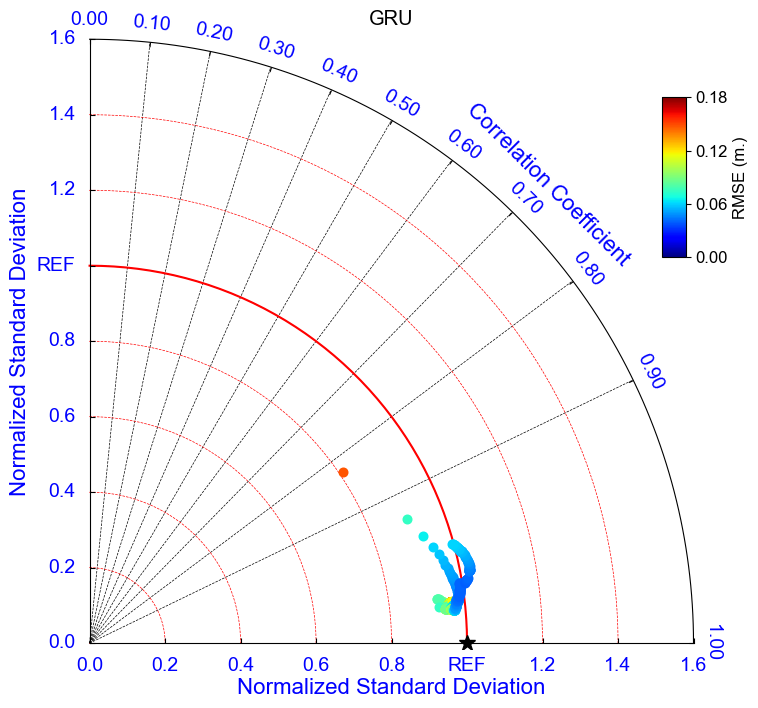

C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_27240\379467799.py:11: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  tr = PolarAxes.PolarTransform()
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_27240\2549969065.py:64: MatplotlibDeprecationWarning: Passing `apply_theta_transforms=True` (the default) is deprecated since Matplotlib 3.9. Support for this will be removed in Matplotlib in 3.11. To prevent this warning, set `apply_theta_transforms=False`, and make sure to shift theta values before being passed to this transform.
  plt.clabel(dia_LSTM.add_contours(colors='red'), inline=0, fontsize=0)
C:\Users\Weeraphat\AppData\Local\Temp\ipykernel_27240\379467799.py:91: MatplotlibDeprecationWarning: The get_cmap function was depr

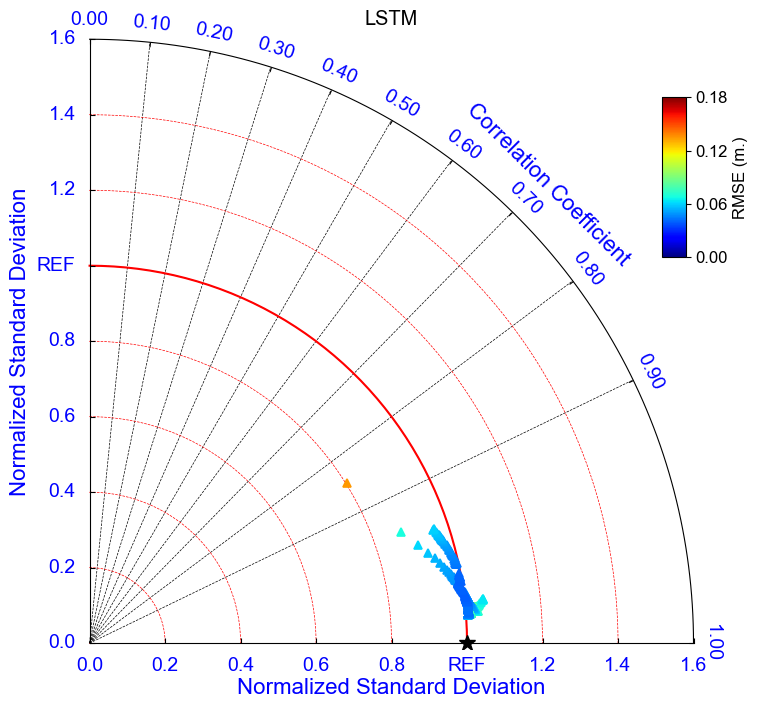

In [360]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.projections import PolarAxes
import mpl_toolkits.axisartist.grid_finder as gf
import mpl_toolkits.axisartist.floating_axes as fa
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Function to plot separate Taylor Diagrams for GRU and LSTM with RMSE color bar
def plot_taylor_diagram_separate(actual, predicted_GRU, predicted_LSTM):
    num_sections = actual.shape[1]

    std_actual = np.std(actual, axis=0)
    std_GRU = np.std(predicted_GRU, axis=0)
    std_LSTM = np.std(predicted_LSTM, axis=0)

    norm_std_GRU = std_GRU / std_actual
    norm_std_LSTM = std_LSTM / std_actual

    correlation_GRU = np.array([np.corrcoef(actual[:, i], predicted_GRU[:, i])[0, 1] for i in range(num_sections)])
    correlation_LSTM = np.array([np.corrcoef(actual[:, i], predicted_LSTM[:, i])[0, 1] for i in range(num_sections)])

    rmse_GRU = np.sqrt(np.mean((actual - predicted_GRU) ** 2, axis=0))
    rmse_LSTM = np.sqrt(np.mean((actual - predicted_LSTM) ** 2, axis=0))

    # Define colormap for RMSE
    cmap = cm.get_cmap('jet')
    vmin = min(rmse_GRU.min(), rmse_LSTM.min())
    vmax = max(rmse_GRU.max(), rmse_LSTM.max())
    vmin = 0
    vmax = 0.18
    vmid1 = vmin + (vmin + vmax) / 3
    vmid2 = vmax - (vmin + vmax) / 3
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

    # --- Plot for GRU ---
    fig_GRU = plt.figure(figsize=(8, 8))
    dia_GRU = TaylorDiagram(fig=fig_GRU, rect=111, label='HEC-RAS')

    plt.clabel(dia_GRU.add_contours(colors='red'), inline=0, fontsize=0)

    for i in range(num_sections):
        color = cmap(norm(rmse_GRU[i]))  # Map RMSE to color
        dia_GRU.add_sample(norm_std_GRU[i], correlation_GRU[i], rmse_GRU[i], marker='o', mew=1.2, color=color)

    plt.title("GRU")

    # Create a ScalarMappable for the colorbar
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])

    # Create a new axis for colorbar
    cax_GRU = fig_GRU.add_axes([0.85, 0.6, 0.03, 0.2])  # [left, bottom, width, height]
    cbar = fig_GRU.colorbar(sm, cax=cax_GRU, orientation='vertical', label='RMSE (m.)')
    cbar.set_ticks([vmin, vmid1, vmid2, vmax])
    cbar.set_ticklabels([f"{vmin:.2f}", f"{vmid1:.2f}",f"{vmid2:.2f}", f"{vmax:.2f}"])  # Format labels to 2 decimal places

    plt.show()

    # --- Plot for LSTM ---
    fig_LSTM = plt.figure(figsize=(8, 8))
    dia_LSTM = TaylorDiagram(fig=fig_LSTM, rect=111, label='HEC-RAS')

    plt.clabel(dia_LSTM.add_contours(colors='red'), inline=0, fontsize=0)

    for i in range(num_sections):
        color = cmap(norm(rmse_LSTM[i]))  # Map RMSE to color
        dia_LSTM.add_sample(norm_std_LSTM[i], correlation_LSTM[i], rmse_LSTM[i], marker='^', mew=1.2, color=color)

    plt.title("LSTM")

    # Create a ScalarMappable for the colorbar
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])

    # Create a new axis for colorbar
    cax_LSTM = fig_LSTM.add_axes([0.85, 0.6, 0.03, 0.2])  # [left, bottom, width, height]
    cbar = fig_LSTM.colorbar(sm, cax=cax_LSTM, orientation='vertical', label='RMSE (m.)')
    cbar.set_ticks([vmin, vmid1, vmid2, vmax])
    cbar.set_ticklabels([f"{vmin:.2f}", f"{vmid1:.2f}",f"{vmid2:.2f}", f"{vmax:.2f}"])  # Format labels to 2 decimal places

    plt.show()

# Call the function with actual and predicted data
plot_taylor_diagram_separate(all_actual, all_predict_GRU, all_predict_LSTM)

In [361]:
import numpy as np
import pandas as pd

# Function to analyze data and save to CSV
def analyze_and_save_taylor_data(actual, predicted_GRU, predicted_LSTM, output_file):
    num_sections = actual.shape[1]

    std_actual = np.std(actual, axis=0)
    std_GRU = np.std(predicted_GRU, axis=0)
    std_LSTM = np.std(predicted_LSTM, axis=0)

    norm_std_GRU = std_GRU / std_actual
    norm_std_LSTM = std_LSTM / std_actual

    correlation_GRU = np.array([np.corrcoef(actual[:, i], predicted_GRU[:, i])[0, 1] for i in range(num_sections)])
    correlation_LSTM = np.array([np.corrcoef(actual[:, i], predicted_LSTM[:, i])[0, 1] for i in range(num_sections)])

    rmse_GRU = np.sqrt(np.mean((actual - predicted_GRU) ** 2, axis=0))
    rmse_LSTM = np.sqrt(np.mean((actual - predicted_LSTM) ** 2, axis=0))

    # Create a DataFrame to store results
    df = pd.DataFrame({
        'Section': np.arange(1, num_sections + 1),
        'Norm_Std_GRU': norm_std_GRU,
        'Corr_GRU': correlation_GRU,
        'RMSE_GRU': rmse_GRU,
        'Norm_Std_LSTM': norm_std_LSTM,
        'Corr_LSTM': correlation_LSTM,
        'RMSE_LSTM': rmse_LSTM
    })

    # Save to CSV
    df.to_csv(output_file, index=False)
    print(f"Analysis data saved to {output_file}")

# Call the function with actual and predicted data
analyze_and_save_taylor_data(all_actual, all_predict_GRU, all_predict_LSTM, "taylor_analysis_Test.csv")


Analysis data saved to taylor_analysis_Test.csv


# 2D results

In [460]:
df_results_lstm = pd.read_csv("lstm_results.csv")  # Save as CSV
df_results_gru = pd.read_csv("gru_results.csv")  # Save as CSV

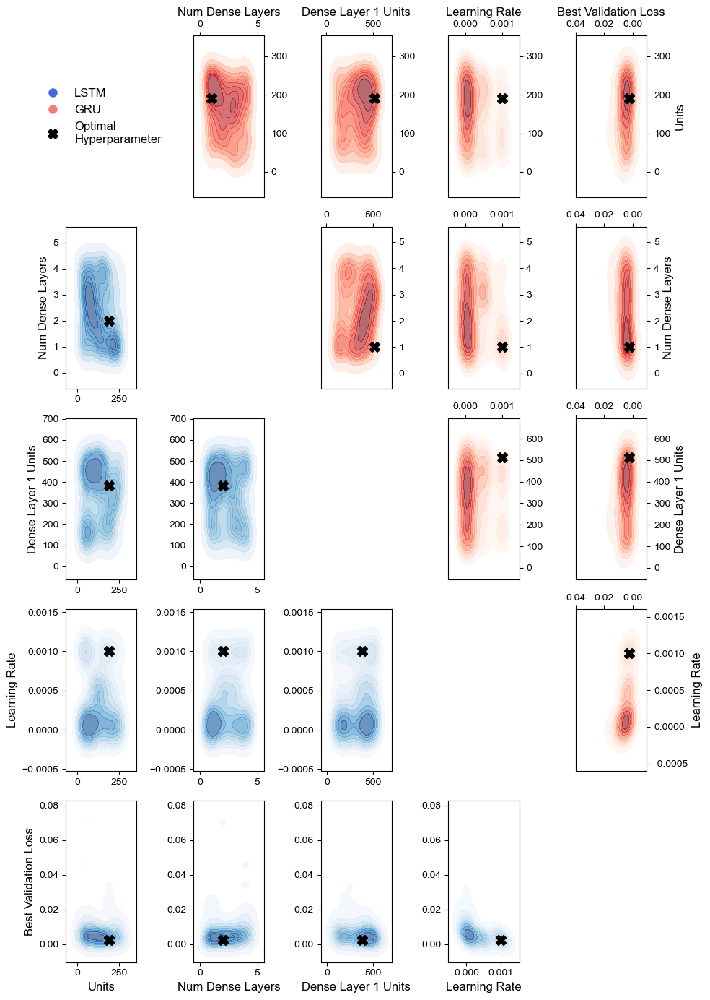

In [461]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

df_results_gru = pd.read_csv("gru_results.csv")  # Load the GRU results
df_results_lstm = pd.read_csv("lstm_results.csv")  # Load the LSTM results

# Rename "GRU Units" and "LSTM Units" to "Units" for consistency
df_results_gru = df_results_gru.rename(columns={"GRU Units": "Units"})
df_results_lstm = df_results_lstm.rename(columns={"LSTM Units": "Units"})

# Identify the best-performing model (lowest validation loss)
best_index_lstm = df_results_lstm["Best Validation Loss"].idxmin()
best_point_lstm = df_results_lstm.loc[best_index_lstm]

best_index_gru = df_results_gru["Best Validation Loss"].idxmin()
best_point_gru = df_results_gru.loc[best_index_gru]

# Define the variables to plot
common_columns = ["Units", "Num Dense Layers", "Dense Layer 1 Units", "Learning Rate", "Best Validation Loss"]
num_vars = len(common_columns)

# Create a grid of subplots
fig, axes = plt.subplots(num_vars, num_vars, figsize=(10, 14))

# Loop through each subplot location
for i in range(num_vars):
    for j in range(num_vars):
        ax = axes[i, j]

        # Row 0, Col 0: Reserve for Legend
        if i == 0 and j == 0:
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_frame_on(False)  # Remove border

            # Create custom legend handles
            legend_elements = [
                plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='royalblue', markersize=10, label='LSTM'),
                plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightcoral', markersize=10, label='GRU'),
                plt.Line2D([0], [0], marker='X', color='black', markersize=10, linestyle='None', label='Optimal\nHyperparameter')
            ]

            ax.legend(handles=legend_elements, loc="center", fontsize=12, frameon=False)
            continue  # Skip plotting in this cell

        # Lower triangle (LSTM plots - Blue)
        if i > j:
            sns.kdeplot(
                x=df_results_lstm[common_columns[j]], 
                y=df_results_lstm[common_columns[i]], 
                fill=True, cmap="Blues", alpha=0.6, ax=ax
            )
            ax.scatter(best_point_lstm[common_columns[j]], best_point_lstm[common_columns[i]], 
                       color="black", marker="X", s=100, label="Best LSTM Model")

        # Upper triangle (GRU plots - Red, FLIPPED axes)
        elif i < j:
            sns.kdeplot(
                x=df_results_gru[common_columns[j]], 
                y=df_results_gru[common_columns[i]], 
                fill=True, cmap="Reds", alpha=0.6, ax=ax
            )
            ax.scatter(best_point_gru[common_columns[j]], best_point_gru[common_columns[i]], 
                       color="black", marker="X", s=100, label="Best GRU Model")

            # 🔄 Flip X and Y axes for GRU
            ax.invert_xaxis()
            ax.invert_yaxis()
            ax.xaxis.tick_top()
            ax.yaxis.tick_right()
            ax.xaxis.set_label_position("top")
            ax.yaxis.set_label_position("right")

            # ✅ **Customize X-axis when "Best Validation Loss" is X-axis in GRU**
            if common_columns[j] == "Best Validation Loss":
                ax.set_xlim(-0.01, 0.04)  # Set custom X-axis range
                ax.set_xticks(np.arange(0, 0.041, 0.02))  # Define tick marks
                ax.set_xticklabels([f"{x:.2f}" for x in np.arange(0, 0.041, 0.02)], rotation=0)  # Rotate labels
            # ✅ **Reverse the Y-axis for ALL GRU plots**
            ax.invert_yaxis()
            ax.invert_xaxis()

            # ✅ **Customize Y-axis when "Learning Rate" is the Y-axis in GRU**
            if common_columns[i] == "Learning Rate":
                ax.set_ylim(-0.0006, 0.0016)  # Set custom Y-axis range
                ax.set_yticks(np.arange(-0.0005, 0.0016, 0.0005))  # Define tick marks
                ax.set_yticklabels([f"{x:.4f}" for x in np.arange(-0.0005, 0.0016, 0.0005)], rotation=0)  # Rotate labels
        else:
            ax.set_visible(False)  # Hide diagonal plots

        # ✅ **Show axis labels only on the outermost rows and columns**
        if j == 0:  # Leftmost column (LSTM y-labels)
            ax.set_ylabel(common_columns[i], fontsize=12)
        elif j == num_vars - 1:  # Rightmost column (GRU y-labels)
            ax.yaxis.set_label_position("right")
            ax.set_ylabel(common_columns[i], fontsize=12)
        else:  # Hide inner y-axis labels
            ax.set_ylabel("")

        if i == num_vars - 1:  # Bottom row (LSTM x-labels)
            ax.set_xlabel(common_columns[j], fontsize=12)
        elif i == 0:  # Top row (GRU x-labels)
            ax.xaxis.set_label_position("top")
            ax.set_xlabel(common_columns[j], fontsize=12)
        else:  # Hide inner x-axis labels
            ax.set_xlabel("")

        # Adjust tick label sizes
        ax.tick_params(axis="both", labelsize=10)

        

plt.tight_layout()
plt.show()


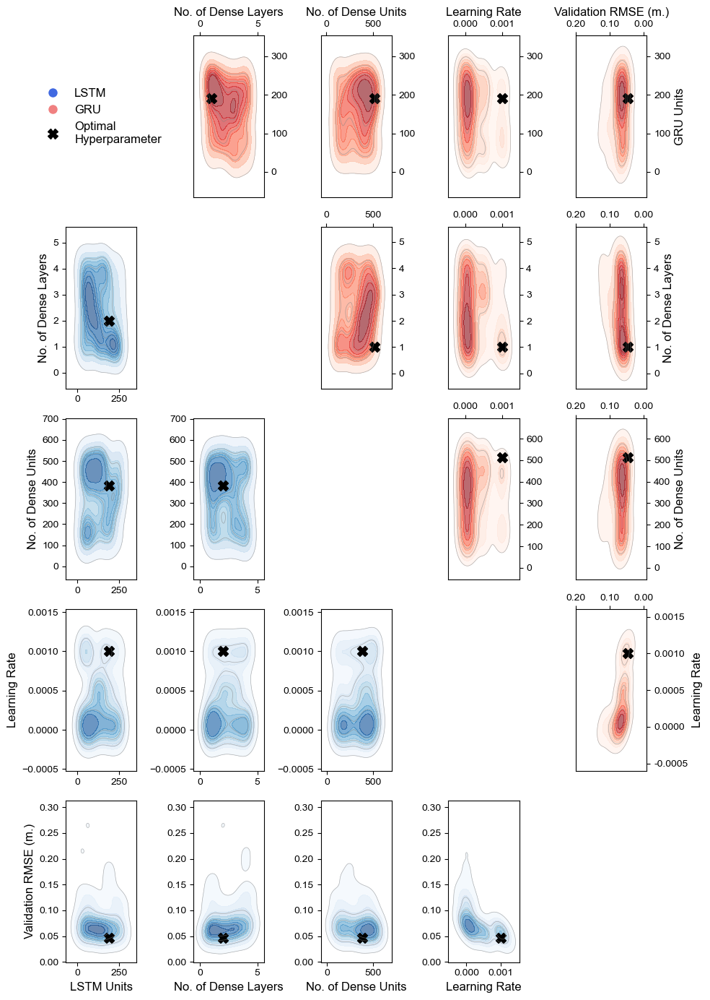

In [462]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Load the GRU and LSTM results
df_results_gru = pd.read_csv("gru_results.csv")  
df_results_lstm = pd.read_csv("lstm_results.csv")  

# Rename "GRU Units" and "LSTM Units" to "Units" for consistency
df_results_gru = df_results_gru.rename(columns={"GRU Units": "Units"})
df_results_lstm = df_results_lstm.rename(columns={"LSTM Units": "Units"})

df_results_lstm["Best Validation Loss"] = np.sqrt(df_results_lstm["Best Validation Loss"])
df_results_gru["Best Validation Loss"] = np.sqrt(df_results_gru["Best Validation Loss"])


# Identify the best-performing model (lowest validation loss)
best_index_lstm = df_results_lstm["Best Validation Loss"].idxmin()
best_point_lstm = df_results_lstm.loc[best_index_lstm]

best_index_gru = df_results_gru["Best Validation Loss"].idxmin()
best_point_gru = df_results_gru.loc[best_index_gru]

# Define the variables to plot
common_columns = ["Units", "Num Dense Layers", "Dense Layer 1 Units", "Learning Rate", "Best Validation Loss"]
num_vars = len(common_columns)

# Define custom axis labels
custom_labels_lstm = {
    "Units": "LSTM Units",  
    "Num Dense Layers": "No. of Dense Layers",
    "Dense Layer 1 Units": "No. of Dense Units",
    "Learning Rate": "Learning Rate",
    "Best Validation Loss": "Validation RMSE (m.)"
}

custom_labels_gru = {
    "Units": "GRU Units",  
    "Num Dense Layers": "No. of Dense Layers",
    "Dense Layer 1 Units": "No. of Dense Units",
    "Learning Rate": "Learning Rate",
    "Best Validation Loss": "Validation RMSE (m.)"
}

# Create a grid of subplots
fig, axes = plt.subplots(num_vars, num_vars, figsize=(10, 14))

# Loop through each subplot location
for i in range(num_vars):
    for j in range(num_vars):
        ax = axes[i, j]

        # Row 0, Col 0: Reserve for Legend
        if i == 0 and j == 0:
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_frame_on(False)  

            # Create custom legend handles
            legend_elements = [
                plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='royalblue', markersize=10, label='LSTM'),
                plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightcoral', markersize=10, label='GRU'),
                plt.Line2D([0], [0], marker='X', color='black', markersize=10, linestyle='None', label='Optimal\nHyperparameter')
            ]

            ax.legend(handles=legend_elements, loc="center", fontsize=12, frameon=False)
            continue  

        # Lower triangle (LSTM plots - Blue)
        if i > j:
            sns.kdeplot(
                x=df_results_lstm[common_columns[j]], 
                y=df_results_lstm[common_columns[i]], 
                fill=True, cmap="Blues", alpha=0.6, ax=ax
            )
            sns.kdeplot(
                x=df_results_lstm[common_columns[j]], 
                y=df_results_lstm[common_columns[i]], 
                color="grey", linewidths=0.5, alpha=0.6, ax=ax, levels=5
            )
            ax.scatter(best_point_lstm[common_columns[j]], best_point_lstm[common_columns[i]], 
                       color="black", marker="X", s=100, label="Best LSTM Model")

        # Upper triangle (GRU plots - Red, FLIPPED axes)
        elif i < j:
            sns.kdeplot(
                x=df_results_gru[common_columns[j]], 
                y=df_results_gru[common_columns[i]], 
                fill=True, cmap="Reds", alpha=0.6, ax=ax
            )
            sns.kdeplot(
                x=df_results_gru[common_columns[j]], 
                y=df_results_gru[common_columns[i]], 
                color="grey", linewidths=0.5, alpha=0.6, ax=ax, levels=5 
            )            

            ax.scatter(best_point_gru[common_columns[j]], best_point_gru[common_columns[i]], 
                       color="black", marker="X", s=100, label="Best GRU Model")

            # 🔄 Flip X and Y axes for GRU
            ax.invert_xaxis()
            ax.invert_yaxis()
            ax.xaxis.tick_top()
            ax.yaxis.tick_right()
            ax.xaxis.set_label_position("top")
            ax.yaxis.set_label_position("right")

            # ✅ Customize X-axis when "Best Validation Loss" is X-axis in GRU
            if common_columns[j] == "Best Validation Loss":
                ax.set_xlim(-0.01, 0.2)  
                ax.set_xticks(np.arange(0, 0.21, 0.10))  
                ax.set_xticklabels([f"{x:.2f}" for x in np.arange(0, 0.21, 0.10)], rotation=0)  

            # ✅ Reverse the Y-axis for ALL GRU plots
            ax.invert_yaxis()
            ax.invert_xaxis()

            # ✅ Customize Y-axis when "Learning Rate" is the Y-axis in GRU
            if common_columns[i] == "Learning Rate":
                ax.set_ylim(-0.0006, 0.0016)  
                ax.set_yticks(np.arange(-0.0005, 0.0016, 0.0005))  
                ax.set_yticklabels([f"{x:.4f}" for x in np.arange(-0.0005, 0.0016, 0.0005)], rotation=0)  
        else:
            ax.set_visible(False)  

        # ✅ Set custom axis labels for LSTM (Lower Triangle)
        if i > j:  
            if j == 0:  
                ax.set_ylabel(custom_labels_lstm.get(common_columns[i], common_columns[i]), fontsize=12)
            if i == num_vars - 1:  
                ax.set_xlabel(custom_labels_lstm.get(common_columns[j], common_columns[j]), fontsize=12)

        # ✅ Set custom axis labels for GRU (Upper Triangle)
        elif i < j:  
            if j == num_vars - 1:  
                ax.yaxis.set_label_position("right")
                ax.set_ylabel(custom_labels_gru.get(common_columns[i], common_columns[i]), fontsize=12)
            if i == 0:  
                ax.xaxis.set_label_position("top")
                ax.set_xlabel(custom_labels_gru.get(common_columns[j], common_columns[j]), fontsize=12)

        # Hide inner labels for a cleaner look
        if j != 0 and j != num_vars - 1:
            ax.set_ylabel("")
        if i != 0 and i != num_vars - 1:
            ax.set_xlabel("")

        # Adjust tick label sizes
        ax.tick_params(axis="both", labelsize=10)

plt.tight_layout()
plt.show()



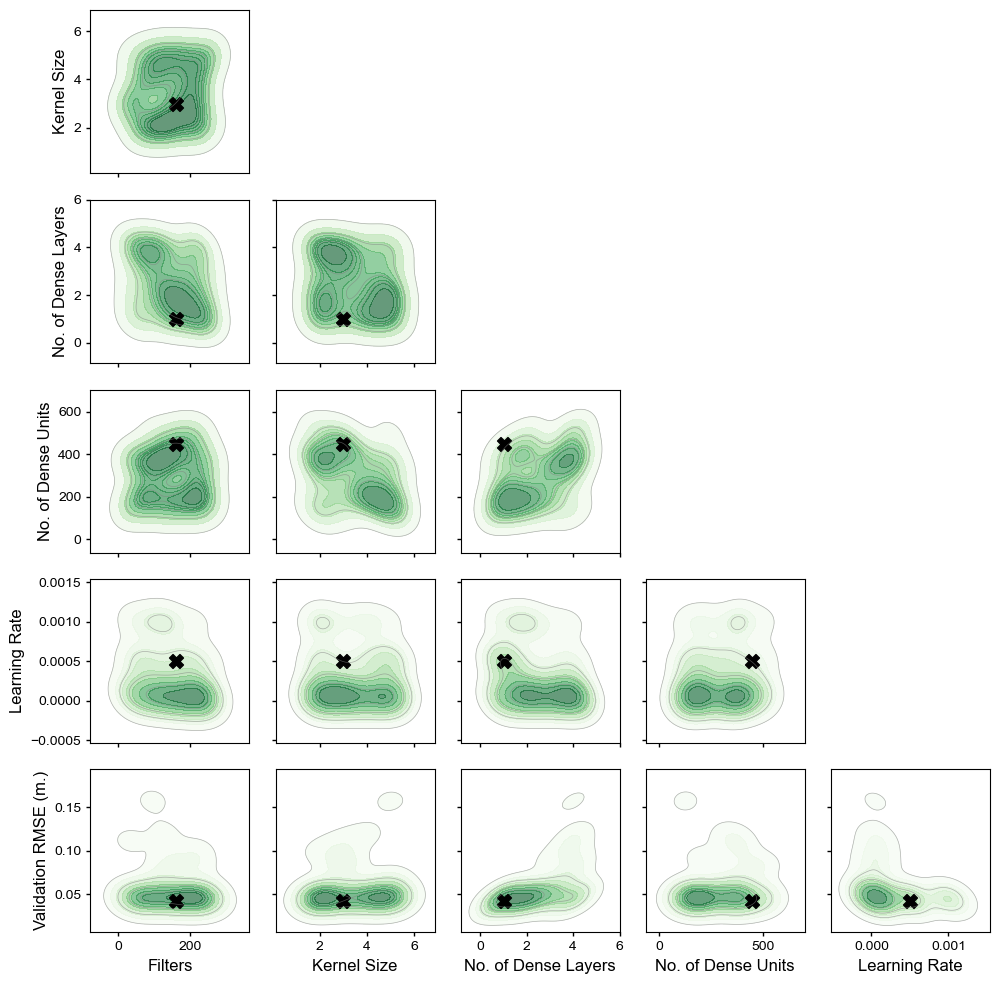

In [463]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Load the CNN results
df_results_cnn = pd.read_csv("cnn_results.csv")  
df_results_cnn["Best Validation Loss"] = np.sqrt(df_results_cnn["Best Validation Loss"])
# Identify the best-performing model (lowest validation loss) in CNN results
best_index_cnn = df_results_cnn["Best Validation Loss"].idxmin()
best_point_cnn = df_results_cnn.loc[best_index_cnn]



# Define the variables to plot (Removed Dropout Rate)
common_columns = ["Filters", "Kernel Size", "Num Dense Layers", "Dense Layer 1 Units", "Learning Rate", "Best Validation Loss"]
num_vars = len(common_columns)

# ✅ Define a mapping for custom axis labels
custom_labels = {
    "Filters": "Filters",  # ✅ Renamed
    "Num Dense Layers": "No. of Dense Layers",  # ✅ Renamed
    "Kernel Size": "Kernel Size",
    "Dense Layer 1 Units": "No. of Dense Units",
    "Learning Rate": "Learning Rate",
    "Best Validation Loss": "Validation RMSE (m.)"
}

# Create a grid of subplots
fig, axes = plt.subplots(num_vars - 1, num_vars - 1, figsize=(10, 10))  # Reduce grid size by 1 to remove top row

# Loop through each subplot location
for i in range(1, num_vars):  # Start from index 1 to remove the top row
    for j in range(i):  # Only plot lower triangle
        ax = axes[i - 1, j]  # Adjust indexing for reduced grid size

        # **Move Legend to Column 4, Row 1**
        if i == 1 and j == 4:
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_frame_on(False)  # Remove border

            # Create custom legend handles
            legend_elements = [
                plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='mediumseagreen', markersize=10, label='CNN'),
                plt.Line2D([0], [0], marker='X', color="black", markersize=10, linestyle="None", label="Optimal\nHyperparameter"),
            ]

            ax.legend(handles=legend_elements, loc="center", fontsize=12, frameon=False)
            continue  # Skip plotting in this cell

        # **Plot KDE in the lower triangle only**
        sns.kdeplot(
            x=df_results_cnn[common_columns[j]], 
            y=df_results_cnn[common_columns[i]], 
            fill=True, cmap="Greens", alpha=0.6, ax=ax, levels=10
        )
        sns.kdeplot(
            x=df_results_cnn[common_columns[j]], 
            y=df_results_cnn[common_columns[i]], 
            color="grey", linewidths=0.5, alpha=0.6, ax=ax, levels=5  # ✅ Contour lines with black edges
        )

        ax.scatter(best_point_cnn[common_columns[j]], best_point_cnn[common_columns[i]], 
                   color="black", marker="X", s=100, label="Best CNN Model")

        # ✅ **Set X and Y Ticks for Kernel Size & No. of Dense Layers**
        if common_columns[j] == "Kernel Size":
            ax.set_xticks(np.arange(2, 7, 2))  
        if common_columns[j] == "Num Dense Layers":
            ax.set_xticks(np.arange(0, 7, 2))  
        if common_columns[i] == "Kernel Size":
            ax.set_yticks(np.arange(2, 7, 2))  
        if common_columns[i] == "Num Dense Layers":
            ax.set_yticks(np.arange(0, 7, 2))  

        # ✅ **Set custom axis labels for the outermost rows and columns**
        if j == 0:  # Leftmost column (Y-axis labels)
            ax.set_ylabel(custom_labels.get(common_columns[i], common_columns[i]), fontsize=12)
        else:  # Hide inner y-axis labels
            ax.set_yticklabels([])
            ax.set_ylabel("")

        if i == num_vars - 1:  # Bottom row (X-axis labels)
            ax.set_xlabel(custom_labels.get(common_columns[j], common_columns[j]), fontsize=12)
        else:  # Hide inner x-axis labels
            ax.set_xticklabels([])
            ax.set_xlabel("")

        # Adjust tick size (keep ticks but remove values inside)
        ax.tick_params(axis="both", labelsize=10, length=3, width=1)

    # **NEW: Hide the upper diagonal axis completely**
    for j in range(i, num_vars - 1):
        axes[i - 1, j].axis("off")  # Hide upper triangle

plt.tight_layout()
plt.show()
